In [1]:
file_path = "/content/Cit-HepTh.txt"

with open(file_path, "r") as file:
    for _ in range(10):
        print(file.readline().strip())


# Directed graph (each unordered pair of nodes is saved once): Cit-HepTh.txt
# Paper citation network of Arxiv High Energy Physics Theory category
# Nodes: 27770 Edges: 352807
# FromNodeId	ToNodeId
1001	9304045
1001	9308122
1001	9309097
1001	9311042
1001	9401139
1001	9404151


In [2]:
import tarfile

with tarfile.open("/content/cit-HepTh-abstracts.tar.gz", "r:gz") as tar:
    tar.extractall(path="/content/cit-HepTh-abstracts")

print(" Abstracts extracted.")




 Abstracts extracted.


In [3]:
import re
from pathlib import Path
import pandas as pd


base_path = Path("/content/cit-HepTh-abstracts")
metadata_records = []

# mapping function for field classification
def map_to_field(raw_text):
    raw_text = raw_text.lower()
    if "phenomenology" in raw_text:
        return "hep-ph"
    elif "experiment" in raw_text:
        return "hep-ex"
    elif "lattice" in raw_text:
        return "hep-lat"
    elif "quantum algebra" in raw_text or "mathematical physics" in raw_text:
        return "hep-th"
    elif any(term in raw_text for term in ["chaotic dynamics", "superconductivity", "quantum hall", "mesoscopic", "statistical mechanics"]):
        return "cond-mat"
    elif any(term in raw_text for term in ["algebraic geometry", "differential geometry", "symplectic", "functional analysis"]):
        return "math-ph"
    elif "theory" in raw_text:
        return "hep-th"
    else:
        return "other"

# Iterate through all files
for year_folder in base_path.iterdir():
    if year_folder.is_dir():
        for file in year_folder.glob("*.abs"):
            try:
                with open(file, "r", encoding="utf-8", errors="ignore") as f:
                    lines = f.readlines()
                paper_id = int(file.stem)
                field_line = next((line for line in lines if "Subj-class:" in line), None)
                if field_line:
                    raw_subject = field_line.replace("Subj-class:", "").strip()
                    field = map_to_field(raw_subject)
                    metadata_records.append({"paper_id": paper_id, "field": field})
            except Exception as e:
                print(f"Error reading {file.name}: {e}")


metadata_df = pd.DataFrame(metadata_records)
metadata_df.to_csv("/content/metadata.csv", index=False)
metadata_df['field'].value_counts(), metadata_df.head()


(field
 hep-th      1900
 math-ph      439
 cond-mat     204
 Name: count, dtype: int64,
    paper_id   field
 0    301062  hep-th
 1    304077  hep-th
 2    304190  hep-th
 3    301121  hep-th
 4    303080  hep-th)

In [4]:
# Clean up
metadata_df["field"] = metadata_df["field"].str.strip().str.replace(r"[^\w\-]+", "", regex=True)


metadata_df.to_csv("/content/metadata.csv", index=False)

metadata_df['field'].value_counts()


,count
field,
hep-th,1900
math-ph,439
cond-mat,204


In [5]:
import gzip

#Load the submission dates file
with gzip.open("/content/cit-HepTh-dates.txt.gz", 'rt') as f:
    time_df = pd.read_csv(f, sep='\t', header=None, names=["paper_id", "date"])

# Remove comments and clean paper IDs
time_df = time_df[~time_df['paper_id'].astype(str).str.startswith('#')].copy()
time_df['paper_id'] = time_df['paper_id'].astype(int)
time_df['date'] = pd.to_datetime(time_df['date'])

# Load your metadata (fields per paper)
metadata = pd.read_csv("/content/metadata.csv")  # Update path if needed

# Merge metadata with dates
merged_df = pd.merge(metadata, time_df, on="paper_id", how="inner")

# Add 'year' column
merged_df['year'] = merged_df['date'].dt.year

# save
merged_df.to_csv("/content/metadata_with_dates.csv", index=False)


print(" metadata_with_dates.csv created.")
merged_df.head()


 metadata_with_dates.csv created.


,paper_id,field,date,year
0,9312214,hep-th,1993-12-02,1993
1,9312213,hep-th,1993-12-02,1993
2,9310201,hep-th,1993-10-01,1993
3,9312210,hep-th,1993-12-01,1993
4,9605213,math-ph,1996-05-02,1996


In [ ]:
#!pip uninstall networkx -y
#!pip install networkx

In [ ]:
import networkx as nx
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

 Number of Papers (Nodes): 27770
 Number of Citations (Edges): 352807

 COIN Matrix (Citation Flow Between Fields):
          cond-mat  hep-th  math-ph
cond-mat       125     122        7
hep-th          93    2862      362
math-ph          0     187      833
 Introspection for cond-mat: 0.4921
 Introspection for hep-th: 0.8628
 Introspection for math-ph: 0.8167
 Export-Import Ratio for cond-mat: 1.3871
 Export-Import Ratio for hep-th: 1.4725
 Export-Import Ratio for math-ph: 0.5068


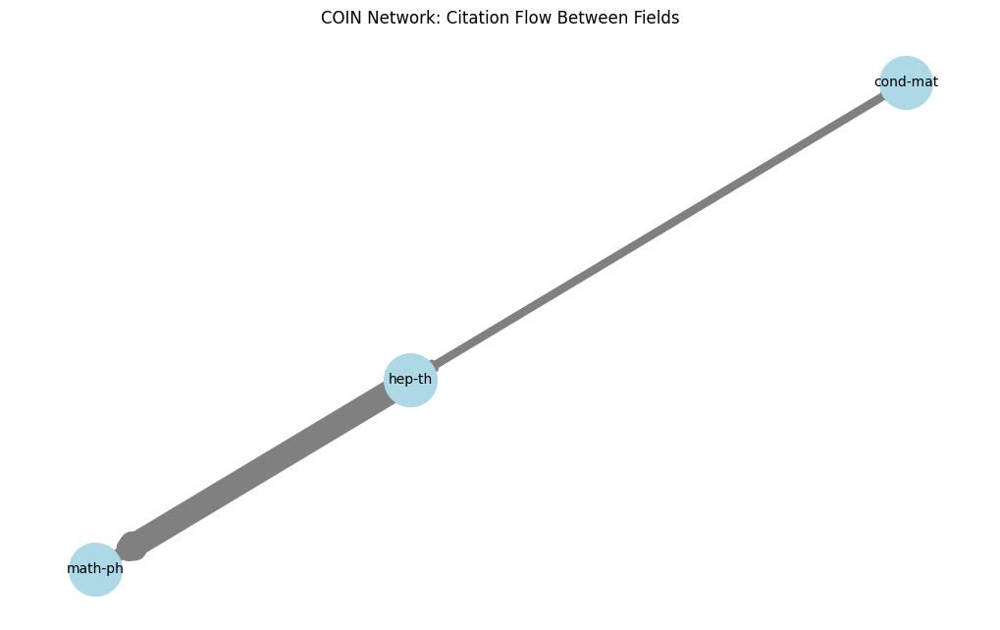

In [ ]:
# load data
file_path = "/content/Cit-HepTh.txt"

edges = []
with open(file_path, "r") as f:
    for line in f:
        if line.startswith("#"):
            continue
        source, target = map(int, line.strip().split())
        edges.append((source, target))

G = nx.DiGraph()
G.add_edges_from(edges)

print(f" Number of Papers (Nodes): {G.number_of_nodes()}")
print(f" Number of Citations (Edges): {G.number_of_edges()}")

# Load Metadata and Assign Fields
metadata = pd.read_csv("metadata.csv")
paper_field_map = dict(zip(metadata["paper_id"], metadata["field"]))
nx.set_node_attributes(G, paper_field_map, "field")

#  COIN Matrix
fields = sorted(metadata["field"].unique())
field_indices = {field: idx for idx, field in enumerate(fields)}
n = len(fields)
coin_matrix = np.zeros((n, n), dtype=int)

for u, v in G.edges():
    field_u = G.nodes[u].get("field")
    field_v = G.nodes[v].get("field")
    if field_u and field_v:
        i, j = field_indices[field_u], field_indices[field_v]
        coin_matrix[i, j] += 1

coin_df = pd.DataFrame(coin_matrix, index=fields, columns=fields)
print("\n COIN Matrix (Citation Flow Between Fields):")
print(coin_df)

# Computing Self-Citation Ratio (Introspection) per Field
introspection_scores = {}
for field in fields:
    i = field_indices[field]
    self_cites = coin_matrix[i, i]
    total_cites = np.sum(coin_matrix[i, :])
    ratio = self_cites / total_cites if total_cites > 0 else 0
    print(f" Introspection for {field}: {ratio:.4f}")

# Export-Import Ratio per Field
export_import_scores = {}
for field in fields:
    i = field_indices[field]
    exports = np.sum(coin_matrix[i, :]) - coin_matrix[i, i]
    imports = np.sum(coin_matrix[:, i]) - coin_matrix[i, i]
    ratio = exports / imports if imports > 0 else float('inf')
    print(f" Export-Import Ratio for {field}: {ratio:.4f}")

# Visualize the COIN Network
H = nx.DiGraph()
for i, f_from in enumerate(fields):
    for j, f_to in enumerate(fields):
        if coin_matrix[i, j] > 0 and f_from != f_to:
            H.add_edge(f_from, f_to, weight=coin_matrix[i, j])

pos = nx.spring_layout(H, seed=42)
plt.figure(figsize=(10, 6))
edges, weights = zip(*nx.get_edge_attributes(H, 'weight').items())
nx.draw(H, pos, with_labels=True, node_size=1500, node_color="lightblue", font_size=10, arrows=True)
nx.draw_networkx_edges(H, pos, edge_color='gray', width=[w/20 for w in weights])
plt.title("COIN Network: Citation Flow Between Fields")
plt.show()


Loading and preparing data
Building citation graph...
Analyzing window: 1993-1994...
Analyzing window: 1995-1996...
Analyzing window: 1997-1998...
Analyzing window: 1999-2000...
Analyzing window: 2001-2002...


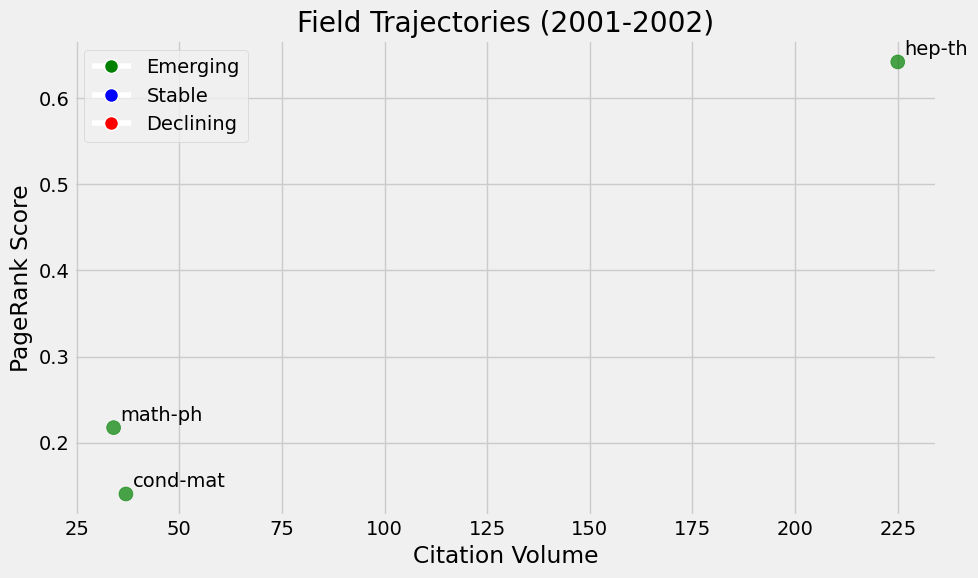

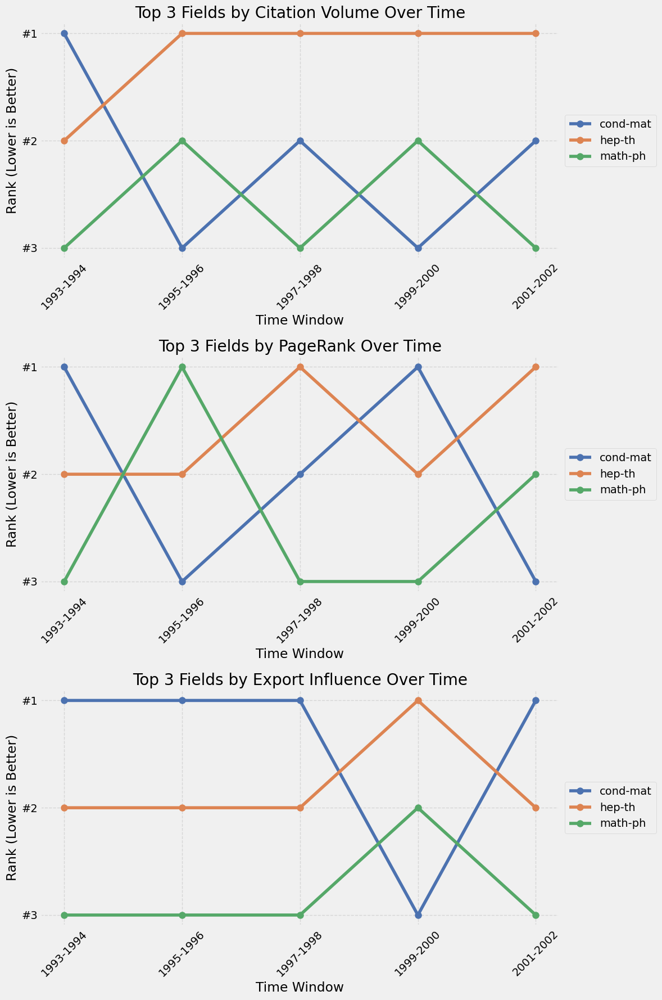

/tmp/ipython-input-9-828920744.py:183: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axes[idx].set_xticklabels(time_labels, rotation=45)
/tmp/ipython-input-9-828920744.py:183: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axes[idx].set_xticklabels(time_labels, rotation=45)
/tmp/ipython-input-9-828920744.py:183: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axes[idx].set_xticklabels(time_labels, rotation=45)
/tmp/ipython-input-9-828920744.py:183: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axes[idx].set_xticklabels(time_labels, rotation=45)


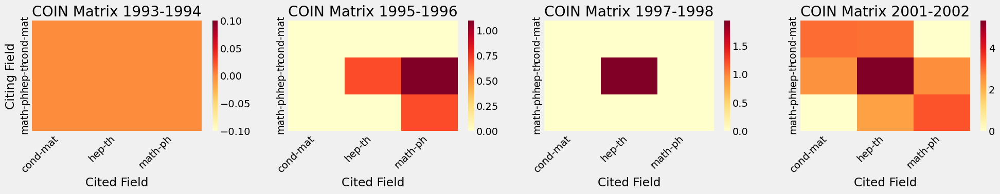

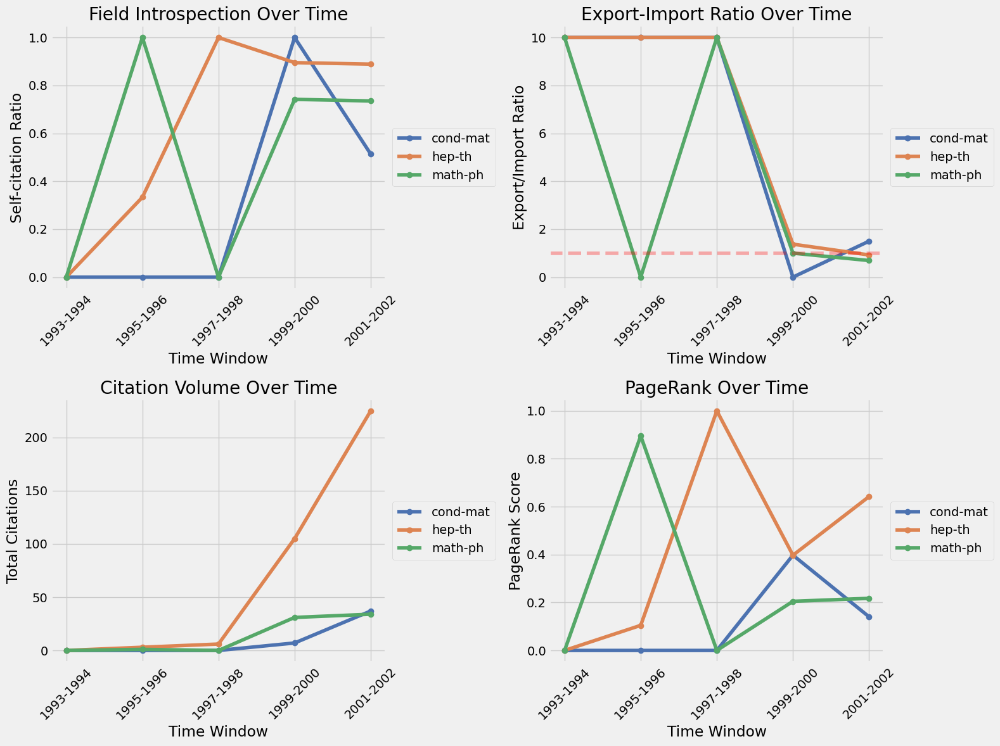

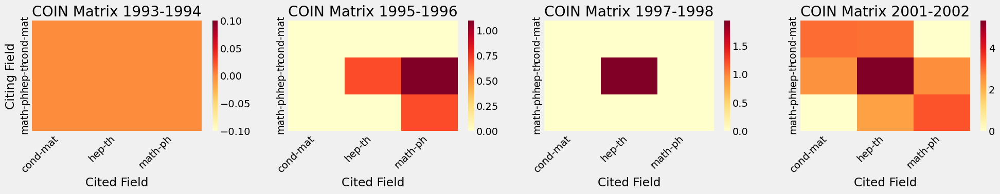

In [ ]:
import networkx as nx
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
from collections import defaultdict
from pathlib import Path
from matplotlib.lines import Line2D
plt.style.use('fivethirtyeight')
sns.set_palette("deep")


def time_sliced_analysis(citation_path, metadata_path, window_size=2):

    print("Loading and preparing data")

    # Loading metadata and convert date info
    metadata = pd.read_csv(metadata_path)
    metadata['date'] = pd.to_datetime(metadata['date'])
    metadata['year'] = metadata['date'].dt.year

    # Mapping each paper to its field
    paper_to_field = dict(zip(metadata["paper_id"], metadata["field"]))

    # Reading citation edges
    print("Building citation graph...")
    citations = []
    with open(citation_path, "r") as f:
        for line in f:
            if line.startswith("#"): continue
            source, target = map(int, line.strip().split())
            citations.append((source, target))

    # Create directed graph from citations
    G = nx.DiGraph()
    G.add_edges_from(citations)

    # Field metadata to graph nodes
    nx.set_node_attributes(G, paper_to_field, "field")

    # Time window
    min_year, max_year = metadata['year'].min(), metadata['year'].max()
    time_windows = [(year, year + window_size - 1) for year in range(min_year, max_year + 1, window_size)]

    fields = sorted(metadata['field'].unique())
    field_index = {field: i for i, field in enumerate(fields)}
    num_fields = len(fields)

    # Storage for metrics over time
    time_series = {
        'introspection': {f: [] for f in fields},
        'export_import': {f: [] for f in fields},
        'pagerank': {f: [] for f in fields},
        'citation_volume': {f: [] for f in fields},
        'coin_matrices': [],
        'time_labels': []
    }

    # Analyze each time slice
    for start_year, end_year in time_windows:
        print(f"Analyzing window: {start_year}-{end_year}...")

        # Get papers published in this time window
        papers_in_window = metadata[
            (metadata['year'] >= start_year) & (metadata['year'] <= end_year)
        ]['paper_id'].tolist()

        # Build subgraph for this window
        G_window = G.subgraph(papers_in_window)

        # Create COIN matrix rows = citing field, cols = cited field
        coin_matrix = np.zeros((num_fields, num_fields), dtype=int)

        for citing, cited in G_window.edges():
            field_from = G_window.nodes[citing].get("field")
            field_to = G_window.nodes[cited].get("field")

            if field_from in field_index and field_to in field_index:
                i, j = field_index[field_from], field_index[field_to]
                coin_matrix[i, j] += 1

        # Store COIN matrix and label
        time_series['coin_matrices'].append(coin_matrix)
        time_series['time_labels'].append(f"{start_year}-{end_year}")


        for field in fields:
            i = field_index[field]

            total_outgoing = np.sum(coin_matrix[i, :])
            total_incoming = np.sum(coin_matrix[:, i])

            #  Introspection (Self-citation ratio)
            self_citations = coin_matrix[i, i]
            introspection_ratio = self_citations / total_outgoing if total_outgoing > 0 else 0
            time_series['introspection'][field].append(introspection_ratio)

            #  Export/Import Ratio
            exports = total_outgoing - self_citations
            imports = total_incoming - self_citations
            ratio = exports / imports if imports > 0 else 10  # Cap infinite values
            time_series['export_import'][field].append(ratio)

            #  Citation Volume
            time_series['citation_volume'][field].append(total_outgoing)

        #  PageRank on field-level network
        field_graph = nx.DiGraph()
        for i, f_from in enumerate(fields):
            for j, f_to in enumerate(fields):
                weight = coin_matrix[i, j]
                if weight > 0:
                    field_graph.add_edge(f_from, f_to, weight=weight)

        try:
            pagerank = nx.pagerank(field_graph, alpha=0.85, weight='weight')
        except:
            pagerank = {f: 0 for f in fields}

        for field in fields:
            time_series['pagerank'][field].append(pagerank.get(field, 0))

    return time_series, fields, time_series['time_labels']

def visualize_coin_evolution(time_series, fields, time_labels, sample_points=4):

    n_windows = len(time_series['coin_matrices'])

    # Pick equally spaced sample points (or use all if fewer)
    indices = (list(range(n_windows)) if n_windows <= sample_points else
               [int(i * (n_windows-1) / (sample_points-1)) for i in range(sample_points)])

    fig, axes = plt.subplots(1, len(indices), figsize=(5*len(indices), 4))
    if len(indices) == 1:
        axes = [axes]  # Ensure axes is always iterable

    for i, idx in enumerate(indices):
        matrix = np.log1p(time_series['coin_matrices'][idx])  # log1p for stability
        label = time_labels[idx]

        sns.heatmap(matrix, ax=axes[i], cmap="YlOrRd",
                    xticklabels=fields, yticklabels=fields, cbar=True)

        axes[i].set_title(f"COIN Matrix {label}")
        axes[i].set_xlabel("Cited Field")
        if i == 0:
            axes[i].set_ylabel("Citing Field")

        # Improve readability
        axes[i].set_xticklabels(axes[i].get_xticklabels(), rotation=45, ha="right")

    plt.tight_layout()
    return fig

def visualize_field_trends(time_series, fields, time_labels):

    fig, axes = plt.subplots(2, 2, figsize=(16, 12))
    axes = axes.flatten()

    metric_names = ['introspection', 'export_import', 'citation_volume', 'pagerank']
    y_labels = [
        "Self-citation Ratio",
        "Export/Import Ratio",
        "Total Citations",
        "PageRank Score"
    ]
    titles = [
        "Field Introspection Over Time",
        "Export-Import Ratio Over Time",
        "Citation Volume Over Time",
        "PageRank Over Time"
    ]

    for idx, metric in enumerate(metric_names):
        for field in fields:
            series = time_series[metric][field]
            if len(series) == len(time_labels):
                axes[idx].plot(time_labels, series, marker='o', label=field)

        axes[idx].set_title(titles[idx])
        axes[idx].set_xlabel("Time Window")
        axes[idx].set_ylabel(y_labels[idx])
        axes[idx].set_xticklabels(time_labels, rotation=45)
        axes[idx].legend(loc='center left', bbox_to_anchor=(1, 0.5))

        if metric == "export_import":
            axes[idx].axhline(y=1, color='r', linestyle='--', alpha=0.3)

    plt.tight_layout()
    return fig

def field_trajectory_analysis(time_series, fields, time_labels):

    growth = {'citation_volume': {}, 'pagerank': {}, 'combined_score': {}}

    for field in fields:
        #  Citation volume growth
        v0 = time_series['citation_volume'][field][0]
        v1 = time_series['citation_volume'][field][-1]
        growth['citation_volume'][field] = (v1 - v0) / v0 if v0 else v1

        #  PageRank growth
        p0 = time_series['pagerank'][field][0]
        p1 = time_series['pagerank'][field][-1]
        growth['pagerank'][field] = (p1 - p0) / p0 if p0 else p1

        #  Combined score
        growth['combined_score'][field] = (
            growth['citation_volume'][field] + growth['pagerank'][field]) / 2

    # Classify fields
    trajectories = {}
    for field, score in growth['combined_score'].items():
        if score > 0.5:
            trajectories[field] = "Emerging"
        elif score < -0.3:
            trajectories[field] = "Declining"
        else:
            trajectories[field] = "Stable"

    # Scatterplot
    fig, ax = plt.subplots(figsize=(10, 6))
    colors = {"Emerging": "green", "Stable": "blue", "Declining": "red"}
    x, y, c, labels = [], [], [], []

    for field in fields:
        if field in trajectories:
            x.append(time_series['citation_volume'][field][-1])
            y.append(time_series['pagerank'][field][-1])
            c.append(colors[trajectories[field]])
            labels.append(field)

    scatter = ax.scatter(x, y, c=c, s=100, alpha=0.7)
    for i, label in enumerate(labels):
        ax.annotate(label, (x[i], y[i]), xytext=(5, 5), textcoords='offset points')

    ax.set_title(f"Field Trajectories ({time_labels[-1]})")
    ax.set_xlabel("Citation Volume")
    ax.set_ylabel("PageRank Score")

    legend_elements = [Line2D([0], [0], marker='o', color='w',
                              markerfacecolor=color, markersize=10, label=label)
                       for label, color in colors.items()]
    ax.legend(handles=legend_elements)

    plt.tight_layout()
    return trajectories, fig

def dynamic_field_rankings(time_series, fields, time_labels):

    rankings = {'citation_volume': [], 'pagerank': [], 'export_influence': []}

    for t in range(len(time_labels)):
        # Prepare rankings for each metric at time t
        for metric in rankings:
            series = time_series['citation_volume'] if metric == 'citation_volume' else \
                     time_series['pagerank'] if metric == 'pagerank' else \
                     time_series['export_import']

            ranked = sorted(
                [(f, series[f][t]) for f in fields if t < len(series[f])],
                key=lambda x: x[1], reverse=True
            )
            rankings[metric].append(ranked)

    # Plot rankings
    top_n = min(5, len(fields))
    fig, axes = plt.subplots(3, 1, figsize=(12, 18))
    metrics = ['Citation Volume', 'PageRank', 'Export Influence']

    for i, (metric, label) in enumerate(zip(rankings, metrics)):
        plot_ranking_evolution(rankings[metric], time_labels, label, axes[i], top_n)

    plt.tight_layout()
    return rankings, fig

def plot_ranking_evolution(rankings, time_labels, metric_name, ax, top_n):

    field_ranks = defaultdict(list)

    for t, ranking in enumerate(rankings):
        for rank, (field, _) in enumerate(ranking[:top_n]):
            field_ranks[field].append((t, rank))

    for field, points in field_ranks.items():
        times, ranks = zip(*points)
        ax.plot(times, ranks, 'o-', label=field, markersize=8)

    ax.set_title(f"Top {top_n} Fields by {metric_name} Over Time")
    ax.set_xlabel("Time Window")
    ax.set_ylabel("Rank (Lower is Better)")
    ax.set_yticks(range(top_n))
    ax.set_yticklabels([f"#{i+1}" for i in range(top_n)])
    ax.set_xticks(range(len(time_labels)))
    ax.set_xticklabels(time_labels, rotation=45)
    ax.invert_yaxis()
    ax.grid(True, linestyle='--', alpha=0.7)
    ax.legend(loc='center left', bbox_to_anchor=(1, 0.5))

citation_path = "/content/Cit-HepTh.txt"
metadata_path = "/content/metadata_with_dates.csv"
output_dir = "/content/time_analysis_results"



time_series, fields, time_labels = time_sliced_analysis(
    citation_path,
    metadata_path,
    window_size=2
)

trajectories, fig1 = field_trajectory_analysis(time_series, fields, time_labels)
rankings, fig2 = dynamic_field_rankings(time_series, fields, time_labels)

plt.show()
visualize_field_trends(time_series, fields, time_labels)
visualize_coin_evolution(time_series, fields, time_labels)

Loading and preparing data
Building citation graph...
Analyzing window: 1993-1994...
Analyzing window: 1995-1996...
Analyzing window: 1997-1998...
Analyzing window: 1999-2000...
Analyzing window: 2001-2002...
Creating knowledge graph visualizations...


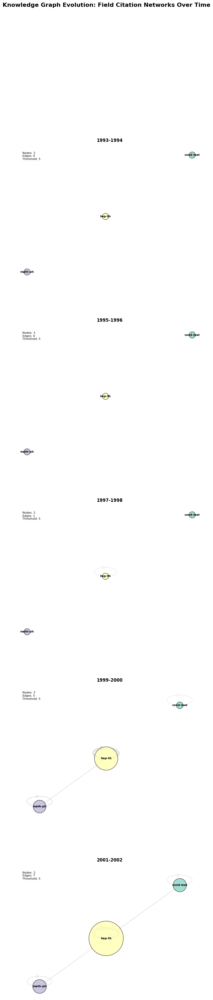

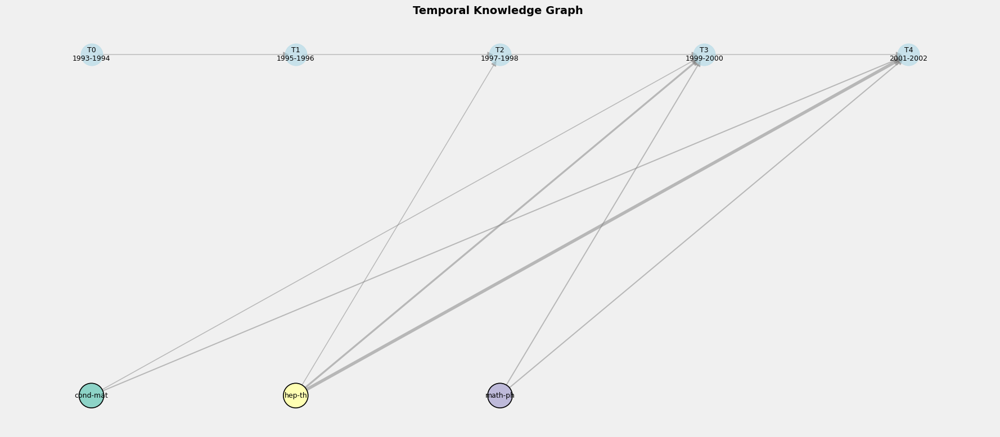

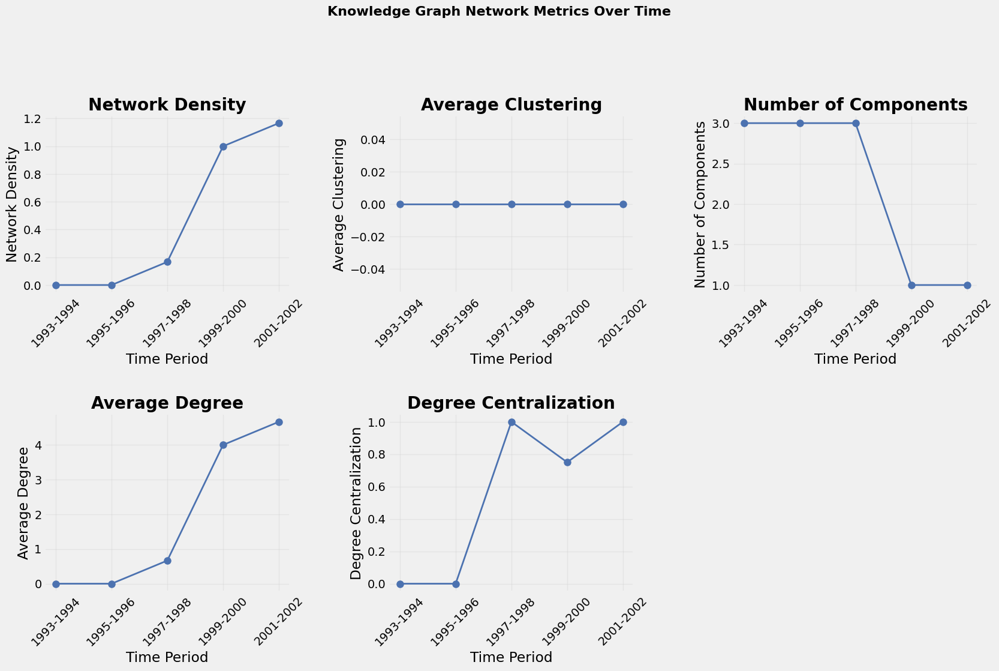

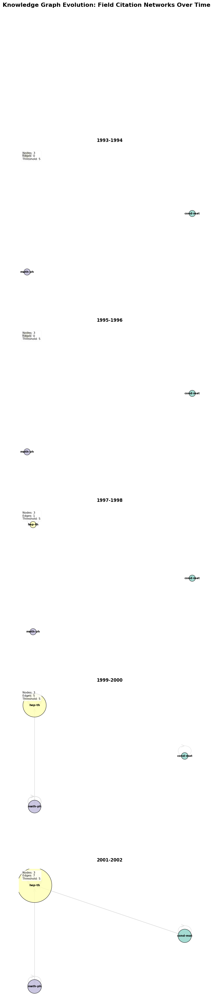

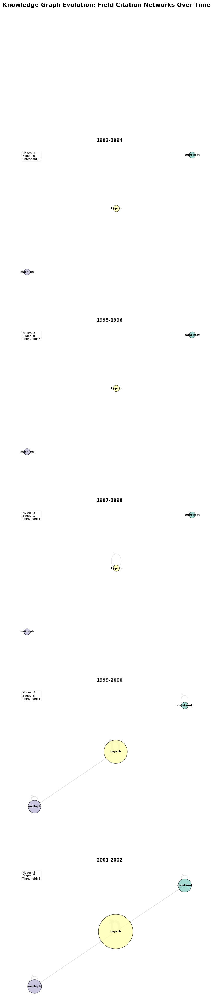







Knowledge graph analysis complete! Results saved to /content/knowledge_graph_results


In [ ]:
import matplotlib.patches as patches

def create_knowledge_graph_facets(time_series, fields, time_labels, threshold=3, layout_type='spring'):
    """
    Generate vertically stacked knowledge graphs across time periods.
    Creates clear visual separation between temporal windows for better readability.
    """
    import matplotlib.pyplot as plt
    import matplotlib.gridspec as gridspec
    from matplotlib.lines import Line2D
    import numpy as np

    n_windows = len(time_series['coin_matrices'])

    # Create figure with generous vertical spacing between subplots
    fig = plt.figure(figsize=(8, 6 * n_windows + 2 * n_windows))
    fig.suptitle(
        'Knowledge Graph Evolution: Field Citation Networks Over Time',
        fontsize=16, fontweight='bold', y=1.02
    )
    fig.set_facecolor("white")

    # Use grid layout with spacing rows between actual plot rows
    gs = gridspec.GridSpec(n_windows * 2 - 1, 1, height_ratios=[1 if i % 2 == 0 else 0.15 for i in range(n_windows * 2 - 1)])

    # Create axes only for plot rows (skip spacing rows)
    axes = [fig.add_subplot(gs[i]) for i in range(0, n_windows * 2, 2)]

    # Generate consistent color palette for academic fields
    colors = generate_field_colors(fields)

    # Create base layout using aggregated citation patterns across all periods
    aggregate_matrix = sum(time_series['coin_matrices'])
    base_graph = create_field_graph(aggregate_matrix, fields, threshold=1)

    # Apply selected network layout algorithm
    if layout_type == 'spring':
        base_pos = nx.spring_layout(base_graph, k=2, iterations=50, seed=42)
    elif layout_type == 'circular':
        base_pos = nx.circular_layout(base_graph)
    else:
        base_pos = nx.kamada_kawai_layout(base_graph)

    # Normalize edge weights across all time periods for consistent visualization
    max_citations = max([np.max(matrix) for matrix in time_series['coin_matrices']])

    # Generate network visualization for each time period
    for i, (coin_matrix, time_label) in enumerate(zip(time_series['coin_matrices'], time_labels)):
        if i >= len(axes):
            break
        ax = axes[i]
        G = create_field_graph(coin_matrix, fields, threshold)
        # Maintain consistent node positions across time periods
        pos = {node: base_pos[node] for node in G.nodes() if node in base_pos}
        draw_knowledge_graph(G, pos, ax, colors, coin_matrix, fields, time_label, max_citations, threshold)



    return fig

def create_field_graph(coin_matrix, fields, threshold=3):
    """
    Build directed graph from citation co-occurrence matrix.
    Only includes edges where citation frequency exceeds threshold.
    """
    G = nx.DiGraph()
    G.add_nodes_from(fields)

    # Create weighted edges for significant citation relationships
    for i, field_from in enumerate(fields):
        for j, field_to in enumerate(fields):
            citations = coin_matrix[i, j]
            if citations >= threshold:
                G.add_edge(field_from, field_to, weight=citations)
    return G

def draw_knowledge_graph(G, pos, ax, colors, coin_matrix, fields, time_label, max_citations, threshold):
    """
    Render single time period network with academic visualization standards.
    Node sizes indicate citation activity, edge thickness shows relationship strength.
    """
    ax.clear()
    ax.set_title(f'{time_label}', fontsize=12, fontweight='bold', pad=20)

    # Display informative message for sparse networks
    if len(G.nodes()) == 0:
        ax.text(0.5, 0.5, 'No connections\nabove threshold', ha='center', va='center',
                transform=ax.transAxes, fontsize=10, style='italic')
        ax.set_xlim(0, 1)
        ax.set_ylim(0, 1)
        ax.axis('off')
        return

    # Scale node sizes based on total citation activity per field
    node_sizes = []
    for field in G.nodes():
        idx = fields.index(field)
        total_citations = np.sum(coin_matrix[idx, :]) + np.sum(coin_matrix[:, idx])
        node_sizes.append(max(300, total_citations * 20))

    # Draw edges with thickness proportional to citation strength
    edges = G.edges(data=True)
    edge_weights = [d['weight'] for u, v, d in edges]
    if edge_weights:
        min_weight, max_weight = min(edge_weights), max(edge_weights)
        edge_widths = [1 + 5 * (w - min_weight) / (max_weight - min_weight + 1e-6) for w in edge_weights]
        nx.draw_networkx_edges(G, pos, ax=ax, width=edge_widths, edge_color='lightgray',
                               alpha=0.6, arrows=True, arrowsize=20, arrowstyle='->')

    # Draw nodes with field-specific colors and activity-based sizing
    node_colors = [colors[node] for node in G.nodes()]
    nx.draw_networkx_nodes(G, pos, ax=ax, node_color=node_colors, node_size=node_sizes,
                           alpha=0.8, edgecolors='black', linewidths=1)
    nx.draw_networkx_labels(G, pos, ax=ax, font_size=8, font_weight='bold', font_color='black')

    # Add network statistics box for quantitative reference
    stats_text = f"Nodes: {len(G.nodes())}\nEdges: {len(G.edges())}\nThreshold: {threshold}"
    ax.text(0.02, 0.98, stats_text, transform=ax.transAxes, fontsize=8, verticalalignment='top',
            bbox=dict(boxstyle='round,pad=0.3', facecolor='white', alpha=0.8))
    ax.axis('off')

def generate_field_colors(fields):

    n_fields = len(fields)
    palette = sns.color_palette("Set3", n_fields) if n_fields <= 10 else sns.color_palette("husl", n_fields)
    return {field: palette[i] for i, field in enumerate(fields)}

def create_temporal_knowledge_graph(time_series, fields, time_labels, selected_fields=None, threshold=5):
    """
    Creating bipartite network showing field activity across time periods.
    """
    # Focus on top fields to avoid visual clutter
    if selected_fields is None:
        selected_fields = fields[:6]

    fig, ax = plt.subplots(figsize=(18, 8))
    G_temporal = nx.DiGraph()

    # Create two types of nodes: time periods and academic fields
    time_nodes = [f"T{t}_{label}" for t, label in enumerate(time_labels)]
    field_nodes = selected_fields

    # Add nodes with type labels for bipartite structure
    for tn in time_nodes:
        G_temporal.add_node(tn, node_type='time')
    for field in field_nodes:
        G_temporal.add_node(field, node_type='field')

    # Link consecutive time periods to show temporal flow
    for i in range(len(time_nodes) - 1):
        G_temporal.add_edge(time_nodes[i], time_nodes[i + 1], weight=1)

    # Connect fields to time periods where they show significant activity
    for t, (coin_matrix, label) in enumerate(zip(time_series['coin_matrices'], time_labels)):
        time_node = f"T{t}_{label}"
        for i, field in enumerate(fields):
            if field in field_nodes:
                total_activity = np.sum(coin_matrix[i, :]) + np.sum(coin_matrix[:, i])
                if total_activity >= threshold:
                    G_temporal.add_edge(field, time_node, weight=total_activity)

    # Position nodes in clear bipartite layout
    pos = {}
    spacing = 3

    # Time nodes arranged horizontally to show chronological progression
    for i, tn in enumerate(time_nodes):
        pos[tn] = (i * spacing, 0)

    # Field nodes positioned below for clear separation
    for j, field in enumerate(field_nodes):
        pos[field] = (j * spacing, -3)

    # Apply consistent field color scheme from main analysis
    colors = generate_field_colors(field_nodes)

    # Draw field nodes with distinctive academic field styling
    nx.draw_networkx_nodes(G_temporal, pos, nodelist=field_nodes,
                           node_color=[colors[f] for f in field_nodes],
                           node_size=1000, edgecolors='black', linewidths=1.2, ax=ax)

    # Draw time nodes with temporal period styling
    nx.draw_networkx_nodes(G_temporal, pos, nodelist=time_nodes,
                           node_color='lightblue', node_size=800, alpha=0.6, ax=ax)

    # Draw edges with thickness indicating citation activity level
    edges = G_temporal.edges(data=True)
    weights = [d['weight'] for _, _, d in edges]
    max_weight = max(weights) if weights else 1
    widths = [1 + 3 * w / max_weight for w in weights]

    nx.draw_networkx_edges(G_temporal, pos, edgelist=edges, width=widths,
                           alpha=0.5, edge_color='gray', arrows=True, arrowsize=15, ax=ax)

    # Format node labels for academic readability
    labels = {n: n.replace('_', '\n') if n.startswith('T') else n for n in G_temporal.nodes()}
    nx.draw_networkx_labels(G_temporal, pos, labels=labels, font_size=9, ax=ax)

    ax.set_title("Temporal Knowledge Graph ", fontsize=14, fontweight='bold')
    ax.axis('off')
    plt.tight_layout()
    return fig

def analyze_knowledge_graph_metrics(time_series, fields, time_labels, threshold=3):
    """
    Calculate standard network metrics to track structural evolution over time.
    Provides quantitative measures of network connectivity and organization.
    """
    # Track key network structure metrics across time periods
    metrics = {
        'density': [], 'avg_clustering': [], 'num_components': [],
        'avg_degree': [], 'centralization': []
    }

    # Compute metrics for each temporal window
    for coin_matrix in time_series['coin_matrices']:
        G = create_field_graph(coin_matrix, fields, threshold)

        # Handle periods with no significant connections
        if G.number_of_nodes() == 0:
            for key in metrics:
                metrics[key].append(0)
            continue

        # Calculate standard graph theory metrics
        metrics['density'].append(nx.density(G))
        G_undirected = G.to_undirected()
        metrics['avg_clustering'].append(nx.average_clustering(G_undirected))
        metrics['num_components'].append(nx.number_weakly_connected_components(G))

        # Compute degree-based measures of network centralization
        degrees = [d for _, d in G.degree()]
        metrics['avg_degree'].append(np.mean(degrees) if degrees else 0)
        centralities = list(nx.degree_centrality(G).values())
        max_c = max(centralities) if centralities else 0
        metrics['centralization'].append(
            sum(max_c - c for c in centralities) / (len(centralities) - 1) if len(centralities) > 1 else 0
        )

    # Create dashboard of metric evolution over time
    fig, axes = plt.subplots(2, 3, figsize=(18, 12))
    axes = axes.flatten()
    metric_names = list(metrics.keys())
    metric_labels = [
        'Network Density', 'Average Clustering', 'Number of Components',
        'Average Degree', 'Degree Centralization'
    ]

    # Plot time series for each network characteristic
    for i, (metric, label) in enumerate(zip(metric_names, metric_labels)):
        if i < len(axes):
            axes[i].plot(time_labels, metrics[metric], marker='o', linewidth=2, markersize=8)
            axes[i].set_title(label, fontweight='bold')
            axes[i].set_xlabel('Time Period')
            axes[i].set_ylabel(label)
            axes[i].grid(True, alpha=0.3)
            axes[i].tick_params(axis='x', rotation=45)

    # Clean up unused subplot space
    axes[-1].set_visible(False)
    plt.suptitle('Knowledge Graph Network Metrics Over Time', fontsize=16, fontweight='bold')
    plt.tight_layout(pad=4.0, h_pad=2.5, w_pad=2.5)
    return fig, metrics

def run_knowledge_graph_analysis(citation_path, metadata_path, output_dir, window_size=2):
    """
    Execute complete temporal network analysis workflow.
    Generates publication-ready visualizations and quantitative metrics.
    """
    # Process citation data into temporal windows
    time_series, fields, time_labels = time_sliced_analysis(citation_path, metadata_path, window_size)
    Path(output_dir).mkdir(parents=True, exist_ok=True)

    print("Creating knowledge graph visualizations...")

    # Generate main time-series network visualization
    fig1 = create_knowledge_graph_facets(time_series, fields, time_labels, threshold=5)
    fig1.savefig(f"{output_dir}/knowledge_graph_facets.png", dpi=300, bbox_inches='tight')
    plt.show(); print("\n" * 5)

    # Create temporal bipartite network showing field evolution
    fig2 = create_temporal_knowledge_graph(time_series, fields, time_labels)
    fig2.savefig(f"{output_dir}/temporal_knowledge_graph.png", dpi=300, bbox_inches='tight')
    plt.show(); print("\n" * 5)

    # Generate quantitative network analysis dashboard
    fig3, metrics = analyze_knowledge_graph_metrics(time_series, fields, time_labels)
    fig3.savefig(f"{output_dir}/network_metrics.png", dpi=300, bbox_inches='tight')
    plt.show(); print("\n" * 5)

    # Create alternative network layouts for comparison
    for layout in ['circular', 'kamada_kawai']:
        fig_layout = create_knowledge_graph_facets(time_series, fields, time_labels,
                                                   threshold=5, layout_type=layout)
        fig_layout.savefig(f"{output_dir}/knowledge_graph_{layout}.png", dpi=300, bbox_inches='tight')
        plt.show(); print("\n" * 5)

    print(f"Knowledge graph analysis complete! Results saved to {output_dir}")
    return time_series, fields, time_labels, metrics

# Dataset configuration for HEP-Th citation network analysis
citation_path = "/content/Cit-HepTh.txt"
metadata_path = "/content/metadata_with_dates.csv"
output_dir = "/content/knowledge_graph_results"

# Run complete analysis with 2-year temporal windows
time_series, fields, time_labels, metrics = run_knowledge_graph_analysis(
    citation_path, metadata_path, output_dir, window_size=2
)

## **FacetNet**

In [ ]:
#!pip install dynetx

In [ ]:
#!pip install cdlib[all]

In [ ]:
"""import networkx as nx
import pandas as pd
import numpy as np
import dynetx as dn
from cdlib import algorithms, evaluation


def time_sliced_analysis_facetnet(citation_path, metadata_path, window_size=2):
    print("Loading data...")

    metadata = pd.read_csv(metadata_path)
    metadata['date'] = pd.to_datetime(metadata['date'])
    metadata['year'] = metadata['date'].dt.year

    # Time windows
    min_year, max_year = metadata['year'].min(), metadata['year'].max()
    time_windows = [(y, y + window_size - 1) for y in range(min_year, max_year + 1, window_size)]
    time_labels = [f"{start}-{end}" for start, end in time_windows]

    # Load citations
    citations = []
    with open(citation_path, "r") as f:
        for line in f:
            if line.startswith("#"):
                continue
            src, tgt = map(int, line.strip().split())
            citations.append((src, tgt))

    G_all = nx.DiGraph()
    G_all.add_edges_from(citations)

    # Store dynamic graphs
    G_list = []
    DG = dn.DynGraph()
    communities = []
    nmi_scores = []

    print("Building per-window graphs and running community detection...")
    for t, (start, end) in enumerate(time_windows):
        papers = metadata[(metadata['year'] >= start) & (metadata['year'] <= end)]['paper_id'].tolist()
        G_t = G_all.subgraph(papers).copy()

        G_list.append(G_t)

        # Add edges to dynamic graph
        for u, v in G_t.edges():
            DG.add_interaction(u, v, t)

        # Community detection with Leiden
        if len(G_t) > 0 and G_t.number_of_edges() > 0:
            comm = algorithms.leiden(G_t)
        else:
            comm = None

        communities.append(comm)

        if t > 0 and communities[t - 1] and comm:
          # Intersect node sets for valid NMI comparison
          nodes_prev = set().union(*communities[t - 1].communities)
          nodes_curr = set().union(*comm.communities)
          common_nodes = nodes_prev & nodes_curr

        if len(common_nodes) > 0:
          comm_prev_filtered = communities[t - 1].filter(nodes=common_nodes, top_level=True)
          comm_curr_filtered = comm.filter(nodes=common_nodes, top_level=True)
          nmi = evaluation.normalized_mutual_information(comm_prev_filtered, comm_curr_filtered)
          nmi_scores.append(nmi.score)
        else:
          nmi_scores.append(None)


    return {
        "dynamic_graph": DG,
        "static_graphs": G_list,
        "communities": communities,
        "nmi_scores": nmi_scores,
        "time_labels": time_labels
    }
    print(f"Time window {start}-{end}: nodes={G_t.number_of_nodes()}, edges={G_t.number_of_edges()}")

"""

'import networkx as nx\nimport pandas as pd\nimport numpy as np\nimport dynetx as dn\nfrom cdlib import algorithms, evaluation\n\n\ndef time_sliced_analysis_facetnet(citation_path, metadata_path, window_size=2):\n    print("Loading data...")\n\n    metadata = pd.read_csv(metadata_path)\n    metadata[\'date\'] = pd.to_datetime(metadata[\'date\'])\n    metadata[\'year\'] = metadata[\'date\'].dt.year\n\n    # Time windows\n    min_year, max_year = metadata[\'year\'].min(), metadata[\'year\'].max()\n    time_windows = [(y, y + window_size - 1) for y in range(min_year, max_year + 1, window_size)]\n    time_labels = [f"{start}-{end}" for start, end in time_windows]\n\n    # Load citations\n    citations = []\n    with open(citation_path, "r") as f:\n        for line in f:\n            if line.startswith("#"):\n                continue\n            src, tgt = map(int, line.strip().split())\n            citations.append((src, tgt))\n\n    G_all = nx.DiGraph()\n    G_all.add_edges_from(citation

In [ ]:
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt
from cdlib.evaluation import normalized_mutual_information
from cdlib import NodeClustering

def plot_nmi_heatmap(communities, time_labels):
    """
    Generate a heatmap showing Normalized Mutual Information (NMI) between
    community structures across different time windows.

    Args:
        communities: List of community detection results for each time window
        time_labels: Labels for each time window (e.g., ['T1', 'T2', 'T3'])
    """

    # Initialize NMI matrix for pairwise comparisons between time windows
    num_time_windows = len(communities)
    nmi_matrix = np.zeros((num_time_windows, num_time_windows))

    # Calculate NMI for each pair of time windows
    for i in range(num_time_windows):
        for j in range(num_time_windows):
            community_i, community_j = communities[i], communities[j]

            # Skip empty community structures
            if community_i and community_j:
                # Extract all nodes present in each time window
                nodes_i = set().union(*community_i.communities)
                nodes_j = set().union(*community_j.communities)

                # Find nodes that exist in both time windows for fair comparison
                common_nodes = nodes_i & nodes_j

                if common_nodes:
                    # Filter communities to include only nodes present in both time windows
                    filtered_communities_i = [
                        list(set(community) & common_nodes)
                        for community in community_i.communities
                        if set(community) & common_nodes
                    ]
                    filtered_communities_j = [
                        list(set(community) & common_nodes)
                        for community in community_j.communities
                        if set(community) & common_nodes
                    ]

                    # Create NodeClustering objects for NMI calculation
                    clustering_i = NodeClustering(filtered_communities_i, graph=None, method_name="time_window_i")
                    clustering_j = NodeClustering(filtered_communities_j, graph=None, method_name="time_window_j")

                    # Calculate NMI score between the two community structures
                    nmi_score = normalized_mutual_information(clustering_i, clustering_j).score
                    nmi_matrix[i, j] = nmi_score

    # Create and display the heatmap
    plt.figure(figsize=(10, 8))
    sns.heatmap(
        nmi_matrix,
        xticklabels=time_labels,
        yticklabels=time_labels,
        cmap="YlGnBu",
        annot=True,  # Show NMI values in cells
        fmt=".2f",   # Format values to 2 decimal places
        cbar_kws={'label': 'Normalized Mutual Information'}
    )

    plt.title("Community Structure Similarity Across Time Windows", fontsize=14, pad=20)
    plt.xlabel("Time Window", fontsize=12)
    plt.ylabel("Time Window", fontsize=12)
    plt.tight_layout()
    plt.show()

    return nmi_matrix  # Return matrix for further analysis if needed

Note: to be able to use all crisp methods, you need to install some additional packages:  {'graph_tool'}


Restricted license - for non-production use only - expires 2026-11-23
Restricted license - for non-production use only - expires 2026-11-23
Restricted license - for non-production use only - expires 2026-11-23
Restricted license - for non-production use only - expires 2026-11-23
Restricted license - for non-production use only - expires 2026-11-23
Restricted license - for non-production use only - expires 2026-11-23
Note: to be able to use all crisp methods, you need to install some additional packages:  {'ASLPAw'}
 Starting Temporal Citation Network Analysis...
Loading and preprocessing data...
Building citation network...
Analyzing each time window...
Processing time window 1/5: 1993-1994
Processing time window 2/5: 1995-1996
Processing time window 3/5: 1997-1998
Processing time window 4/5: 1999-2000
Processing time window 5/5: 2001-2002
Temporal analysis complete!

 Generating NMI Heatmap...


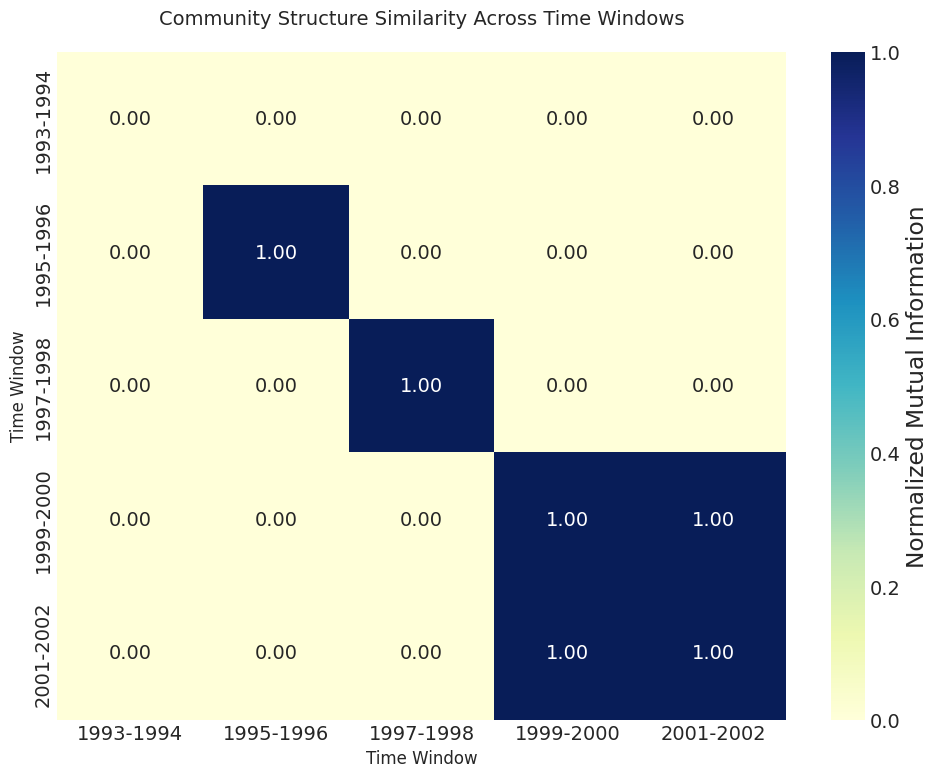


 Visualizing networks by research field...
Processing time window: 1993-1994


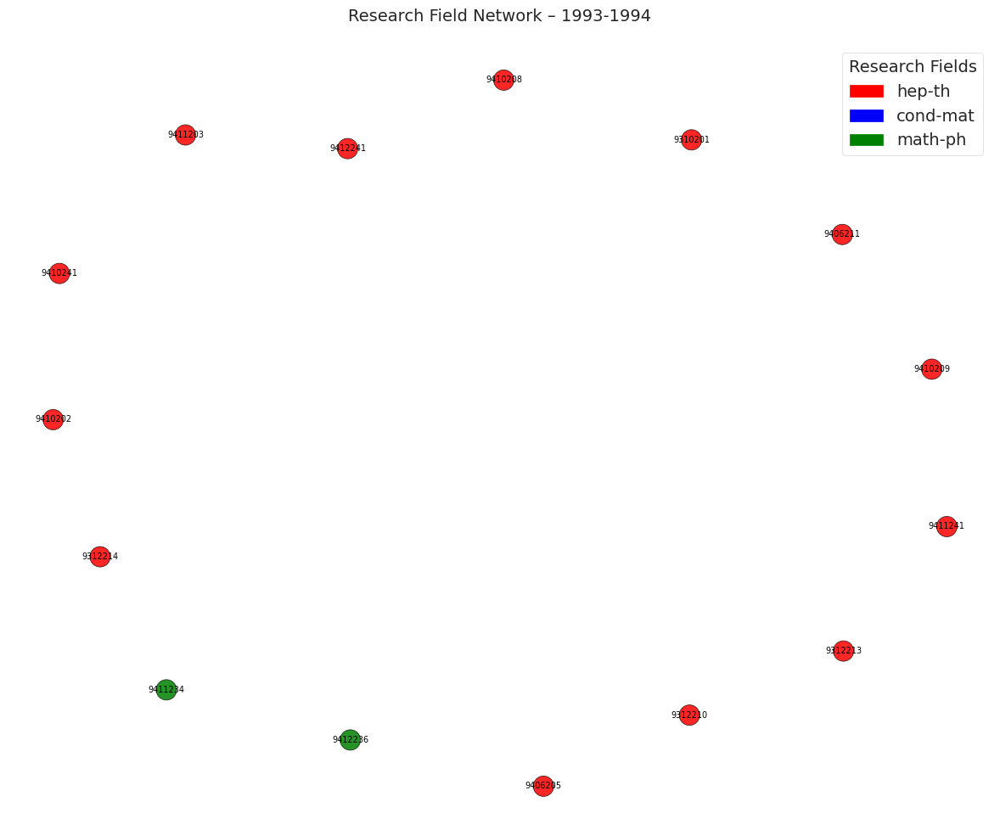

Processing time window: 1995-1996


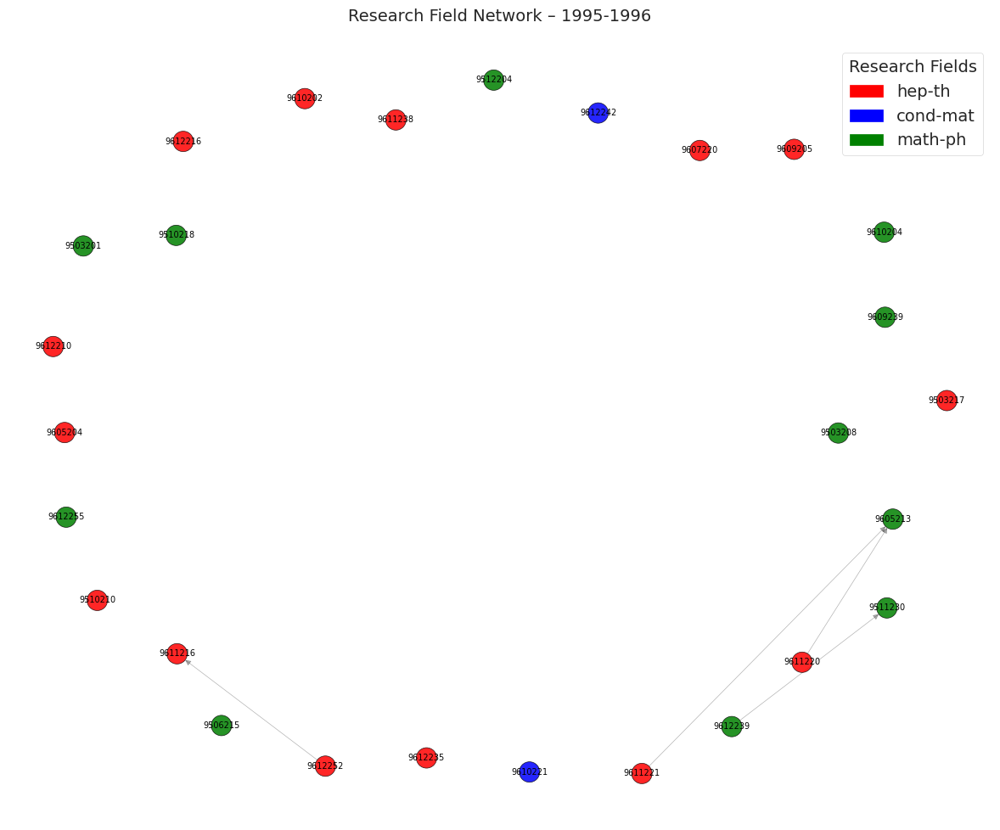

Processing time window: 1997-1998


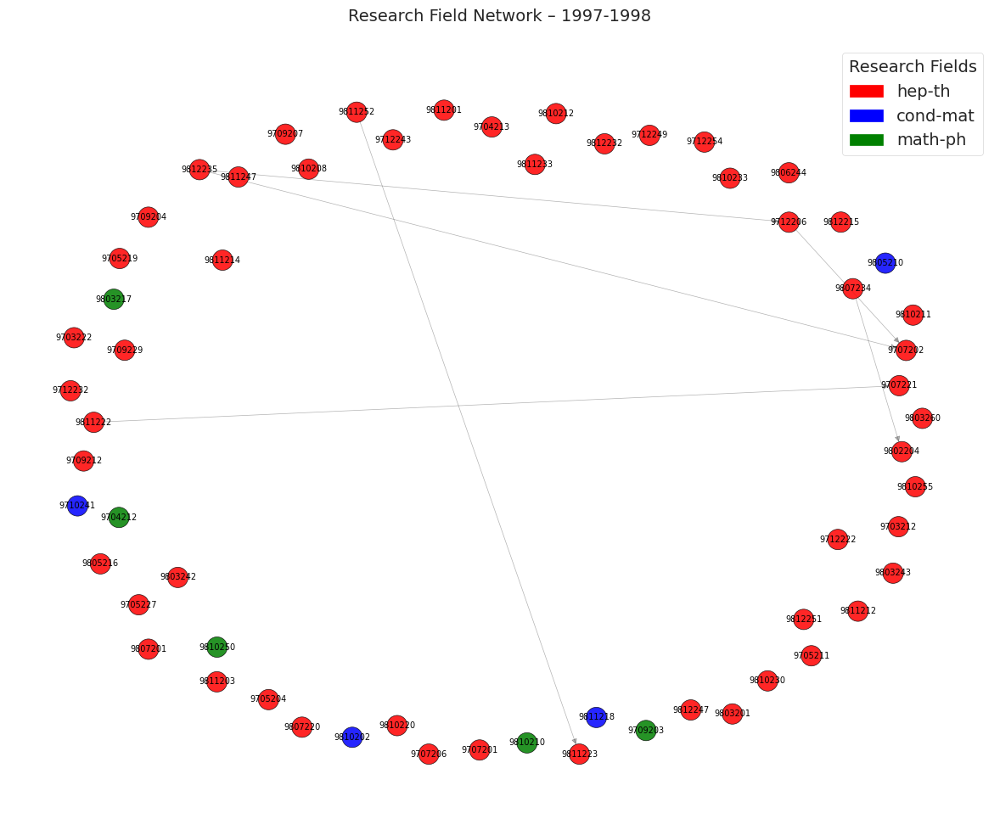

Processing time window: 1999-2000


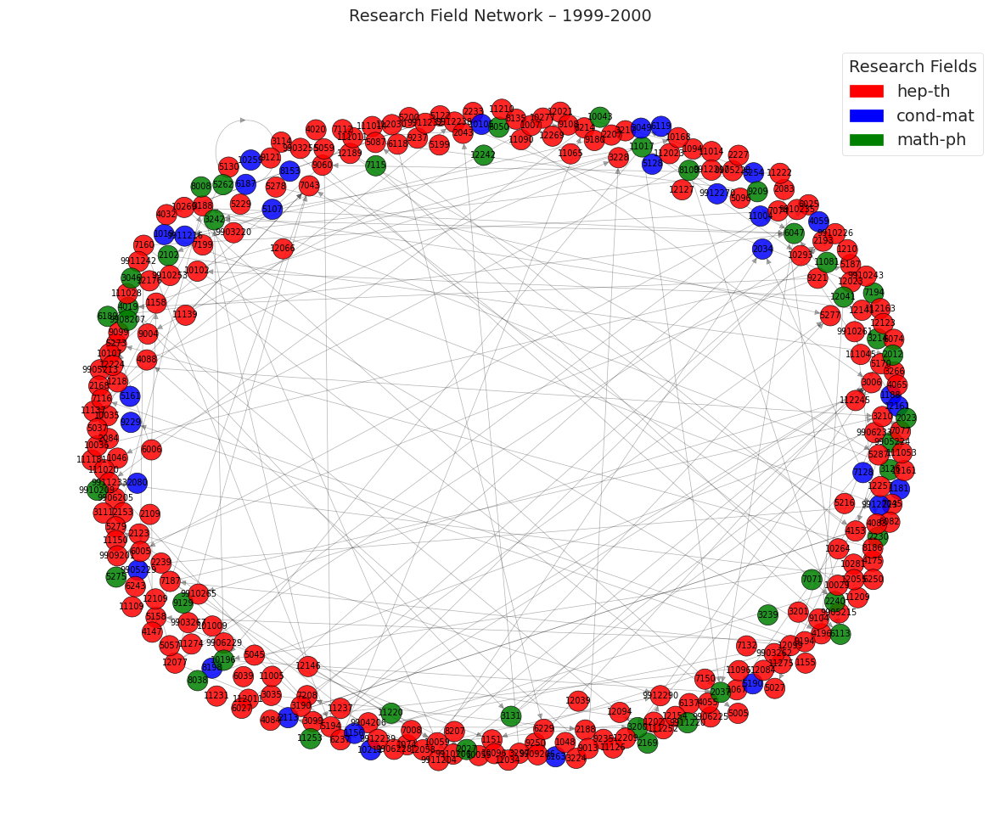

Processing time window: 2001-2002


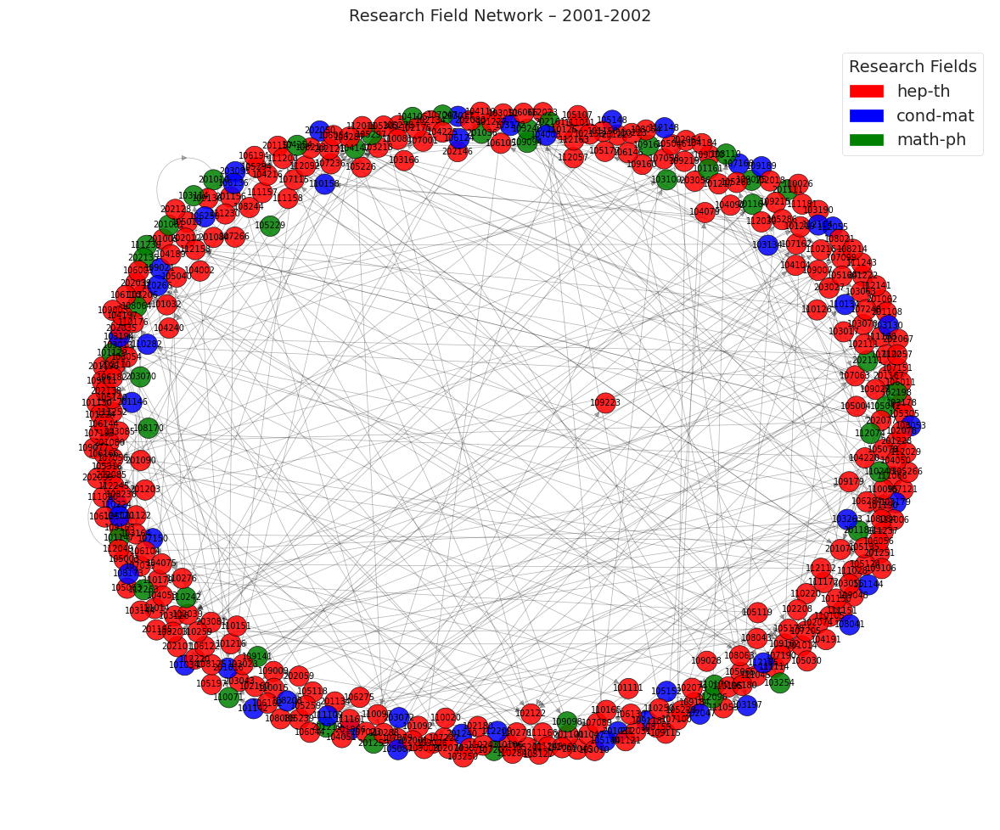


 Analyzing community evolution...


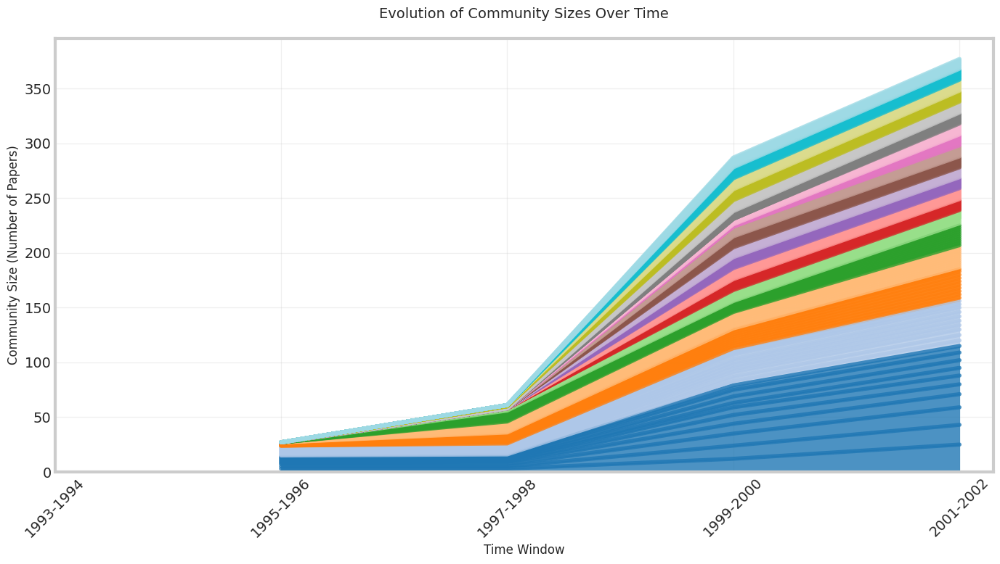


 Analyzing research field dynamics...

Analyzing field dynamics for: 1993-1994


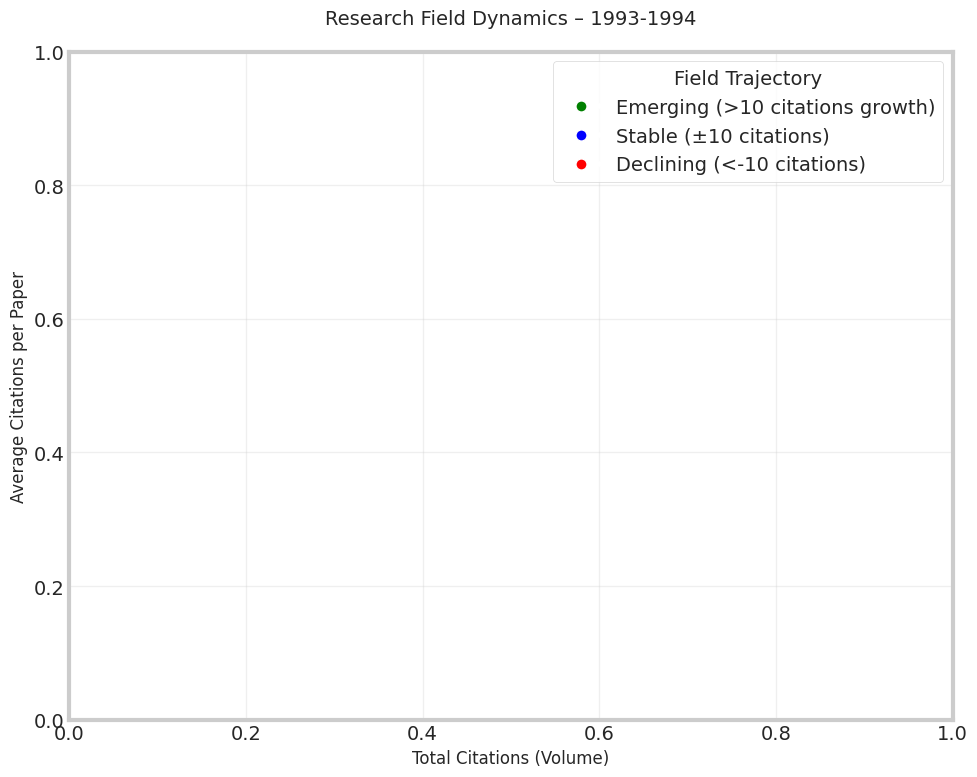


Analyzing field dynamics for: 1995-1996


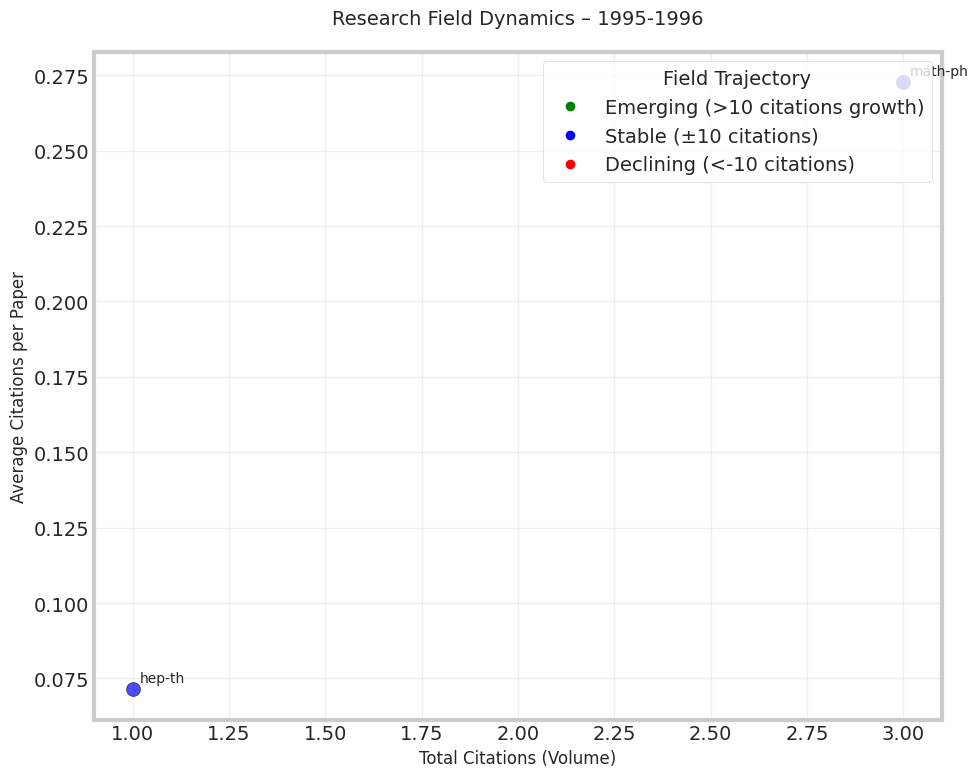


Analyzing field dynamics for: 1997-1998


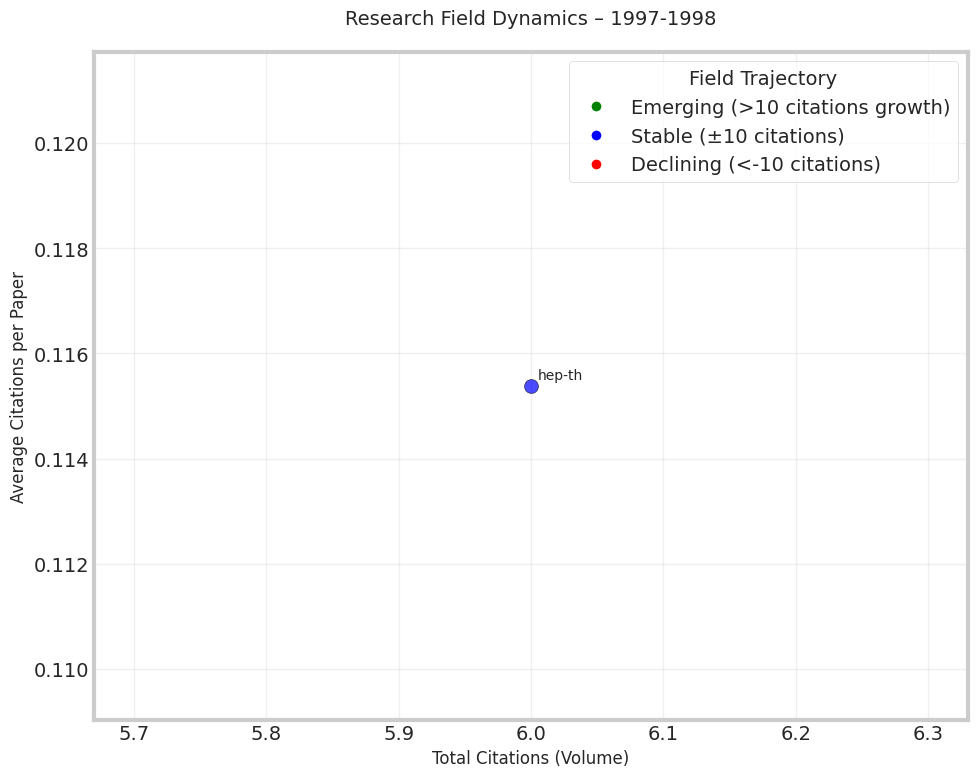


Analyzing field dynamics for: 1999-2000


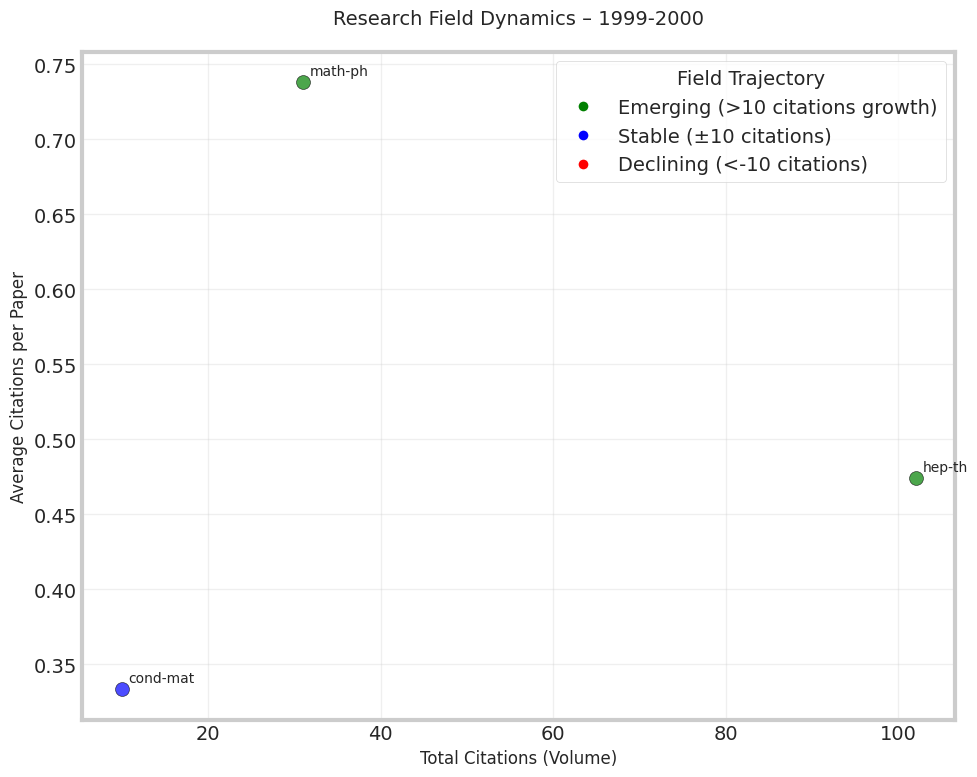


Analyzing field dynamics for: 2001-2002


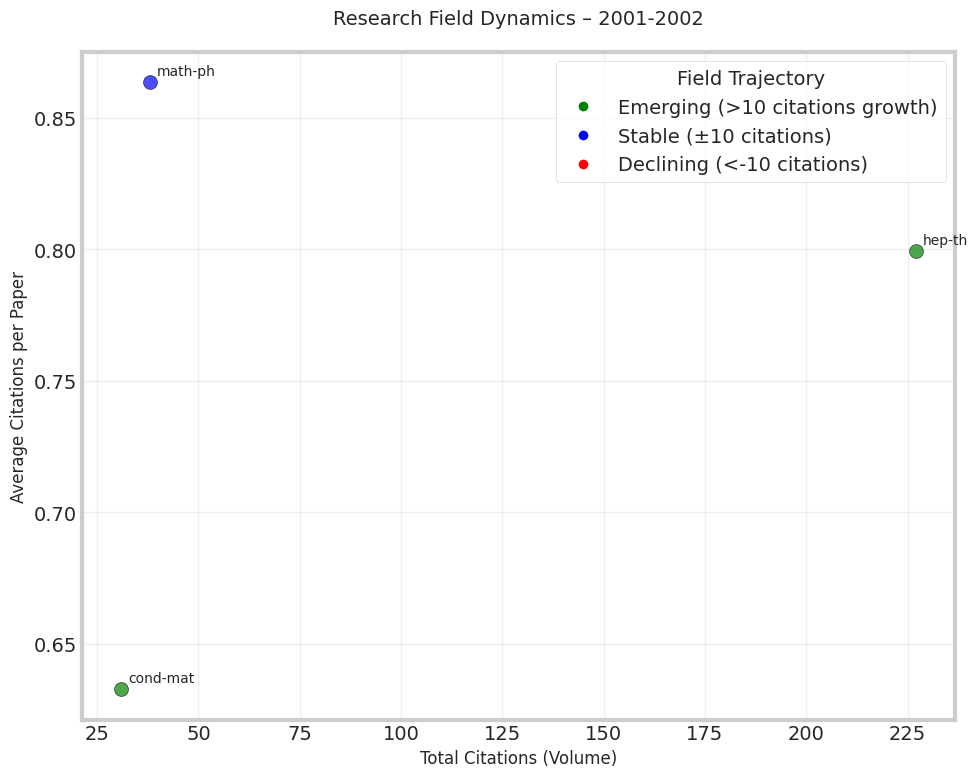


 Analysis complete!


In [ ]:
import dynetx as dn
from cdlib import algorithms, evaluation
import matplotlib.patches as mpatches
from typing import List, Dict, Tuple, Optional, Any


def visualize_communities_with_fallback(graph, communities, title="Community Structure"):
    """
    Visualize network communities with color-coded nodes and fallback handling.

    Args:
        graph: NetworkX graph object
        communities: Community detection result from cdlib
        title: Plot title
    """
    # Handle edge cases gracefully
    if graph.number_of_nodes() == 0 or not communities or not communities.communities:
        print(f"[Warning] No communities or nodes found for: {title}")
        return

    # Define color palette for communities
    color_palette = ['red', 'green', 'blue', 'orange', 'purple', 'brown', 'pink', 'gray', 'olive', 'cyan']
    community_partitions = communities.communities

    # Generate consistent node positions
    node_positions = nx.spring_layout(graph, seed=42, k=1.5)

    plt.figure(figsize=(10, 8))

    # Draw each community with distinct colors
    for community_idx, community_nodes in enumerate(community_partitions):
        if not community_nodes:  # Skip empty communities
            continue

        color = color_palette[community_idx % len(color_palette)]
        nx.draw_networkx_nodes(
            graph, node_positions,
            nodelist=community_nodes,
            node_color=color,
            label=f"Community {community_idx + 1}",
            alpha=0.8,
            node_size=300,
            edgecolors='black'
        )

    # Draw edges and labels
    nx.draw_networkx_edges(graph, node_positions, alpha=0.3, width=0.5)
    nx.draw_networkx_labels(graph, node_positions, font_size=8)

    plt.title(title, fontsize=14, pad=20)
    plt.axis('off')
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.tight_layout()
    plt.show()


def visualize_network_by_research_field(graph, metadata_df, title="Network Colored by Research Field"):
    """
    Visualize network with nodes colored by their research field/category.

    Args:
        graph: NetworkX graph object
        metadata_df: DataFrame with paper metadata including field information
        title: Plot title
    """
    if graph.number_of_nodes() == 0:
        print(f"[Warning] No nodes found for: {title}")
        return

    # Define field-to-color mapping
    field_color_map = {
        "hep-th": "red",       # High Energy Physics - Theory
        "cond-mat": "blue",    # Condensed Matter Physics
        "math-ph": "green",    # Mathematical Physics
        "unknown": "gray"      # Fallback for unclassified papers
    }

    # Create lookup dictionary for efficient field retrieval
    paper_to_field = metadata_df.set_index('paper_id')['field'].to_dict()

    # Assign colors based on research field
    node_colors = []
    for node in graph.nodes():
        field = paper_to_field.get(node, 'unknown')
        node_colors.append(field_color_map.get(field, 'gray'))

    # Create layout with better spacing
    node_positions = nx.spring_layout(graph, seed=42, k=2.0)

    plt.figure(figsize=(12, 10))

    # Draw nodes and edges
    nx.draw_networkx_nodes(
        graph, node_positions,
        node_color=node_colors,
        node_size=300,
        edgecolors='black',
        alpha=0.85
    )
    nx.draw_networkx_edges(graph, node_positions, alpha=0.3, width=0.5)
    nx.draw_networkx_labels(graph, node_positions, font_size=7)

    # Create legend for research fields
    legend_elements = [
        mpatches.Patch(color=color, label=field)
        for field, color in field_color_map.items()
        if field != 'unknown'
    ]
    plt.legend(handles=legend_elements, title="Research Fields", loc="upper right", frameon=True)

    plt.title(title, fontsize=14, pad=20)
    plt.axis('off')
    plt.tight_layout()
    plt.show()


def analyze_temporal_citation_networks(citation_file_path: str, metadata_file_path: str,
                                     time_window_size: int = 2) -> Dict[str, Any]:
    """
    Comprehensive temporal analysis of citation networks with community detection.

    Args:
        citation_file_path: Path to citation data file
        metadata_file_path: Path to paper metadata CSV
        time_window_size: Size of time windows in years

    Returns:
        Dictionary containing analysis results
    """
    print("Loading and preprocessing data...")

    # Load and preprocess metadata
    metadata = pd.read_csv(metadata_file_path)
    metadata['date'] = pd.to_datetime(metadata['date'])
    metadata['year'] = metadata['date'].dt.year

    # Create time windows for temporal analysis
    min_year, max_year = metadata['year'].min(), metadata['year'].max()
    time_windows = [(year, year + time_window_size - 1)
                   for year in range(min_year, max_year + 1, time_window_size)]
    time_labels = [f"{start}-{end}" for start, end in time_windows]

    # Load citation network efficiently
    print("Building citation network...")
    citations = []
    with open(citation_file_path, "r") as file:
        for line in file:
            if line.startswith("#"):  # Skip comment lines
                continue
            try:
                source, target = map(int, line.strip().split())
                citations.append((source, target))
            except ValueError:
                continue  # Skip malformed lines

    # Create master citation graph
    master_graph = nx.DiGraph()
    master_graph.add_edges_from(citations)

    # Initialize storage for results
    temporal_graphs = []
    dynamic_graph = dn.DynGraph()
    community_structures = []
    nmi_temporal_scores = []

    print("Analyzing each time window...")
    for time_idx, (start_year, end_year) in enumerate(time_windows):
        print(f"Processing time window {time_idx + 1}/{len(time_windows)}: {start_year}-{end_year}")

        # Extract papers for current time window
        papers_in_window = metadata[
            (metadata['year'] >= start_year) & (metadata['year'] <= end_year)
        ]['paper_id'].tolist()

        # Create subgraph for current time window
        time_window_graph = master_graph.subgraph(papers_in_window).copy()
        temporal_graphs.append(time_window_graph)

        # Add edges to dynamic graph representation
        for source, target in time_window_graph.edges():
            dynamic_graph.add_interaction(source, target, time_idx)

        # Perform community detection using Leiden algorithm
        if len(time_window_graph) > 0 and time_window_graph.number_of_edges() > 0:
            communities = algorithms.leiden(time_window_graph)
        else:
            communities = None

        community_structures.append(communities)

        # Calculate NMI between consecutive time windows
        nmi_score = calculate_temporal_nmi(community_structures, time_idx, temporal_graphs)
        nmi_temporal_scores.append(nmi_score)

    print("Temporal analysis complete!")
    return {
        "dynamic_graph": dynamic_graph,
        "temporal_graphs": temporal_graphs,
        "community_structures": community_structures,
        "nmi_scores": nmi_temporal_scores,
        "time_labels": time_labels,
        "metadata": metadata
    }


def calculate_temporal_nmi(community_structures: List, current_time_idx: int,
                          temporal_graphs: List) -> Optional[float]:
    """
    Calculate Normalized Mutual Information between consecutive time windows.

    Args:
        community_structures: List of community detection results
        current_time_idx: Current time window index
        temporal_graphs: List of temporal network graphs

    Returns:
        NMI score or None if calculation not possible
    """
    if current_time_idx == 0:  # No previous time window to compare
        return None

    previous_communities = community_structures[current_time_idx - 1]
    current_communities = community_structures[current_time_idx]

    if not previous_communities or not current_communities:
        return None

    # Find nodes present in both time windows
    prev_nodes = set().union(*previous_communities.communities)
    curr_nodes = set().union(*current_communities.communities)
    common_nodes = prev_nodes & curr_nodes

    if not common_nodes:
        return None

    # Filter communities to include only common nodes
    prev_filtered = [
        list(set(community).intersection(common_nodes))
        for community in previous_communities.communities
        if set(community).intersection(common_nodes)
    ]
    curr_filtered = [
        list(set(community).intersection(common_nodes))
        for community in current_communities.communities
        if set(community).intersection(common_nodes)
    ]

    # Create NodeClustering objects for NMI calculation
    prev_clustering = NodeClustering(
        prev_filtered,
        graph=temporal_graphs[current_time_idx],
        method_name=previous_communities.method_name
    )
    curr_clustering = NodeClustering(
        curr_filtered,
        graph=temporal_graphs[current_time_idx],
        method_name=current_communities.method_name
    )

    # Calculate and return NMI score
    if prev_clustering.communities and curr_clustering.communities:
        nmi_result = evaluation.normalized_mutual_information(prev_clustering, curr_clustering)
        return nmi_result.score

    return None


def visualize_community_size_evolution(community_structures: List, time_labels: List):
    """
    Create area plot showing how community sizes evolve over time.

    Args:
        community_structures: List of community detection results
        time_labels: Labels for time windows
    """
    # Extract community size data
    community_data = []
    for time_idx, communities in enumerate(community_structures):
        if communities:
            for comm_idx, community in enumerate(communities.communities):
                community_data.append({
                    'time': time_idx,
                    'community': f"C{comm_idx}",
                    'size': len(community)
                })

    # Create DataFrame and pivot for visualization
    df = pd.DataFrame(community_data)
    if df.empty:
        print("No community data available for visualization")
        return

    df_pivot = df.pivot(index="time", columns="community", values="size").fillna(0)

    # Sort communities by maximum size for better visualization
    df_pivot = df_pivot.reindex(columns=df_pivot.max().sort_values(ascending=False).index)

    plt.figure(figsize=(14, 8))
    df_pivot.plot.area(colormap='tab20', alpha=0.8, ax=plt.gca())

    plt.xticks(ticks=range(len(time_labels)), labels=time_labels, rotation=45)
    plt.xlabel("Time Window", fontsize=12)
    plt.ylabel("Community Size (Number of Papers)", fontsize=12)
    plt.title("Evolution of Community Sizes Over Time", fontsize=14, pad=20)
    plt.legend().remove()  # Remove legend to reduce clutter
    plt.grid(True, alpha=0.3)
    plt.tight_layout()
    plt.show()


def analyze_community_interaction_roles(citation_flow_matrix: pd.DataFrame) -> Dict[str, Dict[str, float]]:
    """
    Classify communities based on their citation flow patterns.

    Args:
        citation_flow_matrix: Matrix showing citation flows between communities

    Returns:
        Dictionary mapping community IDs to their role characteristics
    """
    community_roles = {}

    for community_id in citation_flow_matrix.index:
        # Calculate outgoing citation flow (influence on others)
        total_outgoing = citation_flow_matrix.loc[community_id].sum()

        # Calculate incoming citation flow (influenced by others)
        total_incoming = citation_flow_matrix[community_id].sum()

        # Calculate self-citation within community
        self_citations = citation_flow_matrix.loc[community_id, community_id] if community_id in citation_flow_matrix.columns else 0

        # Calculate role metrics
        export_ratio = (total_outgoing - self_citations) / total_outgoing if total_outgoing > 0 else 0
        import_ratio = (total_incoming - self_citations) / total_incoming if total_incoming > 0 else 0
        self_cite_ratio = self_citations / (total_incoming + total_outgoing) if (total_incoming + total_outgoing) > 0 else 0

        community_roles[community_id] = {
            "export_ratio": export_ratio,
            "import_ratio": import_ratio,
            "self_cite_ratio": self_cite_ratio
        }

    return community_roles


def summarize_community_roles(community_roles: Dict[str, Dict[str, float]], top_k: int = 5):
    """
    Print summary of top communities in each role category.

    Args:
        community_roles: Dictionary of community role characteristics
        top_k: Number of top communities to display in each category
    """
    # Sort communities by different role metrics
    exporters = sorted(community_roles.items(), key=lambda x: x[1]['export_ratio'], reverse=True)
    importers = sorted(community_roles.items(), key=lambda x: x[1]['import_ratio'], reverse=True)
    self_citers = sorted(community_roles.items(), key=lambda x: x[1]['self_cite_ratio'], reverse=True)

    print(f"\n Top {top_k} Exporter Communities (High Outgoing Influence):")
    for comm_id, metrics in exporters[:top_k]:
        print(f"  {comm_id}: Export={metrics['export_ratio']:.3f}, Import={metrics['import_ratio']:.3f}, Self-cite={metrics['self_cite_ratio']:.3f}")

    print(f"\n Top {top_k} Importer Communities (High Incoming Influence):")
    for comm_id, metrics in importers[:top_k]:
        print(f"  {comm_id}: Import={metrics['import_ratio']:.3f}, Export={metrics['export_ratio']:.3f}, Self-cite={metrics['self_cite_ratio']:.3f}")

    print(f"\n Top {top_k} Self-Referential Communities (High Internal Citations):")
    for comm_id, metrics in self_citers[:top_k]:
        print(f"  {comm_id}: Self-cite={metrics['self_cite_ratio']:.3f}, Export={metrics['export_ratio']:.3f}, Import={metrics['import_ratio']:.3f}")


def visualize_community_role_landscape(community_roles: Dict[str, Dict[str, float]],
                                     title: str = "Community Role Landscape: Export vs Import"):
    """
    Create scatter plot showing community roles in export-import space.

    Args:
        community_roles: Dictionary of community role characteristics
        title: Plot title
    """
    export_ratios = [metrics['export_ratio'] for metrics in community_roles.values()]
    import_ratios = [metrics['import_ratio'] for metrics in community_roles.values()]
    community_labels = list(community_roles.keys())

    plt.figure(figsize=(10, 8))

    # Create scatter plot with community labels
    plt.scatter(export_ratios, import_ratios, c='skyblue', s=100, edgecolors='black', alpha=0.7)

    # Add community labels to points
    for i, label in enumerate(community_labels):
        plt.annotate(label, (export_ratios[i], import_ratios[i]),
                    xytext=(5, 5), textcoords='offset points', fontsize=9)

    # Add reference lines for balanced communities
    plt.axhline(0.5, color='gray', linestyle='--', linewidth=1, alpha=0.7)
    plt.axvline(0.5, color='gray', linestyle='--', linewidth=1, alpha=0.7)

    plt.xlabel("Export Ratio (Outgoing Influence)", fontsize=12)
    plt.ylabel("Import Ratio (Incoming Influence)", fontsize=12)
    plt.title(title, fontsize=14, pad=20)
    plt.grid(True, alpha=0.3)
    plt.xlim(-0.05, 1.05)
    plt.ylim(-0.05, 1.05)
    plt.tight_layout()
    plt.show()


def track_community_evolution(community_structures: List) -> Dict[int, Dict[int, set]]:
    """
    Track how communities evolve across time windows.

    Args:
        community_structures: List of community detection results

    Returns:
        Dictionary mapping community indices to their node sets over time
    """
    evolution_tracker = {}

    for time_idx, communities in enumerate(community_structures):
        if communities:
            for comm_idx, community_nodes in enumerate(communities.communities):
                if comm_idx not in evolution_tracker:
                    evolution_tracker[comm_idx] = {}
                evolution_tracker[comm_idx][time_idx] = set(community_nodes)

    return evolution_tracker


def analyze_research_field_dynamics(temporal_graph: nx.Graph, metadata_df: pd.DataFrame) -> Tuple[Dict, Dict, Dict]:
    """
    Analyze citation dynamics by research field within a time window.

    Args:
        temporal_graph: Network graph for specific time window
        metadata_df: DataFrame with paper metadata

    Returns:
        Tuple of (total_citations, paper_counts, avg_citations_per_paper) by field
    """
    # Create field lookup dictionary
    paper_to_field = metadata_df.set_index('paper_id')['field'].to_dict()

    # Initialize counters
    field_citations = {}
    field_paper_counts = {}

    # Count papers by field
    for paper_id in temporal_graph.nodes():
        field = paper_to_field.get(paper_id, 'unknown')
        field_paper_counts[field] = field_paper_counts.get(field, 0) + 1

    # Count citations by field (incoming citations)
    for _, target_paper in temporal_graph.edges():
        field = paper_to_field.get(target_paper, 'unknown')
        field_citations[field] = field_citations.get(field, 0) + 1

    # Calculate average citations per paper by field
    field_avg_citations = {
        field: field_citations.get(field, 0) / field_paper_counts[field]
        for field in field_paper_counts
        if field_paper_counts[field] > 0
    }

    return field_citations, field_paper_counts, field_avg_citations


def visualize_field_trajectory_analysis(current_citations: Dict, current_avg: Dict,
                                      previous_citations: Dict, time_label: str):
    """
    Visualize research field trajectories based on citation dynamics.

    Args:
        current_citations: Current time window citation counts by field
        current_avg: Current average citations per paper by field
        previous_citations: Previous time window citation counts by field
        time_label: Label for current time window
    """
    plt.figure(figsize=(10, 8))

    for field in current_citations:
        current_volume = current_citations[field]
        current_average = current_avg[field]
        previous_volume = previous_citations.get(field, 0)

        # Classify field trajectory based on citation volume change
        volume_change = current_volume - previous_volume
        if volume_change > 10:
            color, label = 'green', 'Emerging'
        elif volume_change < -10:
            color, label = 'red', 'Declining'
        else:
            color, label = 'blue', 'Stable'

        # Plot field position and label
        plt.scatter(current_volume, current_average, color=color, s=100, alpha=0.7, edgecolors='black')
        plt.annotate(field, (current_volume, current_average),
                    xytext=(5, 5), textcoords='offset points', fontsize=10)

    # Create legend
    legend_elements = [
        plt.Line2D([0], [0], marker='o', color='w', label='Emerging (>10 citations growth)',
                   markerfacecolor='green', markersize=8),
        plt.Line2D([0], [0], marker='o', color='w', label='Stable (±10 citations)',
                   markerfacecolor='blue', markersize=8),
        plt.Line2D([0], [0], marker='o', color='w', label='Declining (<-10 citations)',
                   markerfacecolor='red', markersize=8),
    ]
    plt.legend(handles=legend_elements, title="Field Trajectory", loc="upper right")

    plt.xlabel("Total Citations (Volume)", fontsize=12)
    plt.ylabel("Average Citations per Paper", fontsize=12)
    plt.title(f"Research Field Dynamics – {time_label}", fontsize=14, pad=20)
    plt.grid(True, alpha=0.3)
    plt.tight_layout()
    plt.show()


# MAIN EXECUTION SECTION
if __name__ == "__main__":
    # Execute temporal network analysis
    print(" Starting Temporal Citation Network Analysis...")

    analysis_results = analyze_temporal_citation_networks(
        citation_file_path="/content/Cit-HepTh.txt",
        metadata_file_path="/content/metadata_with_dates.csv",
        time_window_size=2
    )

    # Visualize NMI heatmap across all time windows
    print("\n Generating NMI Heatmap...")
    plot_nmi_heatmap(analysis_results["community_structures"], analysis_results["time_labels"])

    # Visualize networks colored by research field for each time window
    print("\n Visualizing networks by research field...")
    for time_idx, temporal_graph in enumerate(analysis_results["temporal_graphs"]):
        time_label = analysis_results["time_labels"][time_idx]
        print(f"Processing time window: {time_label}")
        visualize_network_by_research_field(
            temporal_graph,
            analysis_results["metadata"],
            title=f"Research Field Network – {time_label}"
        )

    # Analyze community size evolution
    print("\n Analyzing community evolution...")
    visualize_community_size_evolution(
        analysis_results["community_structures"],
        analysis_results["time_labels"]
    )

    # Analyze field dynamics across time windows
    print("\n Analyzing research field dynamics...")
    previous_field_citations = {}

    for time_idx, temporal_graph in enumerate(analysis_results["temporal_graphs"]):
        time_label = analysis_results["time_labels"][time_idx]
        print(f"\nAnalyzing field dynamics for: {time_label}")

        # Calculate field metrics for current time window
        current_citations, paper_counts, avg_citations = analyze_research_field_dynamics(
            temporal_graph, analysis_results["metadata"]
        )

        # Visualize field trajectory
        visualize_field_trajectory_analysis(
            current_citations, avg_citations, previous_field_citations, time_label
        )

        # Update for next iteration
        previous_field_citations = current_citations

    print("\n Analysis complete!")

## **GraphScope**

In [ ]:
import pandas as pd
import networkx as nx
from networkx.algorithms.community import greedy_modularity_communities
from collections import defaultdict

# Load citation network data from file
citations = []
with open("/content/Cit-HepTh.txt", "r") as f:
    for line in f:
        if line.startswith("#"):
            continue
        parts = line.strip().split()
        if len(parts) == 2:
            citing, cited = map(int, parts)
            citations.append((citing, cited))

# Read paper metadata containing publication years
metadata = pd.read_csv("/content/metadata_with_dates.csv")
paper_year = dict(zip(metadata.paper_id, metadata.year))

# Create temporal edge list with citation years
temporal_edges = []
for citing, cited in citations:
    year = paper_year.get(citing)
    if year:
        temporal_edges.append((citing, cited, year))

def detect_communities(G):
    """Apply greedy modularity optimization for community detection."""
    undirected = G.to_undirected()
    return list(greedy_modularity_communities(undirected))

def compute_modularity(G, communities):
    """Calculate modularity score for given community partition."""
    undirected = G.to_undirected()
    return nx.algorithms.community.quality.modularity(undirected, communities)

def run_graphscope(edges, start_year, end_year, threshold=0.05):
    """Execute GraphScope temporal analysis with change point detection."""
    yearly_results = {}
    prev_mod = None

    for year in range(start_year, end_year + 1):
        G = nx.DiGraph()

        # Build yearly citation subgraph
        for citing, cited, edge_year in edges:
            if edge_year == year:
                G.add_edge(citing, cited)

        if len(G) == 0:
            continue

        communities = detect_communities(G)
        modularity = compute_modularity(G, communities)

        # Detect structural change points using modularity threshold
        change_point = False
        if prev_mod is not None and abs(modularity - prev_mod) > threshold:
            change_point = True

        yearly_results[year] = {
            "graph": G,
            "communities": communities,
            "modularity": modularity,
            "change_point": change_point
        }

        prev_mod = modularity

    return yearly_results

# Execute temporal community analysis
start_year = metadata.year.min()
end_year = metadata.year.max()
results = run_graphscope(temporal_edges, start_year, end_year)

# Display yearly community structure evolution
for year in sorted(results.keys()):
    print(f"\nYear: {year}")
    print(f"  # Communities: {len(results[year]['communities'])}")
    print(f"  Modularity: {results[year]['modularity']:.3f}")
    if results[year]['change_point']:
        print("  >> Change Point Detected <<")


Year: 1993
  # Communities: 4
  Modularity: 0.482

Year: 1994
  # Communities: 10
  Modularity: 0.813
  >> Change Point Detected <<

Year: 1995
  # Communities: 7
  Modularity: 0.748
  >> Change Point Detected <<

Year: 1996
  # Communities: 14
  Modularity: 0.803
  >> Change Point Detected <<

Year: 1997
  # Communities: 17
  Modularity: 0.839

Year: 1998
  # Communities: 29
  Modularity: 0.903
  >> Change Point Detected <<

Year: 1999
  # Communities: 29
  Modularity: 0.910

Year: 2000
  # Communities: 72
  Modularity: 0.838
  >> Change Point Detected <<

Year: 2001
  # Communities: 68
  Modularity: 0.833

Year: 2002
  # Communities: 40
  Modularity: 0.886
  >> Change Point Detected <<


In [ ]:
import numpy as np
from sklearn.metrics import pairwise_distances
import matplotlib.pyplot as plt

# Track community membership across temporal snapshots
community_tracking = defaultdict(list)

for year, data in results.items():
    for i, community in enumerate(data['communities']):
        for node in community:
            community_tracking[node].append((year, i))

# Calculate community size distributions by year
community_sizes = defaultdict(lambda: defaultdict(int))

for year, data in results.items():
    for i, community in enumerate(data['communities']):
        community_sizes[year][i] = len(community)

# Detect community growth patterns using overlap-based matching
community_trajectory = {}

years_sorted = sorted(results.keys())
for year_idx in range(1, len(years_sorted)):
    y_prev = years_sorted[year_idx - 1]
    y_curr = years_sorted[year_idx]

    prev = community_sizes[y_prev]
    curr = community_sizes[y_curr]

    for cid in curr:
        size_now = curr[cid]

        # Match communities based on node overlap between consecutive years
        best_match = None
        max_overlap = 0
        for pid in prev:
            common = len(set(results[y_prev]['communities'][pid]) & set(results[y_curr]['communities'][cid]))
            if common > max_overlap:
                max_overlap = common
                best_match = pid

        if best_match is not None:
            size_before = prev[best_match]
            delta = size_now - size_before
            status = "growing" if delta > 0 else "declining" if delta < 0 else "stable"
            community_trajectory[(y_curr, cid)] = status

# Compute inter-community citation influence scores
community_influence = defaultdict(lambda: {"in": 0, "out": 0})

for citing, cited, year in temporal_edges:
    for comm_id, comm in enumerate(results.get(year, {}).get("communities", [])):
        if citing in comm:
            from_cid = comm_id
        if cited in comm:
            to_cid = comm_id

    # Count cross-community citations for influence measurement
    if 'from_cid' in locals() and 'to_cid' in locals():
        if from_cid != to_cid:
            community_influence[(year, from_cid)]["out"] += 1
            community_influence[(year, to_cid)]["in"] += 1
        del from_cid, to_cid

# Classify communities by citation flow patterns
influence_type = {}
for key, val in community_influence.items():
    if val["out"] > val["in"] * 1.2:
        influence_type[key] = "exporter"
    elif val["in"] > val["out"] * 1.2:
        influence_type[key] = "importer"
    else:
        influence_type[key] = "balanced"

# Generate comprehensive community evolution report
summary = []

for year, data in results.items():
    for i, community in enumerate(data['communities']):
        size = len(community)
        modularity = data["modularity"]
        growth = community_trajectory.get((year, i), "unknown")
        influence = influence_type.get((year, i), "undetermined")
        summary.append({
            "year": year,
            "community_id": i,
            "size": size,
            "modularity": modularity,
            "growth": growth,
            "influence": influence
        })

df_summary = pd.DataFrame(summary)
display(df_summary)

,year,community_id,size,modularity,growth,influence
0,1993,0,10,0.482222,unknown,exporter
1,1993,1,3,0.482222,unknown,undetermined
2,1993,2,3,0.482222,unknown,importer
3,1993,3,2,0.482222,unknown,undetermined
4,1994,0,19,0.812673,unknown,exporter
...,...,...,...,...,...,...
285,2002,35,3,0.886029,growing,undetermined
286,2002,36,2,0.886029,stable,undetermined
287,2002,37,2,0.886029,unknown,undetermined
288,2002,38,2,0.886029,unknown,undetermined


,year,community_id,size,modularity,growth,influence,dominant_field
0,1993,0,10,0.482222,insufficient_data,exporter,hep-th
1,1993,1,3,0.482222,insufficient_data,stagnant,hep-th
2,1993,2,3,0.482222,insufficient_data,importer,hep-th
3,1993,3,2,0.482222,insufficient_data,stagnant,hep-th
4,1994,0,19,0.812673,insufficient_data,exporter,math-ph
...,...,...,...,...,...,...,...
285,2002,35,3,0.886029,growing,stagnant,cond-mat
286,2002,36,2,0.886029,stable,stagnant,hep-th
287,2002,37,2,0.886029,insufficient_data,stagnant,hep-th
288,2002,38,2,0.886029,insufficient_data,stagnant,hep-th


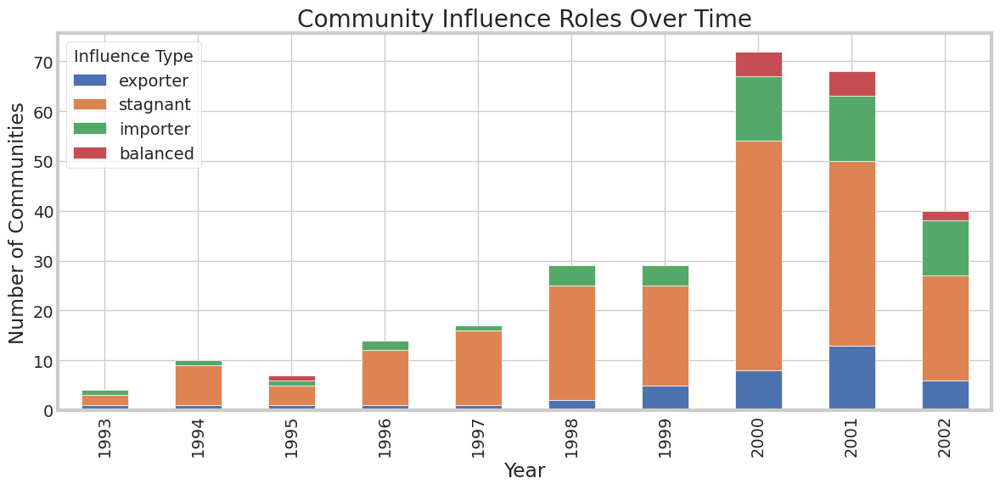

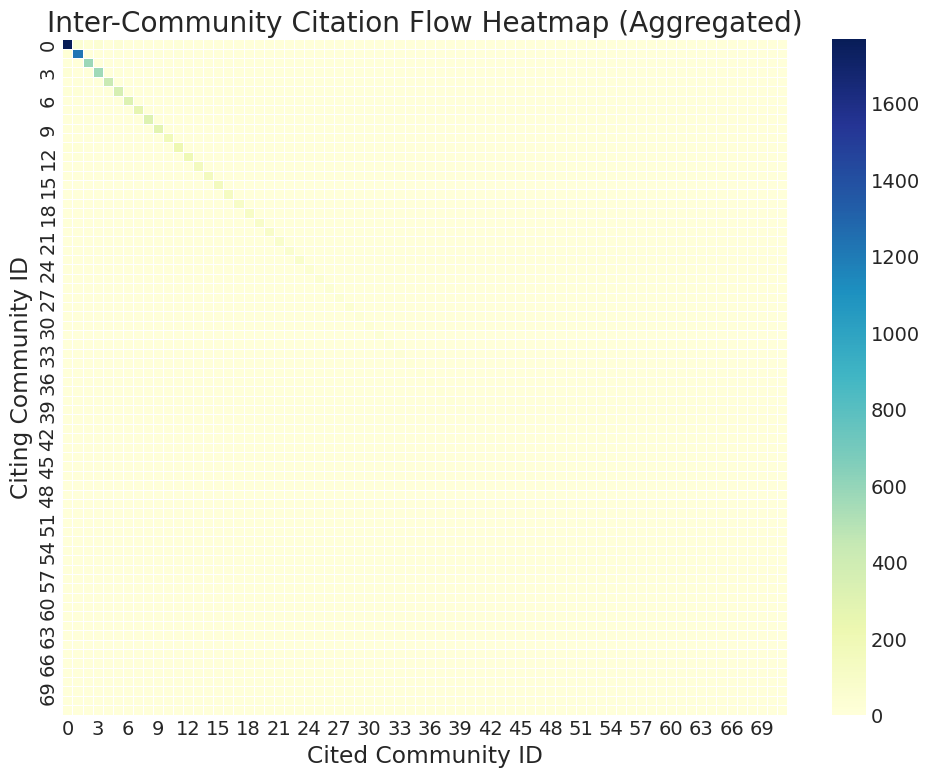

In [ ]:
from collections import Counter
import seaborn as sns

# Load citation network and publication metadata
citations = []
with open("/content/Cit-HepTh.txt", "r") as f:
    for line in f:
        if line.startswith("#"):
            continue
        parts = line.strip().split()
        if len(parts) == 2:
            citing, cited = map(int, parts)
            citations.append((citing, cited))

metadata = pd.read_csv("/content/metadata_with_dates.csv")
paper_year = dict(zip(metadata.paper_id, metadata.year))

# Create temporal edge list with publication years
temporal_edges = []
for citing, cited in citations:
    year = paper_year.get(citing)
    if year:
        temporal_edges.append((citing, cited, year))

def detect_communities(G):
    """Apply greedy modularity optimization for community detection."""
    return list(greedy_modularity_communities(G.to_undirected()))

def compute_modularity(G, communities):
    """Calculate network modularity score for given partition."""
    return nx.algorithms.community.quality.modularity(G.to_undirected(), communities)

def run_graphscope(edges, start_year, end_year, threshold=0.05):
    """Execute temporal network analysis with change point detection."""
    results = {}
    prev_mod = None
    for year in range(start_year, end_year + 1):
        G = nx.DiGraph()
        for citing, cited, edge_year in edges:
            if edge_year == year:
                G.add_edge(citing, cited)
        if len(G) == 0:
            continue
        communities = detect_communities(G)
        modularity = compute_modularity(G, communities)
        change = prev_mod is not None and abs(modularity - prev_mod) > threshold
        results[year] = {"graph": G, "communities": communities, "modularity": modularity, "change_point": change}
        prev_mod = modularity
    return results

start_year, end_year = metadata.year.min(), metadata.year.max()
results = run_graphscope(temporal_edges, start_year, end_year)

# Track community size evolution across years
community_sizes = defaultdict(lambda: defaultdict(int))
community_trajectory = {}

years_sorted = sorted(results.keys())
for year in years_sorted:
    for i, comm in enumerate(results[year]['communities']):
        community_sizes[year][i] = len(comm)

# Detect growth patterns using node overlap matching
for idx in range(1, len(years_sorted)):
    y_prev, y_curr = years_sorted[idx - 1], years_sorted[idx]
    for cid in community_sizes[y_curr]:
        max_overlap, match = 0, None
        for pid in community_sizes[y_prev]:
            common = len(set(results[y_prev]['communities'][pid]) & set(results[y_curr]['communities'][cid]))
            if common > max_overlap:
                max_overlap, match = common, pid
        if match is not None:
            delta = community_sizes[y_curr][cid] - community_sizes[y_prev][match]
            status = "growing" if delta > 0 else "declining" if delta < 0 else "stable"
            community_trajectory[(y_curr, cid)] = status

# Calculate inter-community citation patterns and self-citation rates
community_influence = defaultdict(lambda: {"in": 0, "out": 0})
self_citations = defaultdict(int)
total_citations = defaultdict(int)

for citing, cited, year in temporal_edges:
    comms = results.get(year, {}).get("communities", [])
    from_cid = to_cid = None
    for cid, members in enumerate(comms):
        if citing in members:
            from_cid = cid
        if cited in members:
            to_cid = cid
    if from_cid is not None:
        total_citations[(year, from_cid)] += 1
        if from_cid == to_cid:
            self_citations[(year, from_cid)] += 1
        elif to_cid is not None:
            community_influence[(year, from_cid)]["out"] += 1
            community_influence[(year, to_cid)]["in"] += 1

# Classify communities by citation flow behavior
influence_type = {}
for year, data in results.items():
    for cid in range(len(data["communities"])):
        key = (year, cid)
        in_out = community_influence.get(key, {"in": 0, "out": 0})
        self_ratio = self_citations.get(key, 0) / max(total_citations.get(key, 1), 1)
        if in_out["in"] == 0 and in_out["out"] == 0:
            influence_type[key] = "stagnant" if self_ratio > 0.8 else "data_insufficient"
        elif in_out["out"] > in_out["in"] * 1.2:
            influence_type[key] = "exporter"
        elif in_out["in"] > in_out["out"] * 1.2:
            influence_type[key] = "importer"
        else:
            influence_type[key] = "balanced"

# Generate comprehensive community summary table
summary = []
for year, data in results.items():
    for i, community in enumerate(data['communities']):
        summary.append({
            "year": year,
            "community_id": i,
            "size": len(community),
            "modularity": data["modularity"],
            "growth": community_trajectory.get((year, i), "unknown"),
            "influence": influence_type.get((year, i), "unknown")
        })

df_summary = pd.DataFrame(summary)
from IPython.display import display

# Standardize missing data labels for clarity
df_summary["growth"] = df_summary["growth"].replace("unknown", "insufficient_data")
df_summary["influence"] = df_summary["influence"].replace("unknown", "data_insufficient")

# Assign dominant research field labels to communities
paper_field_map = dict(zip(metadata.paper_id, metadata.field))

community_field_labels = {}
for year, data in results.items():
    for cid, community in enumerate(data['communities']):
        fields = [paper_field_map.get(p) for p in community if p in paper_field_map]
        if fields:
            dominant = Counter(fields).most_common(1)[0][0]
        else:
            dominant = "unknown"
        community_field_labels[(year, cid)] = dominant

# Incorporate field labels into summary dataframe
df_summary["dominant_field"] = df_summary.apply(
    lambda row: community_field_labels.get((row["year"], row["community_id"]), "unknown"), axis=1
)

display(df_summary)

# Generate stacked bar chart showing influence role distribution over time
influence_counts = defaultdict(lambda: defaultdict(int))
for (year, cid), label in influence_type.items():
    influence_counts[year][label] += 1

df_influence_plot = pd.DataFrame(influence_counts).T.fillna(0).astype(int).sort_index()
plt.figure(figsize=(12, 6))
df_influence_plot.plot(kind='bar', stacked=True, ax=plt.gca())
plt.title("Community Influence Roles Over Time")
plt.xlabel("Year")
plt.ylabel("Number of Communities")
plt.legend(title="Influence Type")
plt.grid(True)
plt.tight_layout()
plt.show()

# Create heatmap visualization of inter-community citation flows
matrix = defaultdict(lambda: defaultdict(int))
max_cid = 0

for citing, cited, year in temporal_edges:
    comms = results.get(year, {}).get("communities", [])
    from_cid = to_cid = None
    for cid, comm in enumerate(comms):
        if citing in comm:
            from_cid = cid
        if cited in comm:
            to_cid = cid
    if from_cid is not None and to_cid is not None:
        matrix[from_cid][to_cid] += 1
        max_cid = max(max_cid, from_cid, to_cid)

cid_list = list(range(max_cid + 1))
heatmap_data = pd.DataFrame([[matrix[i][j] for j in cid_list] for i in cid_list], index=cid_list, columns=cid_list)

plt.figure(figsize=(10, 8))
sns.heatmap(heatmap_data, cmap="YlGnBu", linewidths=0.5)
plt.title("Inter-Community Citation Flow Heatmap (Aggregated)")
plt.xlabel("Cited Community ID")
plt.ylabel("Citing Community ID")
plt.tight_layout()
plt.show()

In [ ]:
import os
from pathlib import Path

# Locate abstracts directory across common locations
possible_paths = [
    Path("./cit-HepTh-abstracts"),
    Path("/content/cit-HepTh-abstracts"),
    Path("cit-HepTh-abstracts")
]

abstract_base_path = next((p for p in possible_paths if p.exists()), None)
if abstract_base_path is None:
    raise FileNotFoundError("cit-HepTh-abstracts folder not found.")

def improved_map_to_field(text):
    """Classify research papers by content analysis of abstracts."""
    text = text.lower()
    if "phenomenology" in text or "phenomenological" in text:
        return "hep-ph"
    elif "experiment" in text or "detector" in text:
        return "hep-ex"
    elif "lattice" in text:
        return "hep-lat"
    elif "quantum algebra" in text or "mathematical physics" in text or "conformal" in text:
        return "hep-th"
    elif any(term in text for term in ["chaotic", "superconductivity", "quantum hall", "mesoscopic", "statistical mechanics", "critical phenomena"]):
        return "cond-mat"
    elif any(term in text for term in ["algebraic geometry", "differential geometry", "symplectic", "functional analysis", "topology", "cohomology"]):
        return "math-ph"
    elif "theory" in text or "model" in text:
        return "hep-th"
    else:
        return "other"

# Extract and process abstract content for field classification
metadata_records = []
for year_folder in abstract_base_path.iterdir():
    if year_folder.is_dir():
        for file in year_folder.glob("*.abs"):
            try:
                with open(file, "r", encoding="utf-8", errors="ignore") as f:
                    lines = f.readlines()
                paper_id = int(file.stem)
                abstract = " ".join(lines).lower()
                field = improved_map_to_field(abstract)
                metadata_records.append({"paper_id": paper_id, "field": field})
            except Exception as e:
                print(f"Error reading {file.name}: {e}")

# Generate field-classified metadata dataframe
improved_metadata_df = pd.DataFrame(metadata_records)

# Display field distribution statistics
improved_metadata_df["field"].value_counts()

,count
field,
hep-th,18951
other,7071
math-ph,1445
hep-lat,1058
cond-mat,416
hep-ex,319
hep-ph,295


In [ ]:
import os
from pathlib import Path

# Locate abstract directory using multiple search paths
possible_paths = [Path("./cit-HepTh-abstracts"), Path("/content/cit-HepTh-abstracts"), Path("cit-HepTh-abstracts")]
abstract_base_path = next((p for p in possible_paths if p.exists()), None)
if abstract_base_path is None:
    raise FileNotFoundError("Abstract directory not found.")

def improved_map_to_field(text):
    """Classify physics papers into research domains using keyword analysis."""
    text = text.lower()
    if "phenomenology" in text or "phenomenological" in text:
        return "hep-ph"
    elif "experiment" in text or "detector" in text:
        return "hep-ex"
    elif "lattice" in text:
        return "hep-lat"
    elif "quantum algebra" in text or "mathematical physics" in text or "conformal" in text:
        return "hep-th"
    elif any(term in text for term in ["chaotic", "superconductivity", "quantum hall", "mesoscopic", "statistical mechanics", "critical phenomena"]):
        return "cond-mat"
    elif any(term in text for term in ["algebraic geometry", "differential geometry", "symplectic", "functional analysis", "topology", "cohomology"]):
        return "math-ph"
    elif "theory" in text or "model" in text:
        return "hep-th"
    else:
        return "other"

# Extract paper metadata from abstract files across year directories
metadata_records = []
for year_folder in abstract_base_path.iterdir():
    if year_folder.is_dir():
        for file in year_folder.glob("*.abs"):
            try:
                with open(file, "r", encoding="utf-8", errors="ignore") as f:
                    lines = f.readlines()
                paper_id = int(file.stem)
                abstract = " ".join(lines).lower()
                field = improved_map_to_field(abstract)
                metadata_records.append({"paper_id": paper_id, "field": field})
            except Exception:
                continue

# Create field-annotated metadata dataset
improved_metadata_df = pd.DataFrame(metadata_records)

In [ ]:
from pathlib import Path

# Define domain-specific keyword sets for secondary classification
keyword_map = {
    "hep-th": {"string theory", "supersymmetry", "supergravity", "black hole", "ads/cft", "quantum gravity"},
    "cond-mat": {"hubbard model", "fermions", "bosons", "spin chain", "magnetism", "phase transition"},
    "hep-ph": {"quark", "hadron", "phenomenology", "cross section", "collider", "standard model"},
    "hep-ex": {"detector", "beam", "measurement", "event", "signal", "experiment"},
    "hep-lat": {"lattice", "monte carlo", "wilson", "plaquette", "gauge"},
    "math-ph": {"manifold", "algebra", "geometry", "symplectic", "cohomology", "operator", "spectral"}
}

# Create comprehensive abstract content mapping
abstract_map = {}
for year_folder in abstract_base_path.iterdir():
    if year_folder.is_dir():
        for file in year_folder.glob("*.abs"):
            try:
                with open(file, "r", encoding="utf-8", errors="ignore") as f:
                    abstract = f.read().lower()
                abstract_map[int(file.stem)] = abstract
            except Exception:
                continue

# Apply keyword-based classification to previously unclassified papers
fallback_classified = {}
for row in improved_metadata_df.itertuples():
    if row.field == "other":
        abstract = abstract_map.get(row.paper_id, "")
        scores = {field: sum(kw in abstract for kw in keywords) for field, keywords in keyword_map.items()}
        best_field = max(scores, key=scores.get)
        if scores[best_field] > 0:
            fallback_classified[row.paper_id] = best_field

# Generate refined field classifications using secondary keyword analysis
improved_metadata_df["field_refined"] = improved_metadata_df.apply(
    lambda row: fallback_classified.get(row.paper_id, row.field),
    axis=1
)

# Display updated field distribution after refinement
refined_counts = improved_metadata_df["field_refined"].value_counts()
refined_counts

,count
field_refined,
hep-th,20577
math-ph,2716
other,2508
hep-lat,2171
cond-mat,749
hep-ph,444
hep-ex,390


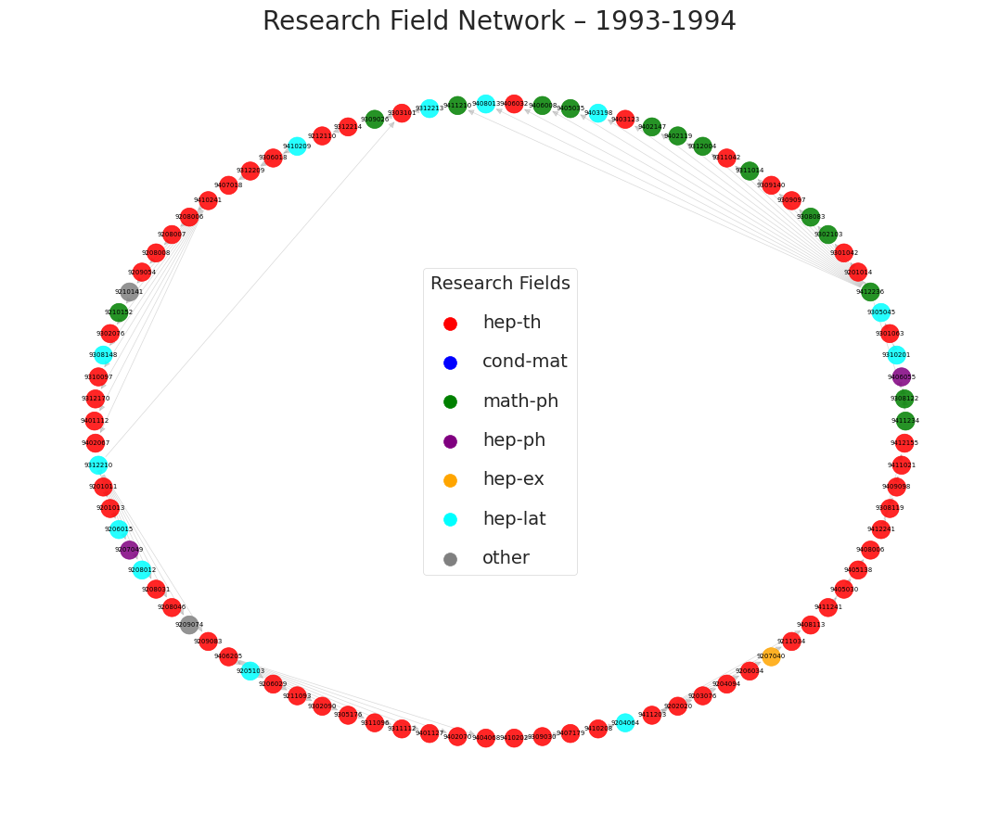

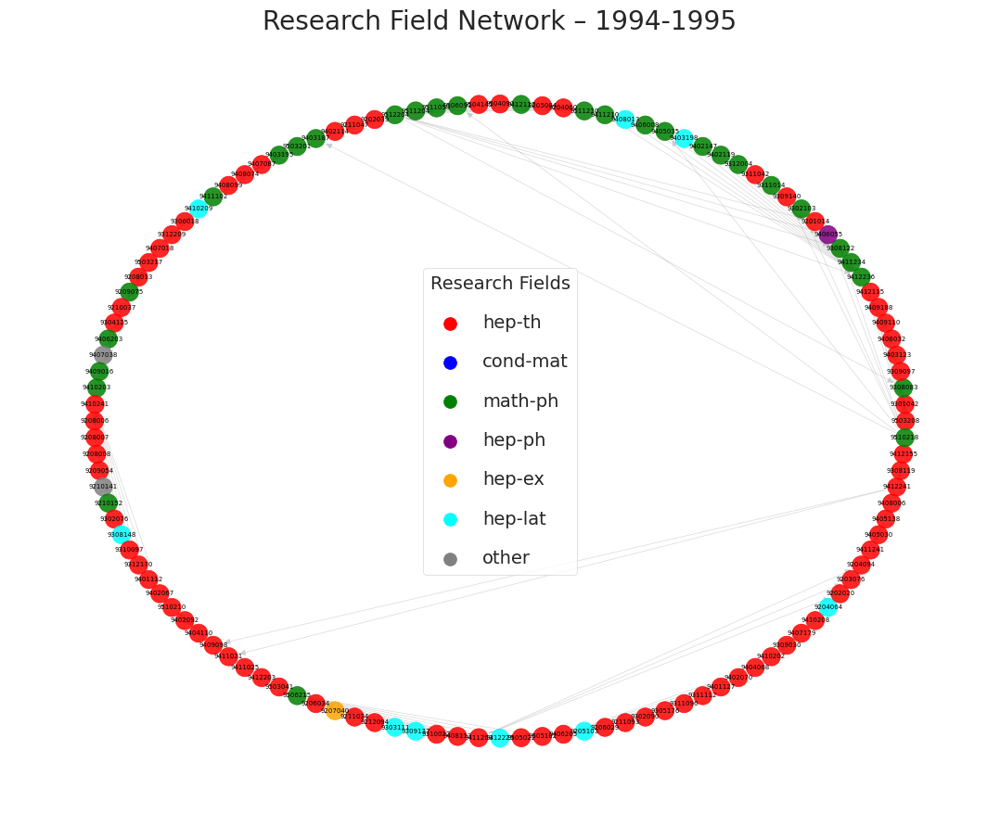

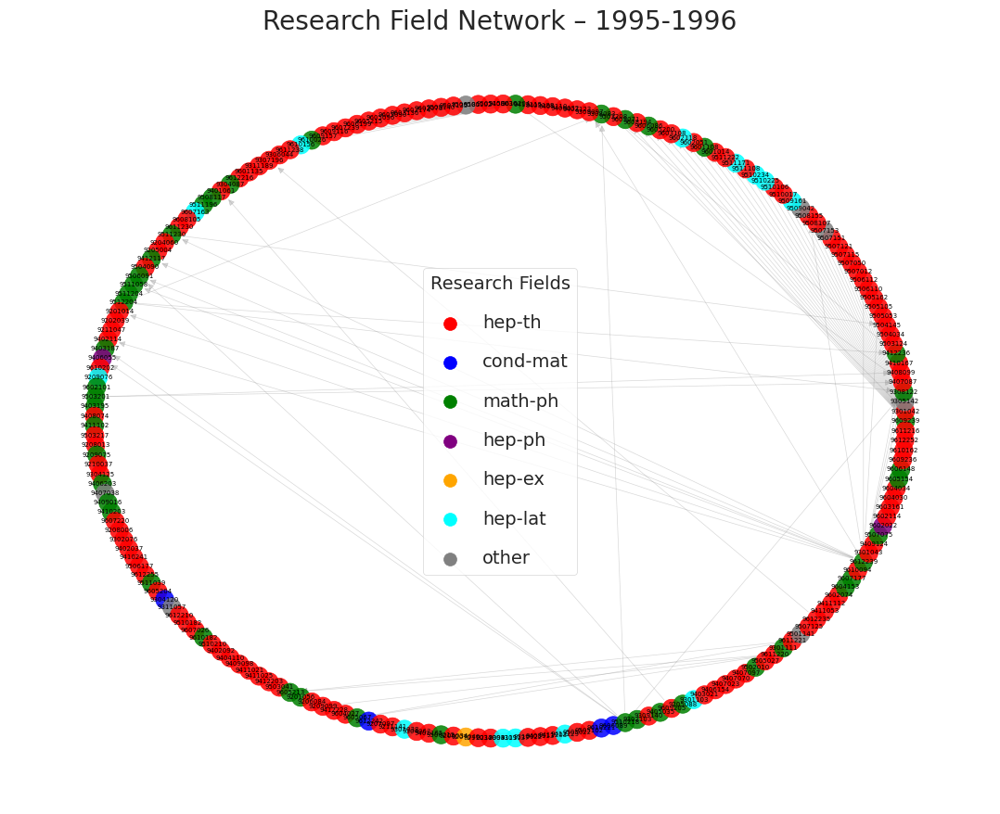

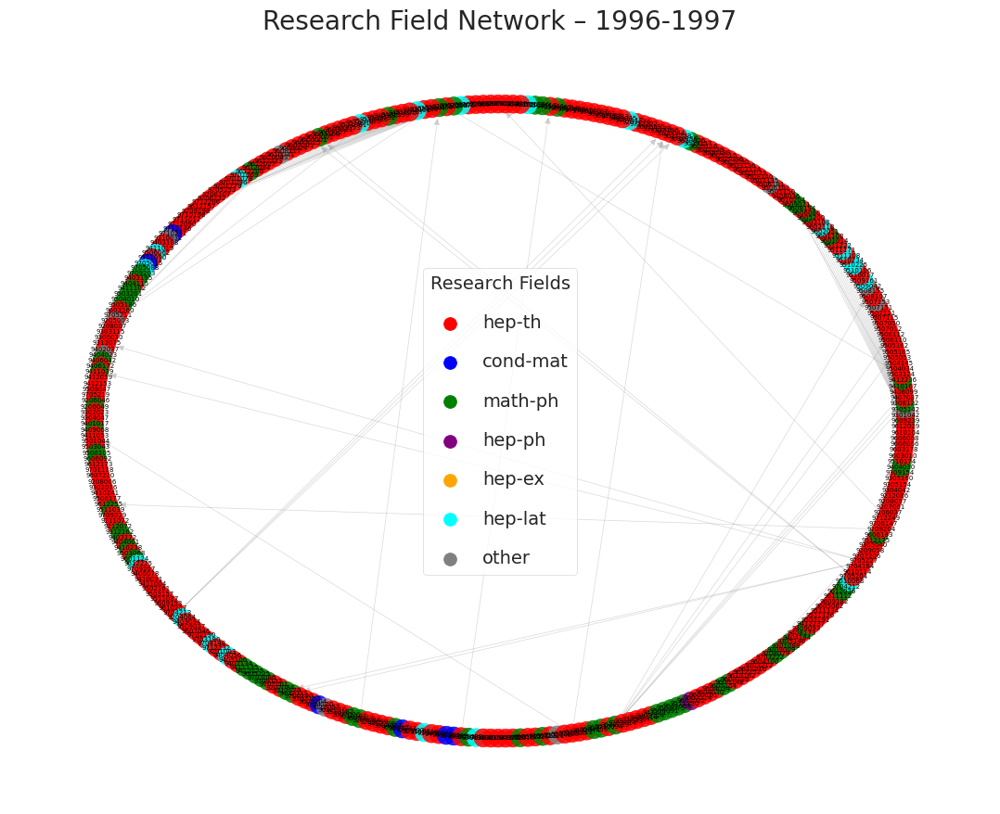

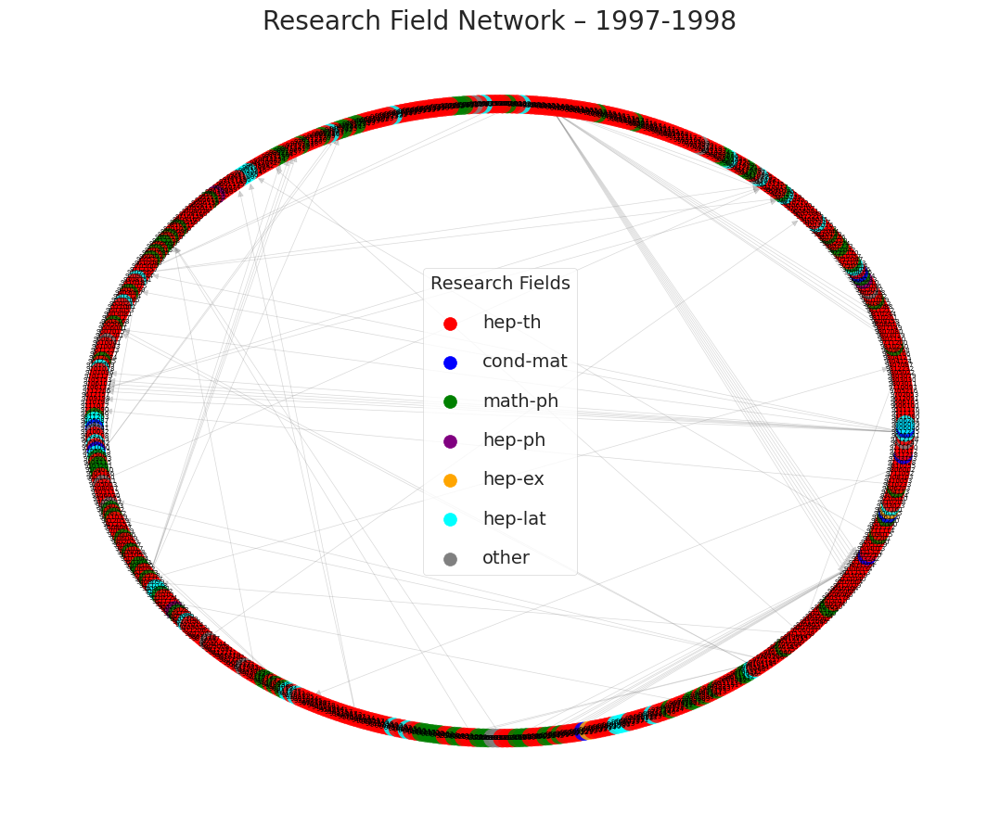

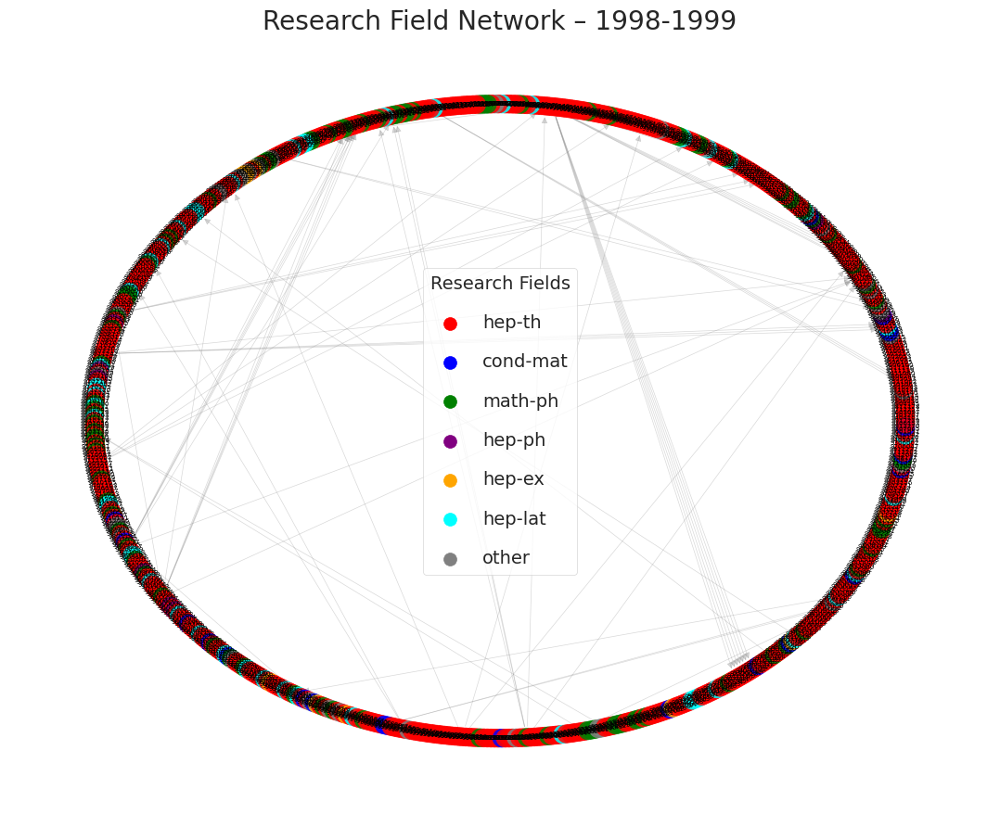

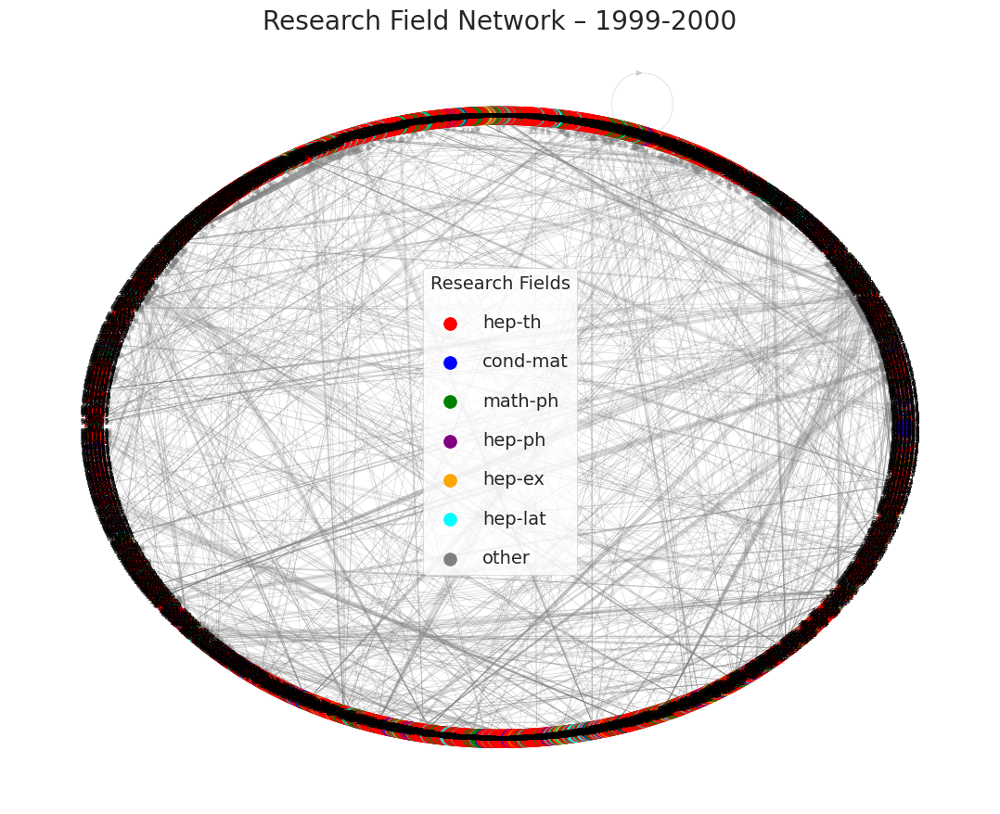

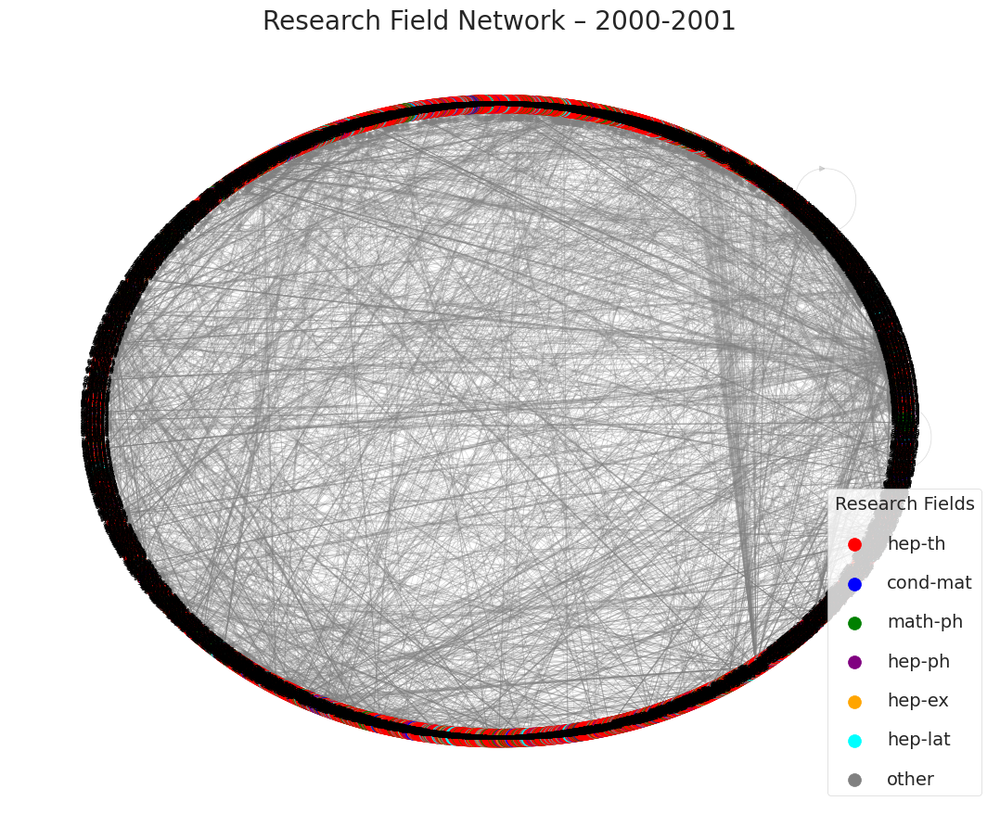

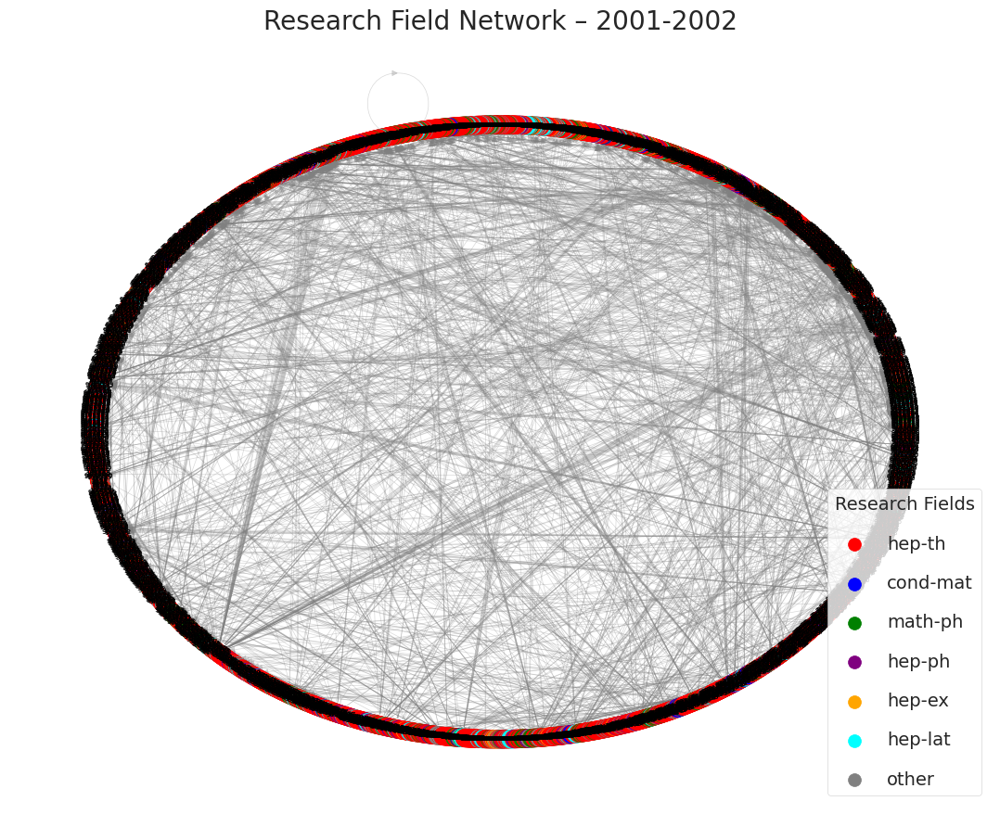

In [ ]:
import matplotlib.pyplot as plt
import networkx as nx
from collections import defaultdict

# Load publication metadata with temporal information
metadata = pd.read_csv("/content/metadata_with_dates.csv")
paper_year = dict(zip(metadata.paper_id, metadata.year))

# Apply refined field classifications from improved metadata
paper_field_map = dict(zip(improved_metadata_df.paper_id, improved_metadata_df.field_refined))

# Load citation network data
citations = []
with open("/content/Cit-HepTh.txt", "r") as f:
    for line in f:
        if line.startswith("#"):
            continue
        citing, cited = map(int, line.strip().split())
        citations.append((citing, cited))

# Create temporal edge list with publication years
temporal_edges = []
for citing, cited in citations:
    year = paper_year.get(citing)
    if year:
        temporal_edges.append((citing, cited, year))

# Define color scheme for research field visualization
field_colors = {
    "hep-th": "red",
    "cond-mat": "blue",
    "math-ph": "green",
    "hep-ph": "purple",
    "hep-ex": "orange",
    "hep-lat": "cyan",
    "other": "gray"
}

# Generate two-year sliding windows for temporal network analysis
years_sorted = sorted(set(year for _, _, year in temporal_edges))
selected_windows = [(y, y + 1) for y in range(min(years_sorted), 2003)]

# Visualize citation networks across temporal windows
for y1, y2 in selected_windows:
    window_years = {y1, y2}
    G = nx.DiGraph()
    node_fields = {}

    # Build citation subgraph for current time window
    for citing, cited, year in temporal_edges:
        if year in window_years:
            G.add_edge(citing, cited)
            if citing in paper_field_map:
                node_fields[citing] = paper_field_map[citing]
            if cited in paper_field_map:
                node_fields[cited] = paper_field_map[cited]

    if len(G) == 0:
        continue

    # Assign node colors based on research field classifications
    node_colors = []
    for node in G.nodes():
        field = node_fields.get(node, "other")
        node_colors.append(field_colors.get(field, "gray"))

    plt.figure(figsize=(11, 9))
    pos = nx.circular_layout(G)

    # Render network with field-based color coding
    nx.draw_networkx_nodes(G, pos, node_size=200, node_color=node_colors, alpha=0.85)
    nx.draw_networkx_edges(G, pos, edge_color="gray", arrows=True, alpha=0.3, width=0.5)
    nx.draw_networkx_labels(G, pos, labels={n: str(n) for n in G.nodes()}, font_size=5)

    # Generate research field legend
    for color, label in {v: k for k, v in field_colors.items()}.items():
        plt.scatter([], [], c=color, label=label, s=100)
    plt.legend(scatterpoints=1, frameon=True, labelspacing=1.2, title="Research Fields")

    plt.title(f"Research Field Network – {y1}-{y2}")
    plt.axis('off')
    plt.tight_layout()
    plt.show()

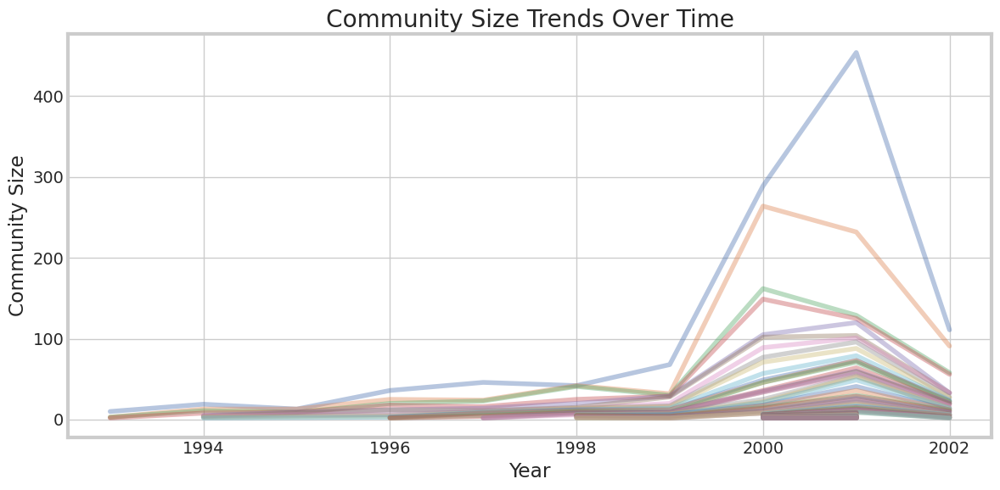

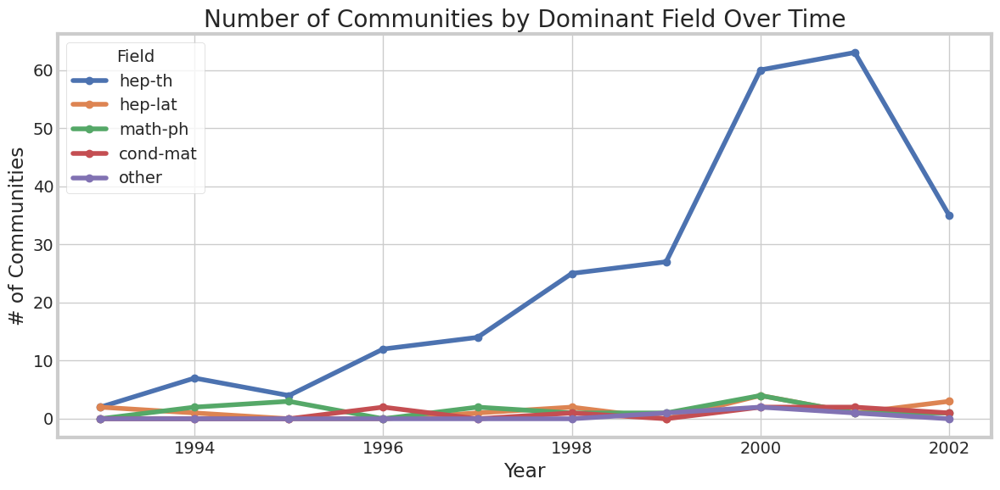

,from_year,from_cid,to_year,to_cid,jaccard
0,1994,0,1995,2,0.217391
1,1994,3,1995,1,0.312500
2,1998,1,1999,0,0.279070
3,1998,15,1999,21,0.375000
4,1999,3,2000,21,0.352941
5,1999,8,2000,9,0.237288
6,1999,13,2000,16,0.228571
7,1999,22,2000,25,0.400000
8,2000,1,2001,0,0.206723
9,2000,7,2001,17,0.247619


from matplotlib import pyplot as plt
df_jaccard_links['from_year'].plot(kind='hist', bins=20, title='from_year')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
df_jaccard_links['from_cid'].plot(kind='hist', bins=20, title='from_cid')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
df_jaccard_links['to_year'].plot(kind='hist', bins=20, title='to_year')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
df_jaccard_links['to_cid'].plot(kind='hist', bins=20, title='to_cid')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
df_jaccard_links.plot(kind='scatter', x='from_year', y='from_cid', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
df_jaccard_links.plot(kind='scatter', x='from_cid', y='to_year', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
df_jaccard_links.plot(kind='scatter', x='to_year', y='to_cid', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
df_jaccard_links.plot(kind='scatter', x='to_cid', y='jaccard', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
import seaborn as sns
def _plot_series(series, series_name, series_index=0):
  palette = list(sns.palettes.mpl_palette('Dark2'))
  xs = series['from_year']
  ys = series['from_cid']
  
  plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

fig, ax = plt.subplots(figsize=(10, 5.2), layout='constrained')
df_sorted = df_jaccard_links.sort_values('from_year', ascending=True)
_plot_series(df_sorted, '')
sns.despine(fig=fig, ax=ax)
plt.xlabel('from_year')
_ = plt.ylabel('from_cid')

from matplotlib import pyplot as plt
import seaborn as sns
def _plot_series(series, series_name, series_index=0):
  palette = list(sns.palettes.mpl_palette('Dark2'))
  xs = series['from_year']
  ys = series['to_cid']
  
  plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

fig, ax = plt.subplots(figsize=(10, 5.2), layout='constrained')
df_sorted = df_jaccard_links.sort_values('from_year', ascending=True)
_plot_series(df_sorted, '')
sns.despine(fig=fig, ax=ax)
plt.xlabel('from_year')
_ = plt.ylabel('to_cid')

from matplotlib import pyplot as plt
import seaborn as sns
def _plot_series(series, series_name, series_index=0):
  palette = list(sns.palettes.mpl_palette('Dark2'))
  xs = series['from_year']
  ys = series['jaccard']
  
  plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

fig, ax = plt.subplots(figsize=(10, 5.2), layout='constrained')
df_sorted = df_jaccard_links.sort_values('from_year', ascending=True)
_plot_series(df_sorted, '')
sns.despine(fig=fig, ax=ax)
plt.xlabel('from_year')
_ = plt.ylabel('jaccard')

from matplotlib import pyplot as plt
import seaborn as sns
def _plot_series(series, series_name, series_index=0):
  palette = list(sns.palettes.mpl_palette('Dark2'))
  counted = (series['from_year']
                .value_counts()
              .reset_index(name='counts')
              .rename({'index': 'from_year'}, axis=1)
              .sort_values('from_year', ascending=True))
  xs = counted['from_year']
  ys = counted['counts']
  plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

fig, ax = plt.subplots(figsize=(10, 5.2), layout='constrained')
df_sorted = df_jaccard_links.sort_values('from_year', ascending=True)
_plot_series(df_sorted, '')
sns.despine(fig=fig, ax=ax)
plt.xlabel('from_year')
_ = plt.ylabel('count()')

from matplotlib import pyplot as plt
df_jaccard_links['from_year'].plot(kind='line', figsize=(8, 4), title='from_year')
plt.gca().spines[['top', 'right']].set_visible(False)

from matplotlib import pyplot as plt
df_jaccard_links['from_cid'].plot(kind='line', figsize=(8, 4), title='from_cid')
plt.gca().spines[['top', 'right']].set_visible(False)

from matplotlib import pyplot as plt
df_jaccard_links['to_year'].plot(kind='line', figsize=(8, 4), title='to_year')
plt.gca().spines[['top', 'right']].set_visible(False)

from matplotlib import pyplot as plt
df_jaccard_links['to_cid'].plot(kind='line', figsize=(8, 4), title='to_cid')
plt.gca().spines[['top', 'right']].set_visible(False)

In [ ]:
import pandas as pd
import networkx as nx
from collections import defaultdict, Counter
from networkx.algorithms.community import greedy_modularity_communities
import matplotlib.pyplot as plt

# Load paper metadata and construct temporal mapping structures
metadata = pd.read_csv("/content/metadata_with_dates.csv")
paper_year = dict(zip(metadata.paper_id, metadata.year))
paper_field_map = dict(zip(improved_metadata_df.paper_id, improved_metadata_df.field_refined))

# Parse citation network from edge list format
citations = []
with open("/content/Cit-HepTh.txt", "r") as f:
    for line in f:
        if line.startswith("#"):
            continue
        citing, cited = map(int, line.strip().split())
        citations.append((citing, cited))

# Create temporal edge list with publication years for chronological analysis
temporal_edges = []
for citing, cited in citations:
    year = paper_year.get(citing)
    if year:
        temporal_edges.append((citing, cited, year))

# Community detection using greedy modularity optimization
def detect_communities(G):
    return list(greedy_modularity_communities(G.to_undirected()))

# Calculate Newman-Girvan modularity score for community quality assessment
def compute_modularity(G, communities):
    return nx.algorithms.community.quality.modularity(G.to_undirected(), communities)

# Temporal community detection with change point identification
def run_graphscope(edges, start_year, end_year, threshold=0.05):
    results = {}
    prev_mod = None

    for year in range(start_year, end_year + 1):
        # Construct annual citation subgraph
        G = nx.DiGraph()
        for citing, cited, edge_year in edges:
            if edge_year == year:
                G.add_edge(citing, cited)

        if len(G) == 0:
            continue

        communities = detect_communities(G)
        modularity = compute_modularity(G, communities)

        # Detect significant structural changes based on modularity shifts
        change = prev_mod is not None and abs(modularity - prev_mod) > threshold
        results[year] = {
            "graph": G,
            "communities": communities,
            "modularity": modularity,
            "change_point": change
        }
        prev_mod = modularity

    return results

start_year, end_year = metadata.year.min(), metadata.year.max()
results = run_graphscope(temporal_edges, start_year, end_year)

# Build community node sets for temporal similarity tracking
community_sets = {
    (year, cid): set(comm)
    for year, data in results.items()
    for cid, comm in enumerate(data["communities"])
}

# Calculate Jaccard similarity between consecutive year community pairs
jaccard_links = []
years_sorted = sorted(set(year for year, _ in community_sets))

for i in range(1, len(years_sorted)):
    y_prev, y_curr = years_sorted[i - 1], years_sorted[i]
    prev_comms = {cid: community_sets[(y_prev, cid)]
                  for cid in range(len(results[y_prev]["communities"]))}
    curr_comms = {cid: community_sets[(y_curr, cid)]
                  for cid in range(len(results[y_curr]["communities"]))}

    for pid, p_nodes in prev_comms.items():
        for cid, c_nodes in curr_comms.items():
            union = p_nodes | c_nodes
            if len(union) == 0:
                continue

            # Compute Jaccard coefficient for community overlap assessment
            score = len(p_nodes & c_nodes) / len(union)
            if score > 0.2:  # Filter weak connections below threshold
                jaccard_links.append({
                    "from_year": y_prev,
                    "from_cid": pid,
                    "to_year": y_curr,
                    "to_cid": cid,
                    "jaccard": score
                })

df_jaccard_links = pd.DataFrame(jaccard_links)

# Aggregate community size evolution data for temporal analysis
community_size_trend = []
for year, data in results.items():
    for cid, comm in enumerate(data["communities"]):
        community_size_trend.append({
            "year": year,
            "community_id": cid,
            "size": len(comm)
        })
df_size_trend = pd.DataFrame(community_size_trend)

# Visualize community size trajectories across temporal dimension
plt.figure(figsize=(12, 6))
for cid in df_size_trend['community_id'].unique():
    subset = df_size_trend[df_size_trend['community_id'] == cid]
    plt.plot(subset["year"], subset["size"], alpha=0.4)
plt.title("Community Size Trends Over Time")
plt.xlabel("Year")
plt.ylabel("Community Size")
plt.grid(True)
plt.tight_layout()
plt.show()

# Map communities to dominant research fields using plurality voting
field_counts = defaultdict(lambda: defaultdict(int))

for year, data in results.items():
    for cid, community in enumerate(data["communities"]):
        fields = [paper_field_map.get(p) for p in community if p in paper_field_map]
        if fields:
            # Assign community to most frequent field among member papers
            dominant = Counter(fields).most_common(1)[0][0]
            field_counts[year][dominant] += 1

df_field_trend = pd.DataFrame(field_counts).T.fillna(0).astype(int).sort_index()

# Generate time series plot of field-specific community counts
plt.figure(figsize=(12, 6))
df_field_trend.plot(kind='line', marker='o', ax=plt.gca())
plt.title("Number of Communities by Dominant Field Over Time")
plt.xlabel("Year")
plt.ylabel("# of Communities")
plt.legend(title="Field")
plt.grid(True)
plt.tight_layout()
plt.show()

# Output community evolution linkage table for further analysis
display(df_jaccard_links)

## **Stochastic Block Model (SBM)**

### **GraphWave**

In [ ]:
#!pip install networkx scipy scikit-learn matplotlib seaborn pandas numpy plotly community-detection python-louvain textblob wordcloud

In [ ]:
# Core Analysis Pipeline using Real CIT-HepTh Data

import pandas as pd
import numpy as np
import networkx as nx
from collections import defaultdict, Counter
from typing import Dict, List
import matplotlib.pyplot as plt
from plotly.subplots import make_subplots
import plotly.graph_objects as go
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from scipy import sparse
from scipy.sparse.linalg import eigsh
from community import community_louvain # Import community_louvain submodule
import warnings
warnings.filterwarnings("ignore")

# === GraphWave Implementation ===
class GraphWave:
    def __init__(self, sample_points=20, step_size=0.2, max_scale=10.0):
        self.sample_points = sample_points
        self.step_size = step_size
        self.max_scale = max_scale
        self.embeddings_ = None

    def _compute_heat_kernel(self, L: sparse.csr_matrix, t: float) -> sparse.csr_matrix:
        try:
            eigenvals, eigenvecs = eigsh(L, k=min(50, L.shape[0] - 2), which='SM', sigma=0.0)
            heat_kernel = eigenvecs @ np.diag(np.exp(-t * eigenvals)) @ eigenvecs.T
            return sparse.csr_matrix(heat_kernel)
        except:
            L_dense = L.toarray()
            eigenvals, eigenvecs = np.linalg.eigh(L_dense)
            heat_kernel = eigenvecs @ np.diag(np.exp(-t * eigenvals)) @ eigenvecs.T
            return sparse.csr_matrix(heat_kernel)


    def _compute_characteristic_function(self, graph: nx.Graph, node: int) -> np.ndarray:
        L = nx.normalized_laplacian_matrix(graph)
        scales = np.linspace(self.step_size, self.max_scale, self.sample_points)
        characteristic_values = []
        node_idx = list(graph.nodes()).index(node)
        for t in scales:
            heat_kernel = self._compute_heat_kernel(L, t)
            char_value = heat_kernel[node_idx, node_idx]
            characteristic_values.append(char_value)
        return np.array(characteristic_values)

    def fit_transform(self, graph: nx.Graph) -> np.ndarray:
        nodes = list(graph.nodes())
        embeddings = np.zeros((len(nodes), self.sample_points))
        for i, node in enumerate(nodes):
            embeddings[i] = self._compute_characteristic_function(graph, node)
        self.embeddings_ = StandardScaler().fit_transform(embeddings)
        return self.embeddings_

    def identify_structural_roles(self, graph: nx.Graph, n_clusters: int = 5) -> Dict[str, List[int]]:
        if self.embeddings_ is None:
            self.fit_transform(graph)
        kmeans = KMeans(n_clusters=n_clusters, random_state=42)
        labels = kmeans.fit_predict(self.embeddings_)
        nodes = list(graph.nodes())
        roles = defaultdict(list)
        betweenness = nx.betweenness_centrality(graph)
        closeness = nx.closeness_centrality(graph)
        degree = nx.degree_centrality(graph)
        for cluster in range(n_clusters):
            cluster_nodes = [nodes[i] for i, label in enumerate(labels) if label == cluster]
            ab, ac, ad = np.mean([betweenness[n] for n in cluster_nodes]), np.mean([closeness[n] for n in cluster_nodes]), np.mean([degree[n] for n in cluster_nodes])
            if ab > 0.01 and ad > 0.1:
                role = "hub"
            elif ab > 0.01:
                role = "bridge"
            elif ad > 0.1:
                role = "connector"
            elif ac > 0.3:
                role = "central"
            else:
                role = "peripheral"
            roles[f"{role}_{cluster}"] = cluster_nodes
        return dict(roles)

# === Core Analysis Pipeline ===
class CommunityAnalyzer:
    def __init__(self, citation_path: str, metadata_path: str, time_window: int = 2):
        self.citation_df = pd.read_csv(citation_path, sep='\t', comment='#', names=["citing", "cited"])
        self.metadata_df = pd.read_csv(metadata_path)
        self.time_window = time_window
        self.temporal_graphs = {}
        self.communities = {}
        self.structural_roles = {}
        self.influence_patterns = {}
        self.community_evolution = {}

    def create_temporal_networks(self):
        merged = self.citation_df.merge(self.metadata_df[['paper_id', 'year']], left_on='citing', right_on='paper_id')\
                                  .merge(self.metadata_df[['paper_id', 'year']], left_on='cited', right_on='paper_id', suffixes=('_citing', '_cited'))
        for start in range(merged['year_citing'].min(), merged['year_citing'].max(), self.time_window):
            end = min(start + self.time_window - 1, merged['year_citing'].max())
            window_data = merged[(merged['year_citing'] >= start) & (merged['year_citing'] <= end)]
            G = nx.DiGraph()
            for _, row in window_data.iterrows():
                G.add_edge(row['cited'], row['citing'])
            self.temporal_graphs[f"{start}-{end}"] = G

    def detect_communities_and_roles(self):
        for window, G in self.temporal_graphs.items():
            UG = G.to_undirected()
            # Use community_louvain.best_partition from the imported module
            partition = community_louvain.best_partition(UG)
            self.communities[window] = partition
            if len(UG.nodes()) > 10:
                gw = GraphWave()
                roles = gw.identify_structural_roles(UG)
                self.structural_roles[window] = roles

    def identify_knowledge_exporters_importers(self):
        for window, G in self.temporal_graphs.items():
            part = self.communities[window]
            roles = self.structural_roles.get(window, {})
            metrics = defaultdict(lambda: {'self': 0, 'in': 0, 'out': 0, 'bridge': 0, 'hub': 0, 'nodes': set()})
            for role, nodes in roles.items():
                for node in nodes:
                    if node in part:
                        comm = part[node]
                        if 'bridge' in role:
                            metrics[comm]['bridge'] += 1
                        elif 'hub' in role:
                            metrics[comm]['hub'] += 1
                        metrics[comm]['nodes'].add(node)
            for a, b in G.edges():
                ca, cb = part.get(a), part.get(b)
                if ca is not None and cb is not None:
                    metrics[ca]['nodes'].add(a)
                    metrics[cb]['nodes'].add(b)
                    if ca == cb:
                        metrics[ca]['self'] += 1
                    else:
                        metrics[ca]['out'] += 1
                        metrics[cb]['in'] += 1
            summary = {}
            for c, m in metrics.items():
                total = m['self'] + m['in'] + m['out']
                size = len(m['nodes'])
                if total > 0 and size > 0:
                    summary[c] = {
                        'size': size,
                        'self_cite': m['self'] / total,
                        'export': m['out'] / total,
                        'import': m['in'] / total,
                        'interdisciplinary': (m['bridge'] + m['hub']) / size,
                        'total': total
                    }
            self.influence_patterns[window] = summary

    def detect_stagnation_patterns(self):
        stagnation = {}
        all_comm_ids = set(c for d in self.communities.values() for c in d.values())
        windows = sorted(self.influence_patterns.keys())
        for cid in all_comm_ids:
            traj = {'self': [], 'total': [], 'windows': []}
            for w in windows:
                comms = self.influence_patterns[w]
                if cid in comms:
                    traj['self'].append(comms[cid]['self_cite'])
                    traj['total'].append(comms[cid]['total'])
                    traj['windows'].append(w)
            if len(traj['self']) >= 3:
                slope_self = np.polyfit(range(len(traj['self'])), traj['self'], 1)[0]
                slope_total = np.polyfit(range(len(traj['total'])), traj['total'], 1)[0]
                stagnation[cid] = {'is_stagnating': slope_self > 0.01 and slope_total < 0, 'trend': traj}
        return stagnation

    def visualize_community_evolution(self):
        time_windows = list(self.communities.keys())
        comm_counts = [len(set(self.communities[tw].values())) for tw in time_windows]
        # Use community_louvain.modularity from the imported module
        mod_scores = [community_louvain.modularity(self.communities[tw], self.temporal_graphs[tw].to_undirected()) if self.communities[tw] and self.temporal_graphs[tw].number_of_nodes() > 0 else 0 for tw in time_windows]

        fig = make_subplots(rows=1, cols=2, subplot_titles=["Community Count", "Modularity Over Time"])
        fig.add_trace(go.Scatter(x=time_windows, y=comm_counts, mode='lines+markers', name='Community Count'), row=1, col=1)
        fig.add_trace(go.Scatter(x=time_windows, y=mod_scores, mode='lines+markers', name='Modularity'), row=1, col=2)
        fig.update_layout(height=400, width=900, title_text="Community Evolution Summary")
        fig.show()

    # Helper function to classify subfields based on influence patterns (Example)
    def classify_subfields(self, time_window):
        influence_data = self.influence_patterns.get(time_window, {})
        classifications = defaultdict(list)
        for comm_id, metrics in influence_data.items():
            if metrics['export'] > 0.5 and metrics['import'] < 0.3:
                classifications['exporter']
            elif metrics['import'] > 0.5 and metrics['export'] < 0.3:
                classifications['importer']
            elif metrics['self_cite'] > 0.5:
                classifications['self_referential']
            elif metrics['interdisciplinary'] > 0.1:
                classifications['interdisciplinary']
            else:
                classifications['other']

            if metrics['export'] > 0.5 and metrics['import'] < 0.3:
                classifications['exporter'].append(comm_id)
            elif metrics['import'] > 0.5 and metrics['export'] < 0.3:
                classifications['importer'].append(comm_id)
            elif metrics['self_cite'] > 0.5:
                classifications['self_referential'].append(comm_id)
            elif metrics['interdisciplinary'] > 0.1:
                classifications['interdisciplinary'].append(comm_id)
            else:
                classifications['other'].append(comm_id)
        return dict(classifications)



# === Example Usage ===
analyzer = CommunityAnalyzer("/content/Cit-HepTh.txt", "/content/metadata_with_dates.csv")
analyzer.create_temporal_networks()
analyzer.detect_communities_and_roles()
analyzer.identify_knowledge_exporters_importers()
analyzer.visualize_community_evolution()
stagnation = analyzer.detect_stagnation_patterns()

# Step 1: Classify subfields
latest_window = list(analyzer.influence_patterns.keys())[-1]
classifications = analyzer.classify_subfields(latest_window)

print(f"\n=== Subfield Classifications for {latest_window} ===")
for label, comms in classifications.items():
    print(f"{label.title().replace('_',' ')}: {len(comms)} communities")

# Step 2: Show stagnating communities
stagnation = analyzer.detect_stagnation_patterns()
stagnating = [cid for cid, d in stagnation.items() if d['is_stagnating']]
print(f"\nDetected {len(stagnating)} stagnating communities.")


=== Subfield Classifications for 2001-2002 ===
Self Referential: 79 communities

Detected 0 stagnating communities.


New Approach

Starting Citation Network Analysis...
Loading citation network data...
Loaded 9171 citation edges from 1993.0 to 2002.0

Years available in dataset: [np.float64(1993.0), np.float64(1994.0), np.float64(1995.0), np.float64(1996.0), np.float64(1997.0), np.float64(1998.0), np.float64(1999.0), np.float64(2000.0), np.float64(2001.0), np.float64(2002.0)]
Year range: 1993.0 to 2002.0
Building yearly graphs with window size 3...
Processing years from 1993 to 2003
Available years in data: [np.float64(1993.0), np.float64(1994.0), np.float64(1995.0), np.float64(1996.0), np.float64(1997.0), np.float64(1998.0), np.float64(1999.0), np.float64(2000.0), np.float64(2001.0), np.float64(2002.0)]
Processing years from 1993 to 2003
Available years in data: [np.float64(1993.0), np.float64(1994.0), np.float64(1995.0), np.float64(1996.0), np.float64(1997.0), np.float64(1998.0), np.float64(1999.0), np.float64(2000.0), np.float64(2001.0), np.float64(2002.0)]
Processing years from 1993 to 2003
Available years in 

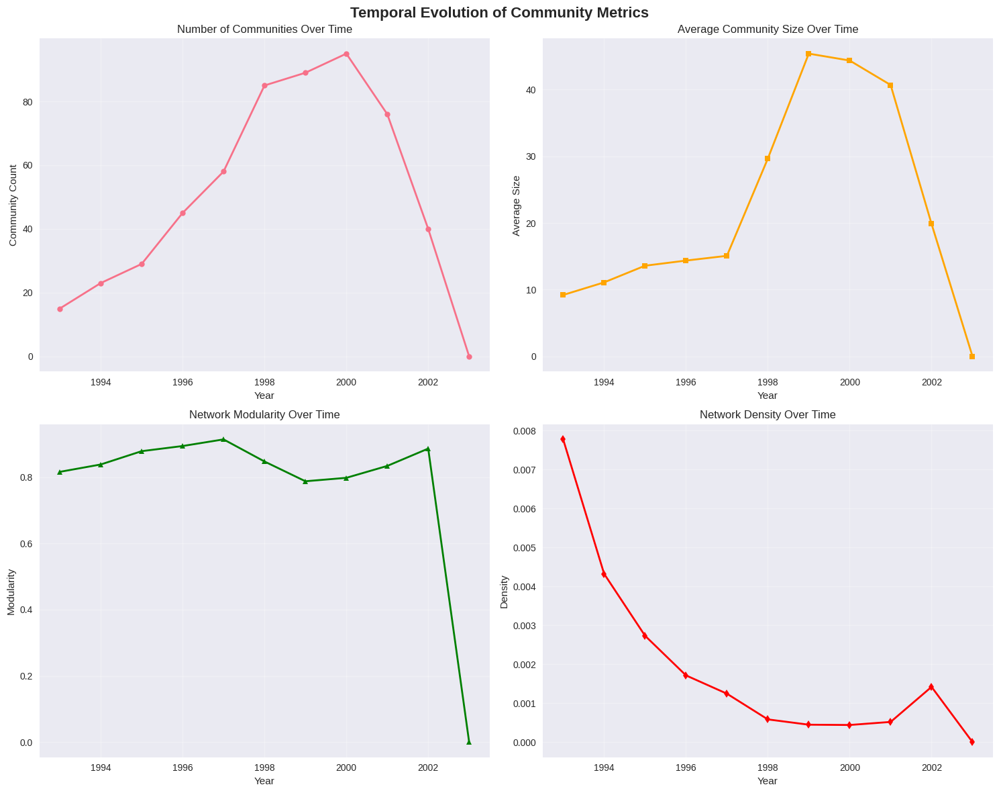

Creating community size distributions...


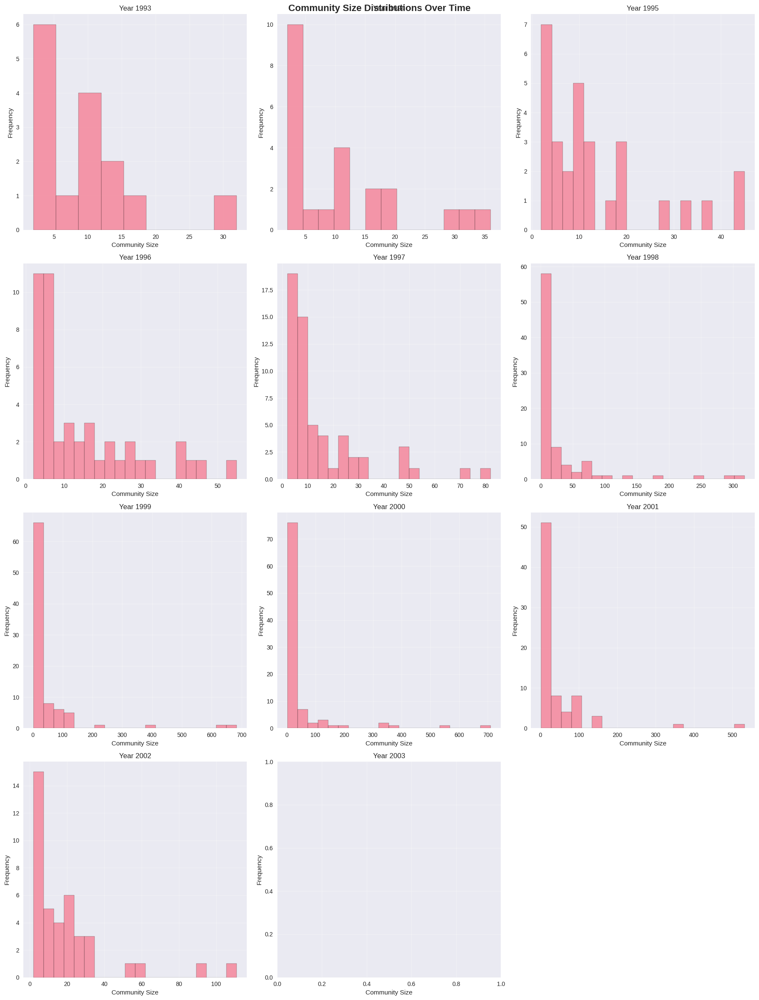

Creating self-citation analysis...


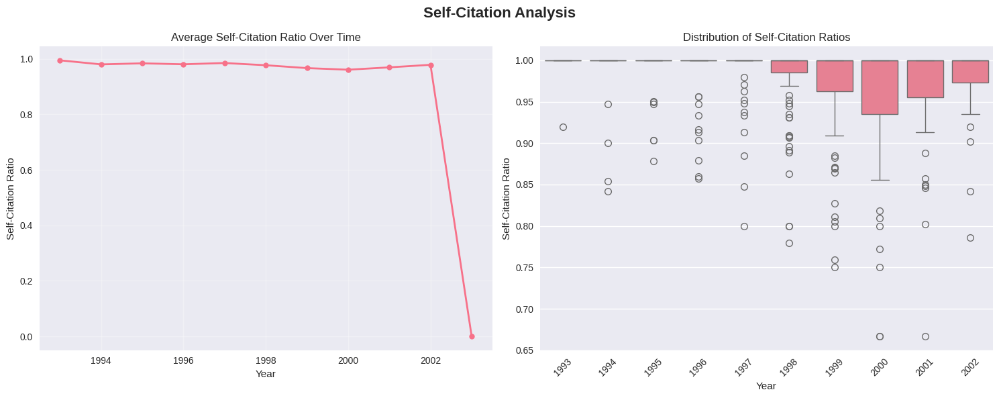

Creating meta-graph analysis for all years...


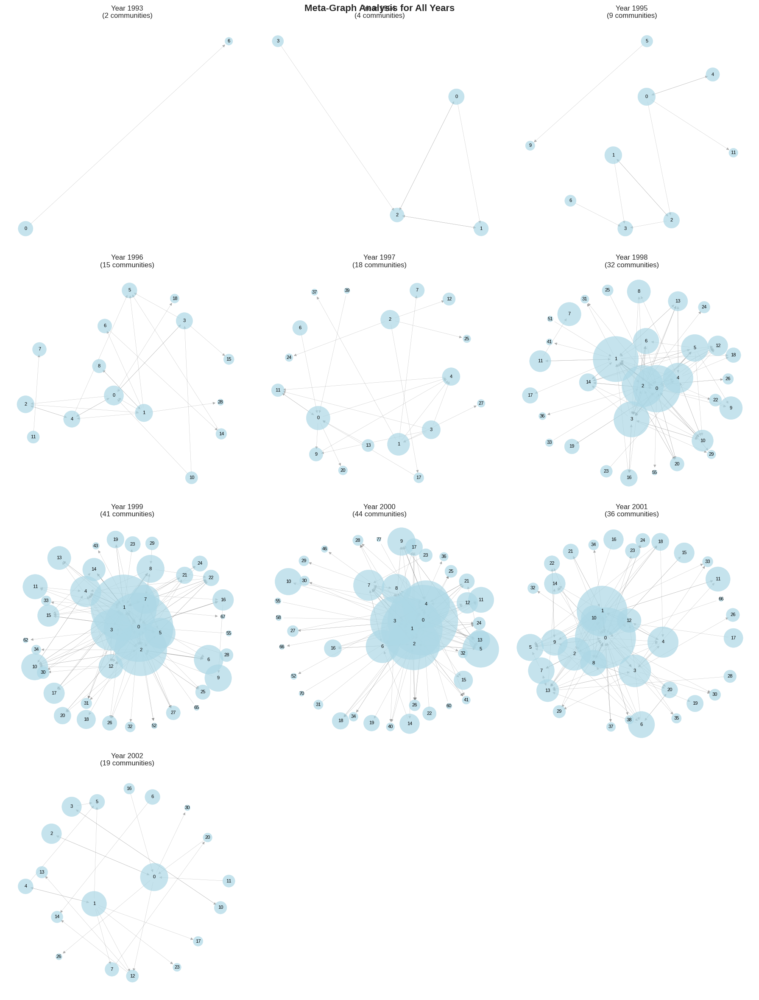

Creating meta-graph statistics...


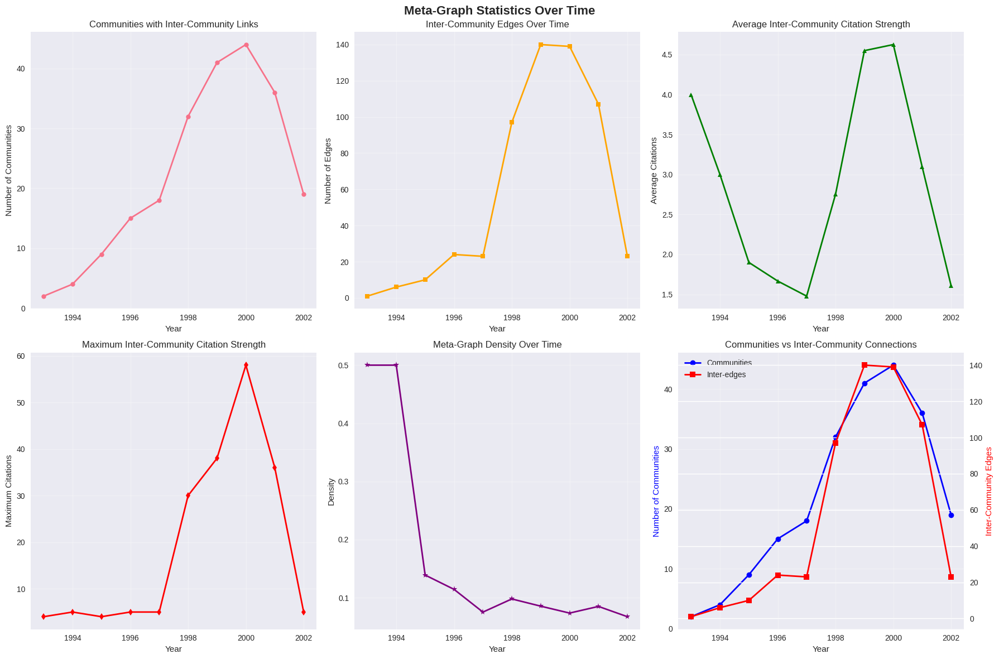

Creating inter-community citation histograms with statistics...

Generating grid of inter-community citation histograms...


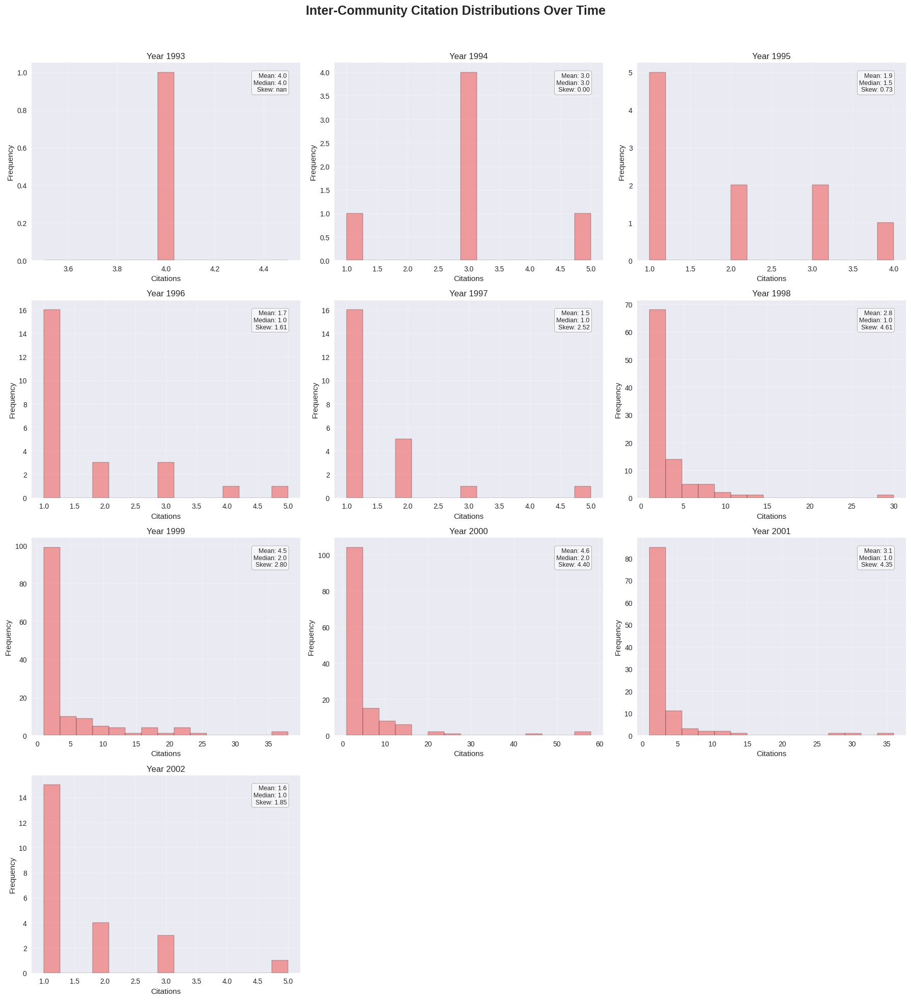

Creating interactive visualization...


Creating community stability plot...

Generating Community Stability Analysis...


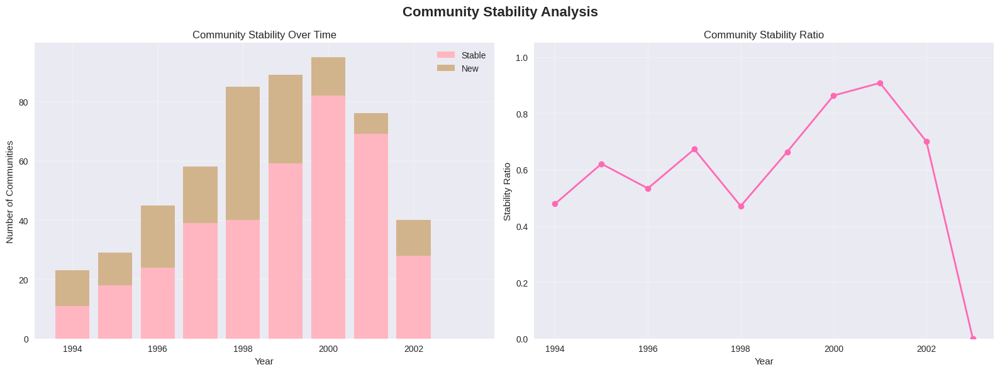


Running advanced analyses...

Analyzing community evolution patterns...


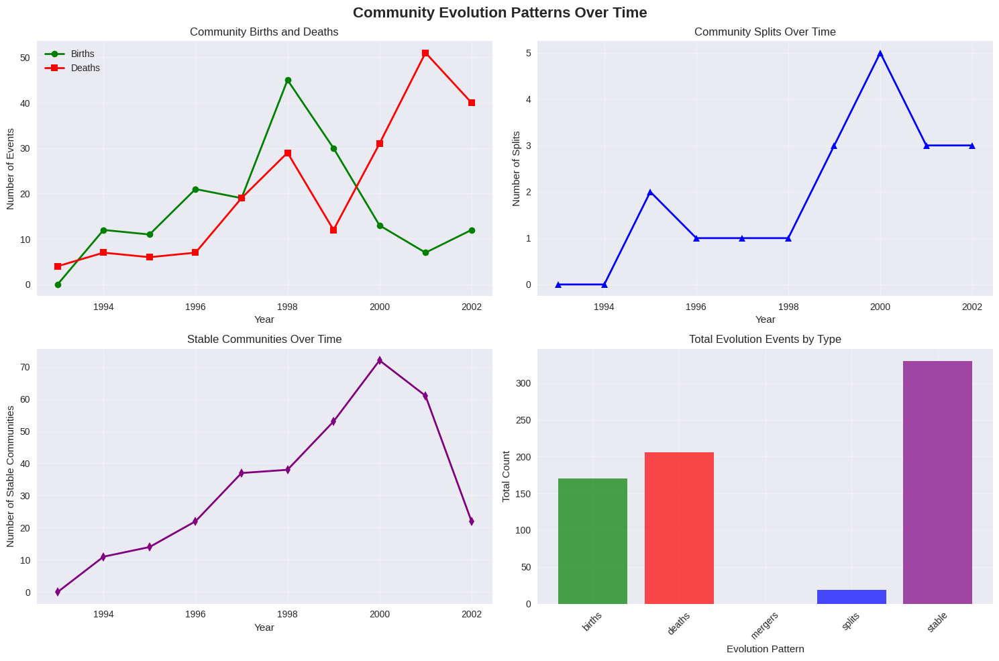


Community Evolution Summary:
  Births: 170 events
  Deaths: 206 events
  Mergers: 0 events
  Splits: 19 events
  Stable: 330 events

Computing network resilience metrics...


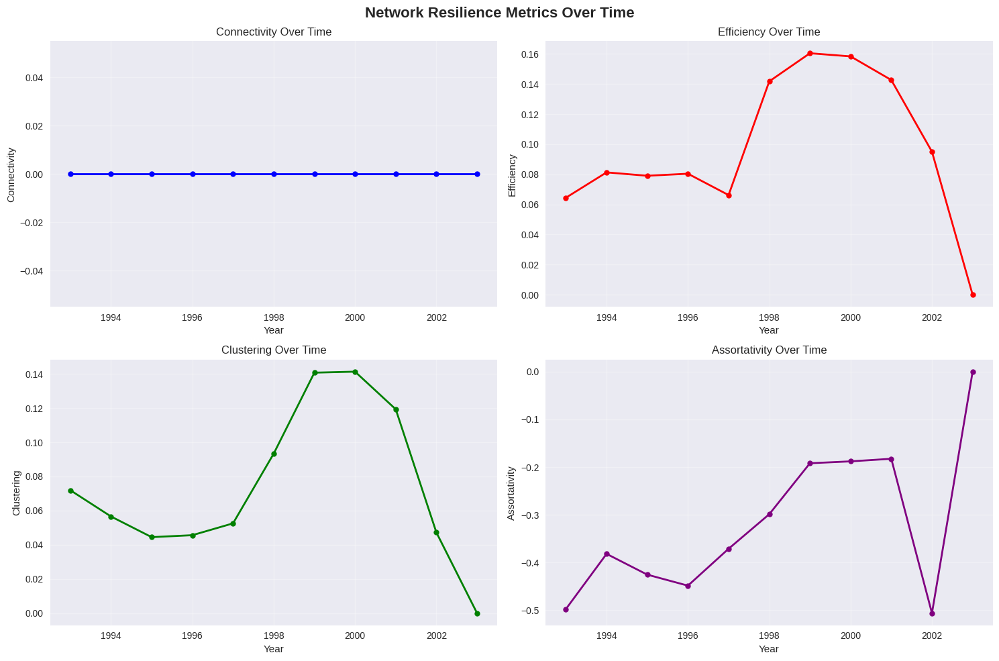


Analysis Results Summary:
- Analyzed 11 time periods
- Total unique papers: 16965
- Total citations: 27146
- Total communities detected: 555
- Years with community data: 10
- Average nodes per year: 1542.3
- Average edges per year: 2467.8
- Average network density: 0.0019


In [10]:
# Import Libraries
import networkx as nx
import pandas as pd
from collections import defaultdict
import networkx.algorithms.community as nx_comm
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from matplotlib.patches import Rectangle
import plotly.graph_objects as go
import plotly.express as px
from plotly.subplots import make_subplots
import warnings
warnings.filterwarnings('ignore')

# Set visualization style for publication-quality figures
plt.style.use('seaborn-v0_8')
sns.set_palette("husl")

# Load and Preprocess the Citation Network
def load_and_preprocess_data():
    """Load and preprocess citation network data from the High Energy Physics Theory corpus.
    This function creates a temporal citation network by merging edge data with publication years."""
    print("Loading citation network data...")

    # Load citation edges - represents the directed network of paper citations
    edges_df = pd.read_csv("Cit-HepTh.txt", comment='#', sep='\t', names=['source', 'target'])

    # Load metadata with year information to enable temporal analysis
    merged_df = pd.read_csv("/content/metadata_with_dates.csv")

    # Merge year information to create temporal context for each citation
    edges_df = pd.merge(edges_df, merged_df[['paper_id', 'year']],
                       left_on='source', right_on='paper_id', how='left')
    edges_df = edges_df.drop(columns=['paper_id'])

    # Filter by year range to focus on a specific research period (include all years up to 2003)
    edges_df = edges_df[(edges_df['year'] >= 1992) & (edges_df['year'] <= 2003)]

    print(f"Loaded {len(edges_df)} citation edges from {edges_df['year'].min()} to {edges_df['year'].max()}")
    return edges_df

# Build Yearly Graphs
def build_yearly_graphs(df, window=3):
    """Build citation graphs for each time window using a sliding window approach.
    The window parameter controls temporal granularity - larger windows capture longer-term patterns."""
    print(f"Building yearly graphs with window size {window}...")

    yearly_graphs = {}
    years = sorted(df['year'].unique())

    # Ensure we process all years from start to end, maintaining temporal continuity
    start_year = int(min(years))
    end_year = 2003  # Force it to go up to 2003

    for start in range(start_year, end_year + 1):
      print(f"Processing years from {start_year} to {end_year}")
      print(f"Available years in data: {sorted(years)}")

    # Process each year as a starting point for the window
    # This sliding window approach captures evolving citation patterns over time
    for start in range(start_year, end_year + 1):
        end_window = min(start + window, end_year + 1)
        window_edges = df[(df['year'] >= start) & (df['year'] < end_window)]

        # Create graph even if we have few edges (important for studying field emergence/decline)
        G = nx.DiGraph()
        if len(window_edges) > 0:
            G.add_edges_from(window_edges[['source', 'target']].values)

        yearly_graphs[start] = G
        print(f"  Year {start} (window {start}-{end_window-1}): {len(G.nodes())} nodes, {len(G.edges())} edges")

    return yearly_graphs

# Community Detection
def detect_communities(G):
    """Detect research communities using modularity optimization algorithms.
    Communities represent clusters of papers with high internal citation density, indicating shared research topics."""
    if len(G.nodes()) == 0:
        return {}

    # Convert to undirected for community detection (citations indicate bidirectional research relationships)
    undirected = G.to_undirected()

    # Use NetworkX's Louvain implementation for robust community detection
    try:
        # Try greedy modularity communities first (more stable and widely used in scientometrics)
        communities = nx_comm.greedy_modularity_communities(undirected)

        # Convert to partition dictionary for easier manipulation
        partition = {}
        for i, community in enumerate(communities):
            for node in community:
                partition[node] = i

        return partition
    except:
        # Fallback to simpler label propagation if Louvain fails
        try:
            communities = nx_comm.label_propagation_communities(undirected)
            partition = {}
            for i, community in enumerate(communities):
                for node in community:
                    partition[node] = i
            return partition
        except:
            # Last resort: each node is its own community (extreme fragmentation scenario)
            return {node: i for i, node in enumerate(G.nodes())}

# Community Matching
def jaccard_similarity(set1, set2):
    """Calculate Jaccard similarity between two sets using intersection over union.
    This metric quantifies overlap between communities across time periods."""
    if len(set1 | set2) == 0:
        return 0
    return len(set1 & set2) / len(set1 | set2)

def match_communities(prev_part, curr_part):
    """Match communities between consecutive time periods using maximum Jaccard similarity.
    This enables tracking of community evolution, merging, splitting, and emergence over time."""
    matches = {}
    prev_comms = defaultdict(set)
    curr_comms = defaultdict(set)

    # Group nodes by their community assignments
    for n, c in prev_part.items():
        prev_comms[c].add(n)
    for n, c in curr_part.items():
        curr_comms[c].add(n)

    # Find best matches based on member overlap (Jaccard similarity)
    for curr_id, curr_nodes in curr_comms.items():
        best_score = 0
        best_match = None
        for prev_id, prev_nodes in prev_comms.items():
            score = jaccard_similarity(prev_nodes, curr_nodes)
            if score > best_score and score > 0.1:  # Minimum similarity threshold to avoid spurious matches
                best_score = score
                best_match = prev_id
        matches[curr_id] = best_match

    return matches

# Compute Structural Metrics
def compute_modularity(G, partition):
    """Compute modularity score for a partition, measuring quality of community structure.
    Higher modularity indicates stronger within-community connections relative to between-community connections."""
    if len(G.nodes()) == 0 or len(partition) == 0:
        return 0

    try:
        # Convert partition to list of sets for NetworkX compatibility
        communities = defaultdict(set)
        for node, comm in partition.items():
            communities[comm].add(node)

        community_list = list(communities.values())
        return nx_comm.modularity(G, community_list)
    except:
        return 0

def compute_metrics(G, partition):
    """Compute structural metrics for each community to characterize their internal organization.
    These metrics reveal how tightly knit each research community is and their internal connectivity patterns."""
    comm_metrics = defaultdict(dict)

    if len(partition) == 0:
        return comm_metrics

    for comm_id in set(partition.values()):
        nodes = [n for n in partition if partition[n] == comm_id]
        subgraph = G.subgraph(nodes)

        # Community size - indicates scope of research area
        comm_metrics[comm_id]['size'] = len(nodes)

        # Overall modularity (same for all communities in this implementation)
        comm_metrics[comm_id]['modularity'] = compute_modularity(G.to_undirected(), partition)

        # Average betweenness centrality within community - measures information flow patterns
        if len(nodes) > 1:
            try:
                betweenness = nx.betweenness_centrality(subgraph)
                comm_metrics[comm_id]['avg_betweenness'] = sum(betweenness.values()) / len(nodes)
            except:
                comm_metrics[comm_id]['avg_betweenness'] = 0
        else:
            comm_metrics[comm_id]['avg_betweenness'] = 0

        # Average degree centrality within community - measures local connectivity
        if len(nodes) > 1:
            try:
                centrality = nx.degree_centrality(subgraph)
                comm_metrics[comm_id]['avg_centrality'] = sum(centrality.values()) / len(nodes)
            except:
                comm_metrics[comm_id]['avg_centrality'] = 0
        else:
            comm_metrics[comm_id]['avg_centrality'] = 0

    return comm_metrics

# Meta-Graph Construction
def build_meta_graph(G, partition):
    """Build meta-graph showing inter-community citations as weighted edges.
    This reveals knowledge transfer patterns and interdisciplinary collaborations between research areas."""
    meta_edges = defaultdict(int)

    # Count citations between different communities
    for u, v in G.edges():
        cu, cv = partition.get(u), partition.get(v)
        if cu is not None and cv is not None and cu != cv:
            meta_edges[(cu, cv)] += 1

    # Create weighted directed graph of inter-community relationships
    metaG = nx.DiGraph()
    for (cu, cv), w in meta_edges.items():
        metaG.add_edge(cu, cv, weight=w)

    return metaG

# --- Step 8: Self-Citation Ratio ---
def compute_self_citation_ratio(G, partition):
    """Compute self-citation ratios for each community to measure insularity vs openness.
    High self-citation ratios may indicate isolated research areas or highly specialized fields."""
    comm_citations = defaultdict(lambda: {'intra': 0, 'total': 0})

    # Count internal vs external citations for each community
    for u, v in G.edges():
        cu, cv = partition.get(u), partition.get(v)
        if cu is None or cv is None:
            continue
        comm_citations[cu]['total'] += 1
        if cu == cv:  # Self-citation within community
            comm_citations[cu]['intra'] += 1

    # Calculate ratios - higher values indicate more insular communities
    ratios = {c: d['intra']/d['total'] for c, d in comm_citations.items() if d['total'] > 0}
    return ratios

# VISUALIZATION

def plot_temporal_metrics(yearly_graphs, yearly_partitions, yearly_metrics):
    """Plot temporal evolution of key network metrics to reveal field development patterns.
    These visualizations show how the research landscape changes in terms of community structure and connectivity."""
    fig, axes = plt.subplots(2, 2, figsize=(15, 12))
    fig.suptitle('Temporal Evolution of Community Metrics', fontsize=16, fontweight='bold')

    years = sorted(yearly_graphs.keys())

    # Community count over time - shows field fragmentation or consolidation
    community_counts = [len(set(yearly_partitions[year].values())) if yearly_partitions[year] else 0 for year in years]
    axes[0, 0].plot(years, community_counts, marker='o', linewidth=2, markersize=6)
    axes[0, 0].set_title('Number of Communities Over Time')
    axes[0, 0].set_xlabel('Year')
    axes[0, 0].set_ylabel('Community Count')
    axes[0, 0].grid(True, alpha=0.3)

    # Average community size over time - indicates typical research group scale
    avg_sizes = []
    for year in years:
        partition = yearly_partitions[year]
        if partition:
            comm_sizes = [list(partition.values()).count(comm_id) for comm_id in set(partition.values())]
            avg_sizes.append(np.mean(comm_sizes))
        else:
            avg_sizes.append(0)

    axes[0, 1].plot(years, avg_sizes, marker='s', color='orange', linewidth=2, markersize=6)
    axes[0, 1].set_title('Average Community Size Over Time')
    axes[0, 1].set_xlabel('Year')
    axes[0, 1].set_ylabel('Average Size')
    axes[0, 1].grid(True, alpha=0.3)

    # Modularity over time - measures strength of community structure
    modularities = []
    for year in years:
        G = yearly_graphs[year].to_undirected()
        partition = yearly_partitions[year]
        if len(G.nodes()) > 0 and partition:
            mod = compute_modularity(G, partition)
            modularities.append(mod)
        else:
            modularities.append(0)

    axes[1, 0].plot(years, modularities, marker='^', color='green', linewidth=2, markersize=6)
    axes[1, 0].set_title('Network Modularity Over Time')
    axes[1, 0].set_xlabel('Year')
    axes[1, 0].set_ylabel('Modularity')
    axes[1, 0].grid(True, alpha=0.3)

    # Network density over time - shows overall connectivity trends
    densities = [nx.density(yearly_graphs[year]) for year in years]
    axes[1, 1].plot(years, densities, marker='d', color='red', linewidth=2, markersize=6)
    axes[1, 1].set_title('Network Density Over Time')
    axes[1, 1].set_xlabel('Year')
    axes[1, 1].set_ylabel('Density')
    axes[1, 1].grid(True, alpha=0.3)

    plt.tight_layout()
    plt.show()

def plot_self_citation_trends(yearly_graphs, yearly_partitions):
    """Plot self-citation ratios to analyze community insularity patterns over time.
    Self-citation analysis reveals whether research communities are becoming more isolated or interdisciplinary."""
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 6))
    fig.suptitle('Self-Citation Analysis', fontsize=16, fontweight='bold')

    years = sorted(yearly_graphs.keys())
    avg_self_citation_ratios = []
    all_ratios = []
    year_labels = []

    # Calculate self-citation metrics for each year
    for year in years:
        G = yearly_graphs[year]
        partition = yearly_partitions[year]
        ratios = compute_self_citation_ratio(G, partition)

        if ratios:
            avg_ratio = np.mean(list(ratios.values()))
            avg_self_citation_ratios.append(avg_ratio)
            all_ratios.extend(list(ratios.values()))
            year_labels.extend([year] * len(ratios))
        else:
            avg_self_citation_ratios.append(0)

    # Average self-citation ratio over time - shows overall field insularity trends
    ax1.plot(years, avg_self_citation_ratios, marker='o', linewidth=2, markersize=6)
    ax1.set_title('Average Self-Citation Ratio Over Time')
    ax1.set_xlabel('Year')
    ax1.set_ylabel('Self-Citation Ratio')
    ax1.grid(True, alpha=0.3)

    # Box plot of self-citation ratios - shows distribution of community behaviors
    if all_ratios:
        df_ratios = pd.DataFrame({'Year': year_labels, 'Ratio': all_ratios})
        sns.boxplot(data=df_ratios, x='Year', y='Ratio', ax=ax2)
        ax2.set_title('Distribution of Self-Citation Ratios')
        ax2.set_xlabel('Year')
        ax2.set_ylabel('Self-Citation Ratio')
        ax2.tick_params(axis='x', rotation=45)

    plt.tight_layout()
    plt.show()

def plot_meta_graphs_all_years(yearly_graphs, yearly_partitions):
    """Plot meta-graphs for all available years to visualize inter-community citation patterns.
    These networks reveal how different research areas interact and influence each other over time."""
    available_years = [y for y in yearly_partitions.keys() if yearly_partitions[y]]

    if not available_years:
        print("No years with community data available")
        return

    # Calculate subplot dimensions for clean visualization layout
    n_years = len(available_years)
    n_cols = 3
    n_rows = (n_years + n_cols - 1) // n_cols

    fig, axes = plt.subplots(n_rows, n_cols, figsize=(18, 6 * n_rows))
    fig.suptitle('Meta-Graph Analysis for All Years', fontsize=16, fontweight='bold')

    # Flatten axes array for easier indexing
    if n_rows == 1:
        axes = axes.reshape(1, -1)
    axes_flat = axes.flatten()

    for i, year in enumerate(available_years):
        ax = axes_flat[i]

        G = yearly_graphs[year]
        partition = yearly_partitions[year]
        metaG = build_meta_graph(G, partition)

        # Handle years with no inter-community connections
        if len(metaG.nodes()) == 0:
            ax.text(0.5, 0.5, f'No inter-community\nedges for {year}',
                   ha='center', va='center', transform=ax.transAxes)
            ax.set_title(f'Year {year}')
            ax.axis('off')
            continue

        # Layout and node sizes based on community characteristics
        pos = nx.spring_layout(metaG, k=2, iterations=50)

        # Node sizes proportional to community size (larger communities more prominent)
        node_sizes = []
        for node in metaG.nodes():
            comm_size = list(partition.values()).count(node)
            node_sizes.append(max(comm_size * 20, 50))  # Smaller for subplots

        # Edge weights represent citation strength between communities
        edge_weights = [metaG[u][v]['weight'] for u, v in metaG.edges()]

        # Draw network with proportional visual encoding
        nx.draw_networkx_nodes(metaG, pos, node_size=node_sizes,
                              node_color='lightblue', alpha=0.7, ax=ax)
        nx.draw_networkx_edges(metaG, pos, width=[max(w/20, 0.3) for w in edge_weights],
                              alpha=0.6, edge_color='gray', ax=ax)
        nx.draw_networkx_labels(metaG, pos, font_size=8, ax=ax)

        ax.set_title(f'Year {year}\n({len(metaG.nodes())} communities)')
        ax.axis('off')

    # Hide unused subplots for clean presentation
    for i in range(len(available_years), len(axes_flat)):
        axes_flat[i].set_visible(False)

    plt.tight_layout()
    plt.show()

def plot_meta_graph_statistics(yearly_graphs, yearly_partitions):
    """Plot statistical analysis of meta-graphs to quantify inter-community interaction patterns.
    These metrics reveal the intensity and distribution of knowledge transfer between research areas."""
    available_years = [y for y in yearly_partitions.keys() if yearly_partitions[y]]

    if not available_years:
        print("No years with community data available")
        return

    # Collect comprehensive meta-graph statistics
    meta_stats = {
        'year': [],
        'num_communities': [],
        'inter_community_edges': [],
        'avg_edge_weight': [],
        'max_edge_weight': [],
        'meta_density': []
    }

    for year in available_years:
        G = yearly_graphs[year]
        partition = yearly_partitions[year]
        metaG = build_meta_graph(G, partition)

        meta_stats['year'].append(year)
        meta_stats['num_communities'].append(len(metaG.nodes()))
        meta_stats['inter_community_edges'].append(len(metaG.edges()))

        # Calculate citation strength statistics between communities
        if len(metaG.edges()) > 0:
            edge_weights = [metaG[u][v]['weight'] for u, v in metaG.edges()]
            meta_stats['avg_edge_weight'].append(np.mean(edge_weights))
            meta_stats['max_edge_weight'].append(np.max(edge_weights))
            meta_stats['meta_density'].append(nx.density(metaG))
        else:
            meta_stats['avg_edge_weight'].append(0)
            meta_stats['max_edge_weight'].append(0)
            meta_stats['meta_density'].append(0)

    # Create comprehensive visualization dashboard
    fig, axes = plt.subplots(2, 3, figsize=(18, 12))
    fig.suptitle('Meta-Graph Statistics Over Time', fontsize=16, fontweight='bold')

    # Number of communities with inter-community connections
    axes[0, 0].plot(meta_stats['year'], meta_stats['num_communities'],
                   marker='o', linewidth=2, markersize=6)
    axes[0, 0].set_title('Communities with Inter-Community Links')
    axes[0, 0].set_xlabel('Year')
    axes[0, 0].set_ylabel('Number of Communities')
    axes[0, 0].grid(True, alpha=0.3)

    # Number of inter-community edges - measures interdisciplinary activity
    axes[0, 1].plot(meta_stats['year'], meta_stats['inter_community_edges'],
                   marker='s', color='orange', linewidth=2, markersize=6)
    axes[0, 1].set_title('Inter-Community Edges Over Time')
    axes[0, 1].set_xlabel('Year')
    axes[0, 1].set_ylabel('Number of Edges')
    axes[0, 1].grid(True, alpha=0.3)

    # Average edge weight - shows typical citation strength between fields
    axes[0, 2].plot(meta_stats['year'], meta_stats['avg_edge_weight'],
                   marker='^', color='green', linewidth=2, markersize=6)
    axes[0, 2].set_title('Average Inter-Community Citation Strength')
    axes[0, 2].set_xlabel('Year')
    axes[0, 2].set_ylabel('Average Citations')
    axes[0, 2].grid(True, alpha=0.3)

    # Maximum edge weight - identifies strongest inter-field connections
    axes[1, 0].plot(meta_stats['year'], meta_stats['max_edge_weight'],
                   marker='d', color='red', linewidth=2, markersize=6)
    axes[1, 0].set_title('Maximum Inter-Community Citation Strength')
    axes[1, 0].set_xlabel('Year')
    axes[1, 0].set_ylabel('Maximum Citations')
    axes[1, 0].grid(True, alpha=0.3)

    # Meta-graph density - overall interdisciplinary connectivity
    axes[1, 1].plot(meta_stats['year'], meta_stats['meta_density'],
                   marker='*', color='purple', linewidth=2, markersize=8)
    axes[1, 1].set_title('Meta-Graph Density Over Time')
    axes[1, 1].set_xlabel('Year')
    axes[1, 1].set_ylabel('Density')
    axes[1, 1].grid(True, alpha=0.3)

    # Combined view: communities vs inter-community connections
    ax2 = axes[1, 2]
    ax2_twin = ax2.twinx()

    line1 = ax2.plot(meta_stats['year'], meta_stats['num_communities'],
                    marker='o', color='blue', linewidth=2, label='Communities')
    line2 = ax2_twin.plot(meta_stats['year'], meta_stats['inter_community_edges'],
                         marker='s', color='red', linewidth=2, label='Inter-edges')

    ax2.set_xlabel('Year')
    ax2.set_ylabel('Number of Communities', color='blue')
    ax2_twin.set_ylabel('Inter-Community Edges', color='red')
    ax2.set_title('Communities vs Inter-Community Connections')
    ax2.grid(True, alpha=0.3)

    # Add legend for dual-axis plot
    lines1, labels1 = ax2.get_legend_handles_labels()
    lines2, labels2 = ax2_twin.get_legend_handles_labels()
    ax2.legend(lines1 + lines2, labels1 + labels2, loc='upper left')

    plt.tight_layout()
    plt.show()

def plot_community_size_distributions(yearly_partitions):
    """Plot community size distributions to reveal structural patterns in research organization.
    Size distributions show whether the field is dominated by large groups or many small specialized areas."""
    years = sorted(yearly_partitions.keys())  # Show all available years

    # Calculate subplot dimensions based on number of years
    n_years = len(years)
    n_cols = 3
    n_rows = (n_years + n_cols - 1) // n_cols  # Ceiling division

    fig, axes = plt.subplots(n_rows, n_cols, figsize=(18, 6 * n_rows))
    fig.suptitle('Community Size Distributions Over Time', fontsize=16, fontweight='bold')

    # Flatten axes array for easier indexing
    if n_rows == 1:
        axes = axes.reshape(1, -1)
    axes_flat = axes.flatten()

    for i, year in enumerate(years):
        ax = axes_flat[i]
        partition = yearly_partitions[year]

        # Calculate and plot size distribution for each year
        if partition:
            comm_sizes = [list(partition.values()).count(comm_id) for comm_id in set(partition.values())]
            ax.hist(comm_sizes, bins=max(1, min(20, len(set(comm_sizes)))),
                   alpha=0.7, edgecolor='black')

        ax.set_title(f'Year {year}')
        ax.set_xlabel('Community Size')
        ax.set_ylabel('Frequency')
        ax.grid(True, alpha=0.3)

    # Hide unused subplots for clean presentation
    for i in range(len(years), len(axes_flat)):
        axes_flat[i].set_visible(False)

    plt.tight_layout()
    plt.show()

def create_interactive_temporal_plot(yearly_graphs, yearly_partitions):
    """Create interactive temporal visualization using Plotly for dynamic exploration.
    Interactive plots allow researchers to explore relationships between different network metrics over time."""
    years = sorted(yearly_graphs.keys())

    # Prepare comprehensive temporal dataset
    data = {
        'Year': years,
        'Communities': [len(set(yearly_partitions[year].values())) if yearly_partitions[year] else 0 for year in years],
        'Nodes': [len(yearly_graphs[year].nodes()) for year in years],
        'Edges': [len(yearly_graphs[year].edges()) for year in years],
        'Density': [nx.density(yearly_graphs[year]) for year in years]
    }

    df = pd.DataFrame(data)

    # Create multi-panel interactive dashboard
    fig = make_subplots(
        rows=2, cols=2,
        subplot_titles=('Number of Communities', 'Network Size (Nodes)',
                       'Network Size (Edges)', 'Network Density'),
        specs=[[{"secondary_y": False}, {"secondary_y": False}],
               [{"secondary_y": False}, {"secondary_y": False}]]
    )

    # Add interactive time series traces
    fig.add_trace(
        go.Scatter(x=df['Year'], y=df['Communities'], mode='lines+markers',
                  name='Communities', line=dict(color='blue')),
        row=1, col=1
    )

    fig.add_trace(
        go.Scatter(x=df['Year'], y=df['Nodes'], mode='lines+markers',
                  name='Nodes', line=dict(color='red')),
        row=1, col=2
    )

    fig.add_trace(
        go.Scatter(x=df['Year'], y=df['Edges'], mode='lines+markers',
                  name='Edges', line=dict(color='green')),
        row=2, col=1
    )

    fig.add_trace(
        go.Scatter(x=df['Year'], y=df['Density'], mode='lines+markers',
                  name='Density', line=dict(color='orange')),
        row=2, col=2
    )

    fig.update_layout(
        title_text="Interactive Citation Network Analysis",
        showlegend=False,
        height=600
    )

    fig.show()

# Import scipy for statistical analysis
from scipy.stats import skew

def plot_inter_community_citation_histograms(yearly_graphs, yearly_partitions):
    """
    Display inter-community citation histograms for multiple years in a grid layout.
    These distributions reveal the intensity patterns of knowledge transfer between research areas.
    """
    print("\nGenerating grid of inter-community citation histograms...")

    all_years = sorted(yearly_graphs.keys())
    plots_data = []

    # Collect citation weights and statistical measures for each year
    for year in all_years:
        G = yearly_graphs[year]
        partition = yearly_partitions.get(year, {})

        if not G or not partition:
            continue

        metaG = build_meta_graph(G, partition)
        if len(metaG.edges()) == 0:
            continue

        # Extract citation weights between communities
        weights = [metaG[u][v]['weight'] for u, v in metaG.edges()]
        if len(weights) == 0:
            continue

        # Calculate distribution statistics for scientific analysis
        stats = {
            'year': year,
            'weights': weights,
            'mean': np.mean(weights),
            'median': np.median(weights),
            'skewness': skew(weights)  # Measures asymmetry in citation patterns
        }
        plots_data.append(stats)

    if not plots_data:
        print("No valid data for inter-community histograms.")
        return

    # Create grid layout for temporal comparison
    n_years = len(plots_data)
    n_cols = 3
    n_rows = (n_years + n_cols - 1) // n_cols

    fig, axes = plt.subplots(n_rows, n_cols, figsize=(6 * n_cols, 5 * n_rows))
    fig.suptitle("Inter-Community Citation Distributions Over Time", fontsize=18, fontweight='bold')

    # Flatten axes for flexible indexing
    axes = axes.flatten() if isinstance(axes, np.ndarray) else [axes]

    for i, data in enumerate(plots_data):
        ax = axes[i]
        # Plot distribution with clear visual encoding
        ax.hist(data['weights'], bins=15, color='lightcoral', edgecolor='black', alpha=0.75)
        ax.set_title(f"Year {data['year']}")
        ax.set_xlabel("Citations")
        ax.set_ylabel("Frequency")
        ax.grid(True, alpha=0.3)

        # Add statistical summary box for quantitative analysis
        stats_text = f"Mean: {data['mean']:.1f}\nMedian: {data['median']:.1f}\nSkew: {data['skewness']:.2f}"
        ax.text(0.95, 0.95, stats_text, transform=ax.transAxes,
                fontsize=9, ha='right', va='top',
                bbox=dict(boxstyle='round,pad=0.3', facecolor='white', alpha=0.6))

    # Hide any unused subplots for clean presentation
    for i in range(len(plots_data), len(axes)):
        axes[i].set_visible(False)

    plt.tight_layout(rect=[0, 0, 1, 0.96])  # Adjust for suptitle
    plt.show()

def plot_community_stability(yearly_partitions):
    """
    Analyze and visualize community stability patterns over time.
    Stability analysis reveals whether research communities persist, merge, split, or disappear over time.
    """
    print("\nGenerating Community Stability Analysis...")

    years = sorted(yearly_partitions.keys())
    stability_ratios = []
    stable_counts = []
    new_counts = []

    # Calculate stability metrics by comparing consecutive years
    for i in range(1, len(years)):
        prev_year = years[i - 1]
        curr_year = years[i]

        prev_partition = yearly_partitions[prev_year]
        curr_partition = yearly_partitions[curr_year]

        # Match current communities to previous year using similarity measures
        matches = match_communities(prev_partition, curr_partition)

        # Count stable vs new communities based on matching results
        stable = 0
        total = len(set(curr_partition.values()))

        for node, comm in curr_partition.items():
            if matches.get(comm) == prev_partition.get(node):
                stable += 1

        # Classify communities as stable (matched) or new (unmatched)
        unique_curr_comms = set(curr_partition.values())
        matched_comms = set(matches.keys())
        stable_comms = sum(1 for comm in matched_comms if matches[comm] is not None)
        new_comms = len(unique_curr_comms) - stable_comms

        stable_counts.append(stable_comms)
        new_counts.append(new_comms)

        # Calculate overall stability ratio for temporal trends
        stability_ratio = stable_comms / total if total > 0 else 0
        stability_ratios.append(stability_ratio)

    # Create dual visualization: counts and ratios
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 6))
    fig.suptitle("Community Stability Analysis", fontsize=16, fontweight='bold')

    # Stacked bar chart showing absolute numbers of stable vs new communities
    ax1.bar(years[1:], stable_counts, label='Stable', color='lightpink')
    ax1.bar(years[1:], new_counts, bottom=stable_counts, label='New', color='tan')
    ax1.set_title('Community Stability Over Time')
    ax1.set_xlabel('Year')
    ax1.set_ylabel('Number of Communities')
    ax1.legend()
    ax1.grid(True, alpha=0.3)

    # Line chart showing stability ratio trends (proportion of stable communities)
    ax2.plot(years[1:], stability_ratios, marker='o', color='hotpink', linewidth=2)
    ax2.set_ylim(0, 1.05)
    ax2.set_title('Community Stability Ratio')
    ax2.set_xlabel('Year')
    ax2.set_ylabel('Stability Ratio')
    ax2.grid(True, alpha=0.3)

    plt.tight_layout()
    plt.show()

# MAIN ANALYSIS PIPELINE
def run_citation_analysis():
    """Main function to run the complete citation network analysis pipeline.
    This orchestrates the entire workflow from data loading through community detection to visualization."""

    # Step 1: Load and prepare citation network data
    edges_df = load_and_preprocess_data()

    # Debug: Check what years are actually in the data
    print(f"\nYears available in dataset: {sorted(edges_df['year'].dropna().unique())}")
    print(f"Year range: {edges_df['year'].min()} to {edges_df['year'].max()}")

    # Step 2: Build temporal citation graphs using sliding windows
    yearly_graphs = build_yearly_graphs(edges_df, window=3)

    # Debug: Check what years we have graphs for
    print(f"\nYears with graphs created: {sorted(yearly_graphs.keys())}")

    # Step 3: Detect communities and compute structural metrics for each time period
    print("\nDetecting communities and computing metrics...")
    yearly_partitions = {}
    yearly_metrics = {}
    community_matches = {}

    for year in sorted(yearly_graphs.keys()):
        print(f"Processing year {year}...")
        G = yearly_graphs[year]

        # Detect research communities using modularity optimization
        partition = detect_communities(G)
        yearly_partitions[year] = partition

        # Compute structural and connectivity metrics
        metrics = compute_metrics(G, partition)
        yearly_metrics[year] = metrics

        # Track community evolution by matching with previous year
        prev_year = year - 1
        if prev_year in yearly_partitions and yearly_partitions[prev_year]:
            matches = match_communities(yearly_partitions[prev_year], partition)
            community_matches[year] = matches

        print(f"  Found {len(set(partition.values())) if partition else 0} communities")

    # Debug: Final check of what years we have partitions for
    print(f"\nYears with community partitions: {sorted(yearly_partitions.keys())}")

    # Step 4: Generate comprehensive visualizations for scientific analysis
    print("\nGenerating visualizations...")

    # Temporal metrics overview - shows field evolution patterns
    print("Creating temporal metrics plot...")
    plot_temporal_metrics(yearly_graphs, yearly_partitions, yearly_metrics)

    # Community size distributions - reveals organizational structure
    print("Creating community size distributions...")
    plot_community_size_distributions(yearly_partitions)

    # Self-citation analysis - measures community insularity
    print("Creating self-citation analysis...")
    plot_self_citation_trends(yearly_graphs, yearly_partitions)

    # Meta-graph analysis for all years - inter-community relationships
    print("Creating meta-graph analysis for all years...")
    plot_meta_graphs_all_years(yearly_graphs, yearly_partitions)

    # Meta-graph statistics over time - quantitative interdisciplinary metrics
    print("Creating meta-graph statistics...")
    plot_meta_graph_statistics(yearly_graphs, yearly_partitions)

    # Inter-community citation distributions with statistical analysis
    print("Creating inter-community citation histograms with statistics...")
    plot_inter_community_citation_histograms(yearly_graphs, yearly_partitions)

    # Interactive visualization for dynamic exploration
    print("Creating interactive visualization...")
    create_interactive_temporal_plot(yearly_graphs, yearly_partitions)

    # Community stability analysis - tracks persistence and change
    print("Creating community stability plot...")
    plot_community_stability(yearly_partitions)

    return yearly_graphs, yearly_partitions, yearly_metrics, community_matches

# FallBack Community Detection Methods
def detect_communities_alternative(G, method='greedy'):
    """Alternative community detection methods for comparative analysis.
    Different algorithms may reveal different aspects of research community structure."""
    if len(G.nodes()) == 0:
        return {}

    # Convert to undirected for community detection algorithms
    undirected = G.to_undirected()

    try:
        if method == 'greedy':
            # Greedy modularity optimization - fast and widely used
            communities = nx_comm.greedy_modularity_communities(undirected)
        elif method == 'label_prop':
            # Label propagation - good for large networks
            communities = nx_comm.label_propagation_communities(undirected)
        elif method == 'girvan_newman':
            # Girvan-Newman algorithm - hierarchical community detection
            communities = next(nx_comm.girvan_newman(undirected))
        else:
            communities = nx_comm.greedy_modularity_communities(undirected)

        # Convert to partition dictionary for consistent interface
        partition = {}
        for i, community in enumerate(communities):
            for node in community:
                partition[node] = i

        return partition
    except Exception as e:
        print(f"Community detection failed: {e}")
        # Fallback: each node is its own community (extreme fragmentation scenario)
        return {node: i for i, node in enumerate(G.nodes())}

# ANALYSIS FUNCTIONS

def analyze_community_evolution_patterns(yearly_partitions, community_matches):
    """Analyze and categorize different types of community evolution patterns.
    This function identifies birth, death, merging, splitting, and growth/decline of research communities."""
    print("\nAnalyzing community evolution patterns...")

    evolution_patterns = {
        'births': [],       # New communities appearing
        'deaths': [],       # Communities disappearing
        'mergers': [],      # Multiple communities combining
        'splits': [],       # Single community dividing
        'stable': []        # Communities persisting with minimal change
    }

    years = sorted(yearly_partitions.keys())

    for i in range(1, len(years)):
        prev_year = years[i-1]
        curr_year = years[i]

        if curr_year not in community_matches:
            continue

        matches = community_matches[curr_year]
        prev_partition = yearly_partitions[prev_year]
        curr_partition = yearly_partitions[curr_year]

        # Reverse mapping to find what happened to previous communities
        prev_to_curr = defaultdict(list)
        for curr_comm, prev_comm in matches.items():
            if prev_comm is not None:
                prev_to_curr[prev_comm].append(curr_comm)

        # Analyze evolution patterns
        for curr_comm, prev_comm in matches.items():
            if prev_comm is None:
                # New community (birth)
                evolution_patterns['births'].append((curr_year, curr_comm))
            elif len(prev_to_curr[prev_comm]) == 1:
                # One-to-one mapping (stable or evolved)
                evolution_patterns['stable'].append((curr_year, curr_comm, prev_comm))

        # Check for deaths (previous communities with no matches)
        matched_prev = set(m for m in matches.values() if m is not None)
        for prev_comm in set(prev_partition.values()):
            if prev_comm not in matched_prev:
                evolution_patterns['deaths'].append((prev_year, prev_comm))

        # Check for splits and mergers
        for prev_comm, curr_comms in prev_to_curr.items():
            if len(curr_comms) > 1:
                evolution_patterns['splits'].append((curr_year, prev_comm, curr_comms))

    return evolution_patterns

def plot_evolution_patterns(evolution_patterns):
    """Visualize community evolution patterns over time.
    This shows the dynamics of research field development through births, deaths, mergers, and splits."""
    fig, axes = plt.subplots(2, 2, figsize=(15, 10))
    fig.suptitle('Community Evolution Patterns Over Time', fontsize=16, fontweight='bold')

    # Extract years and counts for each pattern type
    years = sorted(set([year for pattern_list in evolution_patterns.values()
                       for item in pattern_list for year in [item[0]] if isinstance(item[0], (int, float))]))

    # Count events by year for each pattern type
    pattern_counts = {pattern: [0] * len(years) for pattern in evolution_patterns.keys()}

    for pattern_type, events in evolution_patterns.items():
        for event in events:
            if len(event) > 0 and event[0] in years:
                year_idx = years.index(event[0])
                pattern_counts[pattern_type][year_idx] += 1

    # Plot births and deaths
    axes[0, 0].plot(years, pattern_counts['births'], marker='o', color='green',
                   linewidth=2, label='Births')
    axes[0, 0].plot(years, pattern_counts['deaths'], marker='s', color='red',
                   linewidth=2, label='Deaths')
    axes[0, 0].set_title('Community Births and Deaths')
    axes[0, 0].set_xlabel('Year')
    axes[0, 0].set_ylabel('Number of Events')
    axes[0, 0].legend()
    axes[0, 0].grid(True, alpha=0.3)

    # Plot splits and mergers
    axes[0, 1].plot(years, pattern_counts['splits'], marker='^', color='blue',
                   linewidth=2, label='Splits')
    axes[0, 1].set_title('Community Splits Over Time')
    axes[0, 1].set_xlabel('Year')
    axes[0, 1].set_ylabel('Number of Splits')
    axes[0, 1].grid(True, alpha=0.3)

    # Plot stable communities
    axes[1, 0].plot(years, pattern_counts['stable'], marker='d', color='purple',
                   linewidth=2)
    axes[1, 0].set_title('Stable Communities Over Time')
    axes[1, 0].set_xlabel('Year')
    axes[1, 0].set_ylabel('Number of Stable Communities')
    axes[1, 0].grid(True, alpha=0.3)

    # Summary statistics
    axes[1, 1].bar(evolution_patterns.keys(),
                  [len(events) for events in evolution_patterns.values()],
                  color=['green', 'red', 'orange', 'blue', 'purple'], alpha=0.7)
    axes[1, 1].set_title('Total Evolution Events by Type')
    axes[1, 1].set_xlabel('Evolution Pattern')
    axes[1, 1].set_ylabel('Total Count')
    axes[1, 1].tick_params(axis='x', rotation=45)
    axes[1, 1].grid(True, alpha=0.3)

    plt.tight_layout()
    plt.show()

    # Print summary statistics
    print("\nCommunity Evolution Summary:")
    for pattern, events in evolution_patterns.items():
        print(f"  {pattern.capitalize()}: {len(events)} events")

def compute_network_resilience_metrics(yearly_graphs):
    """Compute network resilience metrics to understand robustness of citation networks.
    Resilience metrics reveal how well the research network maintains connectivity under perturbations."""
    print("\nComputing network resilience metrics...")

    resilience_metrics = {}
    years = sorted(yearly_graphs.keys())

    for year in years:
        G = yearly_graphs[year]

        if len(G.nodes()) == 0:
            resilience_metrics[year] = {
                'connectivity': 0,
                'efficiency': 0,
                'clustering': 0,
                'assortativity': 0
            }
            continue

        # Convert to undirected for resilience calculations
        G_undirected = G.to_undirected()

        # Global connectivity measures
        connectivity = nx.node_connectivity(G_undirected) if len(G_undirected.nodes()) > 1 else 0

        # Global efficiency (average inverse shortest path length)
        try:
            efficiency = nx.global_efficiency(G_undirected)
        except:
            efficiency = 0

        # Average clustering coefficient
        clustering = nx.average_clustering(G_undirected)

        # Degree assortativity (tendency for similar-degree nodes to connect)
        try:
            assortativity = nx.degree_assortativity_coefficient(G_undirected)
        except:
            assortativity = 0

        resilience_metrics[year] = {
            'connectivity': connectivity,
            'efficiency': efficiency,
            'clustering': clustering,
            'assortativity': assortativity
        }

    return resilience_metrics

def plot_resilience_metrics(resilience_metrics):
    """Plot network resilience metrics over time to show structural robustness trends.
    These metrics indicate how well the citation network can withstand disruptions or attacks."""
    years = sorted(resilience_metrics.keys())

    metrics = ['connectivity', 'efficiency', 'clustering', 'assortativity']

    fig, axes = plt.subplots(2, 2, figsize=(15, 10))
    fig.suptitle('Network Resilience Metrics Over Time', fontsize=16, fontweight='bold')

    axes_flat = axes.flatten()
    colors = ['blue', 'red', 'green', 'purple']

    for i, metric in enumerate(metrics):
        values = [resilience_metrics[year][metric] for year in years]

        axes_flat[i].plot(years, values, marker='o', color=colors[i],
                         linewidth=2, markersize=6)
        axes_flat[i].set_title(f'{metric.capitalize()} Over Time')
        axes_flat[i].set_xlabel('Year')
        axes_flat[i].set_ylabel(metric.capitalize())
        axes_flat[i].grid(True, alpha=0.3)

    plt.tight_layout()
    plt.show()

# RUN ANALYSIS
if __name__ == "__main__":
    print("Starting Citation Network Analysis...")


    # Execute the complete citation network analysis pipeline
    yearly_graphs, yearly_partitions, yearly_metrics, community_matches = run_citation_analysis()

    # Additional advanced analyses
    print("\nRunning advanced analyses...")

    # Community evolution pattern analysis
    evolution_patterns = analyze_community_evolution_patterns(yearly_partitions, community_matches)
    plot_evolution_patterns(evolution_patterns)

    # Network resilience analysis
    resilience_metrics = compute_network_resilience_metrics(yearly_graphs)
    plot_resilience_metrics(resilience_metrics)

    # Generate comprehensive summary of analysis results
    print("\nAnalysis Results Summary:")
    print(f"- Analyzed {len(yearly_graphs)} time periods")
    print(f"- Total unique papers: {sum(len(G.nodes()) for G in yearly_graphs.values())}")
    print(f"- Total citations: {sum(len(G.edges()) for G in yearly_graphs.values())}")

    # Calculate aggregate community statistics across all years
    total_communities = sum(len(set(partition.values())) for partition in yearly_partitions.values() if partition)
    print(f"- Total communities detected: {total_communities}")

    # Report temporal coverage and data completeness
    years_with_data = len([y for y in yearly_partitions.keys() if yearly_partitions[y]])
    print(f"- Years with community data: {years_with_data}")

    # Report average network properties
    avg_nodes = np.mean([len(G.nodes()) for G in yearly_graphs.values()])
    avg_edges = np.mean([len(G.edges()) for G in yearly_graphs.values()])
    avg_density = np.mean([nx.density(G) for G in yearly_graphs.values()])

    print(f"- Average nodes per year: {avg_nodes:.1f}")
    print(f"- Average edges per year: {avg_edges:.1f}")
    print(f"- Average network density: {avg_density:.4f}")

Starting Enhanced Citation Network Analysis...
Loading citation network data with field mapping...
Found field columns: ['field']
Loaded 9172 citation edges from 1993.0 to 2002.0
Fields found: ['cond-mat', 'hep-th', 'math-ph']
Building yearly graphs with window size 3...
  Year 1993 (window 1993-1995): 138 nodes, 147 edges
  Year 1994 (window 1994-1996): 255 nodes, 280 edges
  Year 1995 (window 1995-1997): 394 nodes, 423 edges
  Year 1996 (window 1996-1998): 646 nodes, 714 edges
  Year 1997 (window 1997-1999): 874 nodes, 949 edges
  Year 1998 (window 1998-2000): 2520 nodes, 3701 edges
  Year 1999 (window 1999-2001): 4039 nodes, 7288 edges
  Year 2000 (window 2000-2002): 4213 nodes, 7798 edges
  Year 2001 (window 2001-2003): 3092 nodes, 4953 edges
  Year 2002 (window 2002-2003): 794 nodes, 893 edges
  Year 2003 (window 2003-2003): 0 nodes, 0 edges

Detecting communities and computing enhanced metrics...
Processing year 1993...
  Found 15 communities
Processing year 1994...
  Found 23 co

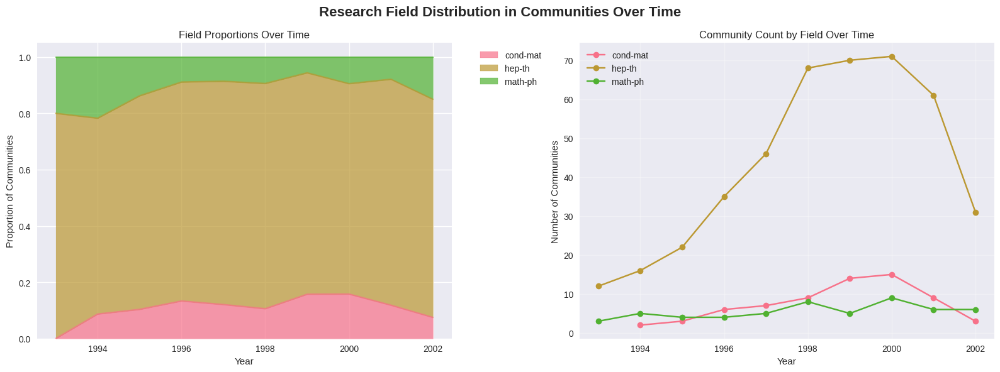

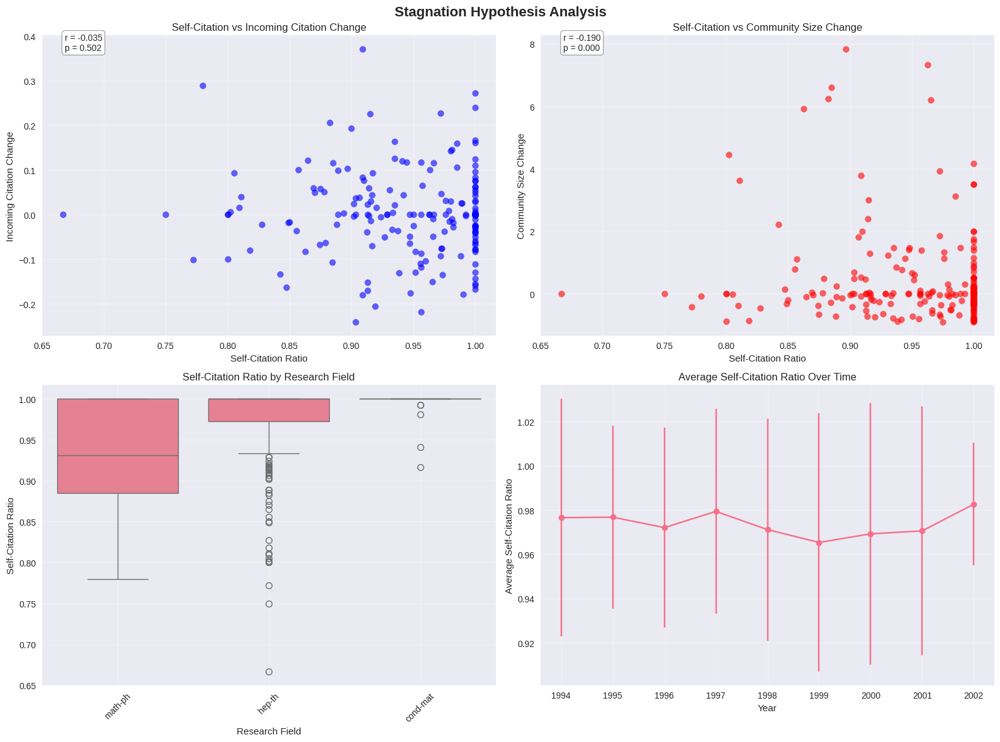

Exporting community-field mapping tables...
Community-field mapping saved to 'community_field_mapping.csv'

Community-Field Mapping Summary:
Total communities analyzed: 555
Years covered: 1993 - 2002
Fields identified: ['math-ph' 'hep-th' 'cond-mat']
Average field purity: 0.928

Enhanced Analysis Summary:
- Analyzed 11 time periods
- Total communities with field mapping: 555
- Research fields identified: 3
- Stagnation hypothesis support: Weak/No


In [9]:
# Set visualization style
plt.style.use('seaborn-v0_8')
sns.set_palette("husl")
from scipy.stats import skew, pearsonr


def load_and_preprocess_data_with_fields():
    """Load and preprocess citation network data with field information"""
    print("Loading citation network data with field mapping...")

    # Load citation edges
    edges_df = pd.read_csv("Cit-HepTh.txt", comment='#', sep='\t', names=['source', 'target'])

    # Load metadata with year and field information
    merged_df = pd.read_csv("/content/metadata_with_dates.csv")

    # Check if field/category information exists in metadata
    field_columns = [col for col in merged_df.columns if 'field' in col.lower() or 'category' in col.lower() or 'subject' in col.lower()]
    if field_columns:
        print(f"Found field columns: {field_columns}")
        field_col = field_columns[0]  # Use the first field column
    else:
        # If no explicit field column, try to extract from paper_id (ArXiv format)
        print("No explicit field column found. Attempting to extract from paper_id...")
        merged_df['field'] = merged_df['paper_id'].astype(str).str.extract(r'([a-z-]+)/', expand=False)
        field_col = 'field'

    # Merge year and field information
    edges_df = pd.merge(edges_df, merged_df[['paper_id', 'year', field_col]],
                       left_on='source', right_on='paper_id', how='left')
    edges_df = edges_df.drop(columns=['paper_id'])
    edges_df = edges_df.rename(columns={field_col: 'source_field'})

    # Also get target field information
    edges_df = pd.merge(edges_df, merged_df[['paper_id', field_col]],
                       left_on='target', right_on='paper_id', how='left')
    edges_df = edges_df.drop(columns=['paper_id'])
    edges_df = edges_df.rename(columns={field_col: 'target_field'})

    # Filter by year range
    edges_df = edges_df[(edges_df['year'] >= 1992) & (edges_df['year'] <= 2003)]

    print(f"Loaded {len(edges_df)} citation edges from {edges_df['year'].min()} to {edges_df['year'].max()}")

    # Print field distribution
    if 'source_field' in edges_df.columns:
        print(f"Fields found: {sorted(edges_df['source_field'].dropna().unique())}")

    return edges_df, merged_df

def map_communities_to_fields(partition, field_mapping):
    """Map communities to their dominant research fields"""
    community_fields = defaultdict(lambda: defaultdict(int))

    # Count field occurrences in each community
    for node, community in partition.items():
        if node in field_mapping and field_mapping[node] is not None:
            field = field_mapping[node]
            community_fields[community][field] += 1

    # Determine dominant field for each community
    community_dominant_fields = {}
    for community, field_counts in community_fields.items():
        if field_counts:
            dominant_field = max(field_counts.items(), key=lambda x: x[1])[0]
            total_nodes = sum(field_counts.values())
            dominant_ratio = field_counts[dominant_field] / total_nodes
            community_dominant_fields[community] = {
                'field': dominant_field,
                'ratio': dominant_ratio,
                'field_distribution': dict(field_counts)
            }

    return community_dominant_fields

# Community Analysis with Field Information
def compute_enhanced_metrics(G, partition, field_mapping):
    """Compute enhanced structural metrics including field diversity"""
    comm_metrics = defaultdict(dict)

    if len(partition) == 0:
        return comm_metrics

    # Map communities to fields
    community_fields = map_communities_to_fields(partition, field_mapping)

    for comm_id in set(partition.values()):
        nodes = [n for n in partition if partition[n] == comm_id]
        subgraph = G.subgraph(nodes)

        comm_metrics[comm_id]['size'] = len(nodes)
        comm_metrics[comm_id]['modularity'] = compute_modularity(G.to_undirected(), partition)

        # Field information
        if comm_id in community_fields:
            comm_metrics[comm_id]['dominant_field'] = community_fields[comm_id]['field']
            comm_metrics[comm_id]['field_purity'] = community_fields[comm_id]['ratio']
            comm_metrics[comm_id]['field_distribution'] = community_fields[comm_id]['field_distribution']
        else:
            comm_metrics[comm_id]['dominant_field'] = 'Unknown'
            comm_metrics[comm_id]['field_purity'] = 0
            comm_metrics[comm_id]['field_distribution'] = {}

        # Centrality metrics
        if len(nodes) > 1:
            try:
                betweenness = nx.betweenness_centrality(subgraph)
                comm_metrics[comm_id]['avg_betweenness'] = sum(betweenness.values()) / len(nodes)
                centrality = nx.degree_centrality(subgraph)
                comm_metrics[comm_id]['avg_centrality'] = sum(centrality.values()) / len(nodes)
            except:
                comm_metrics[comm_id]['avg_betweenness'] = 0
                comm_metrics[comm_id]['avg_centrality'] = 0
        else:
            comm_metrics[comm_id]['avg_betweenness'] = 0
            comm_metrics[comm_id]['avg_centrality'] = 0

    return comm_metrics

# Stagnation Hypothesis Analysis
def compute_stagnation_metrics(yearly_graphs, yearly_partitions, yearly_metrics):
    """Compute metrics to test the stagnation hypothesis"""
    print("Computing stagnation metrics...")

    stagnation_data = []
    years = sorted(yearly_graphs.keys())

    for i, year in enumerate(years):
        G = yearly_graphs[year]
        partition = yearly_partitions[year]

        if not partition:
            continue

        # Compute self-citation ratios
        self_citation_ratios = compute_self_citation_ratio(G, partition)

        # Compute incoming citation changes (if we have previous year)
        incoming_citation_changes = {}
        community_size_changes = {}

        if i > 0:
            prev_year = years[i-1]
            prev_G = yearly_graphs[prev_year]
            prev_partition = yearly_partitions[prev_year]

            if prev_partition:
                # Match communities between years
                matches = match_communities(prev_partition, partition)

                for curr_comm, prev_comm in matches.items():
                    if prev_comm is not None:
                        # Calculate incoming citation change
                        curr_nodes = [n for n in partition if partition[n] == curr_comm]
                        prev_nodes = [n for n in prev_partition if prev_partition[n] == prev_comm]

                        # Count incoming edges (from outside the community)
                        curr_incoming = sum(1 for u, v in G.edges()
                                          if v in curr_nodes and partition.get(u) != curr_comm)
                        prev_incoming = sum(1 for u, v in prev_G.edges()
                                          if v in prev_nodes and prev_partition.get(u) != prev_comm)

                        # Calculate change (normalized by community size)
                        curr_size = len(curr_nodes)
                        prev_size = len(prev_nodes)

                        if prev_size > 0 and curr_size > 0:
                            curr_incoming_norm = curr_incoming / curr_size
                            prev_incoming_norm = prev_incoming / prev_size
                            incoming_citation_changes[curr_comm] = curr_incoming_norm - prev_incoming_norm
                            community_size_changes[curr_comm] = (curr_size - prev_size) / prev_size

        # Store data for each community
        for comm_id in set(partition.values()):
            if comm_id in self_citation_ratios:
                row = {
                    'year': year,
                    'community': comm_id,
                    'self_citation_ratio': self_citation_ratios[comm_id],
                    'incoming_citation_change': incoming_citation_changes.get(comm_id, np.nan),
                    'size_change': community_size_changes.get(comm_id, np.nan),
                    'size': yearly_metrics[year][comm_id]['size'],
                    'field': yearly_metrics[year][comm_id].get('dominant_field', 'Unknown')
                }
                stagnation_data.append(row)

    return pd.DataFrame(stagnation_data)

def analyze_stagnation_correlations(stagnation_df):
    """Analyze correlations to test stagnation hypothesis"""
    print("Analyzing stagnation correlations...")

    # Remove rows with NaN values for correlation analysis
    correlation_df = stagnation_df.dropna(subset=['self_citation_ratio', 'incoming_citation_change', 'size_change'])

    if len(correlation_df) < 10:
        print("Insufficient data for correlation analysis")
        return None, None

    # Calculate correlations
    correlations = {}

    # Self-citation ratio vs incoming citation change
    corr_incoming, p_incoming = pearsonr(correlation_df['self_citation_ratio'],
                                        correlation_df['incoming_citation_change'])
    correlations['self_citation_vs_incoming'] = {'correlation': corr_incoming, 'p_value': p_incoming}

    # Self-citation ratio vs community size change
    corr_size, p_size = pearsonr(correlation_df['self_citation_ratio'],
                                correlation_df['size_change'])
    correlations['self_citation_vs_size_change'] = {'correlation': corr_size, 'p_value': p_size}

    # Incoming citations vs size change
    corr_incoming_size, p_incoming_size = pearsonr(correlation_df['incoming_citation_change'],
                                                  correlation_df['size_change'])
    correlations['incoming_vs_size_change'] = {'correlation': corr_incoming_size, 'p_value': p_incoming_size}

    return correlations, correlation_df

# Visualization Functions
def plot_field_distribution_over_time(yearly_metrics):
    """Plot field distribution in communities over time"""
    field_data = []

    for year, metrics in yearly_metrics.items():
        field_counts = defaultdict(int)
        total_communities = len(metrics)

        for comm_id, comm_data in metrics.items():
            field = comm_data.get('dominant_field', 'Unknown')
            field_counts[field] += 1

        for field, count in field_counts.items():
            field_data.append({
                'year': year,
                'field': field,
                'count': count,
                'proportion': count / total_communities if total_communities > 0 else 0
            })

    df = pd.DataFrame(field_data)

    if len(df) == 0:
        print("No field data available for visualization")
        return

    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 6))
    fig.suptitle('Research Field Distribution in Communities Over Time', fontsize=16, fontweight='bold')

    # Stacked area plot for proportions
    pivot_prop = df.pivot(index='year', columns='field', values='proportion').fillna(0)
    pivot_prop.plot(kind='area', stacked=True, ax=ax1, alpha=0.7)
    ax1.set_title('Field Proportions Over Time')
    ax1.set_xlabel('Year')
    ax1.set_ylabel('Proportion of Communities')
    ax1.legend(bbox_to_anchor=(1.05, 1), loc='upper left')

    # Line plot for absolute counts
    for field in pivot_prop.columns:
        if field != 'Unknown':  # Exclude unknown field for clarity
            field_years = df[df['field'] == field]
            ax2.plot(field_years['year'], field_years['count'], marker='o', label=field)

    ax2.set_title('Community Count by Field Over Time')
    ax2.set_xlabel('Year')
    ax2.set_ylabel('Number of Communities')
    ax2.legend()
    ax2.grid(True, alpha=0.3)

    plt.tight_layout()
    plt.show()

def plot_stagnation_analysis(stagnation_df, correlations):
    """Plot stagnation hypothesis analysis results"""
    fig, axes = plt.subplots(2, 2, figsize=(16, 12))
    fig.suptitle('Stagnation Hypothesis Analysis', fontsize=16, fontweight='bold')

    # Filter out NaN values for plotting
    plot_df = stagnation_df.dropna(subset=['self_citation_ratio', 'incoming_citation_change', 'size_change'])

    if len(plot_df) == 0:
        print("No valid data for stagnation analysis plots")
        return

    # Self-citation ratio vs incoming citation change
    axes[0, 0].scatter(plot_df['self_citation_ratio'], plot_df['incoming_citation_change'],
                      alpha=0.6, color='blue')
    axes[0, 0].set_xlabel('Self-Citation Ratio')
    axes[0, 0].set_ylabel('Incoming Citation Change')
    axes[0, 0].set_title('Self-Citation vs Incoming Citation Change')

    if correlations and 'self_citation_vs_incoming' in correlations:
        corr = correlations['self_citation_vs_incoming']
        axes[0, 0].text(0.05, 0.95, f"r = {corr['correlation']:.3f}\np = {corr['p_value']:.3f}",
                       transform=axes[0, 0].transAxes, bbox=dict(boxstyle="round", facecolor='white'))

    # Self-citation ratio vs community size change
    axes[0, 1].scatter(plot_df['self_citation_ratio'], plot_df['size_change'],
                      alpha=0.6, color='red')
    axes[0, 1].set_xlabel('Self-Citation Ratio')
    axes[0, 1].set_ylabel('Community Size Change')
    axes[0, 1].set_title('Self-Citation vs Community Size Change')

    if correlations and 'self_citation_vs_size_change' in correlations:
        corr = correlations['self_citation_vs_size_change']
        axes[0, 1].text(0.05, 0.95, f"r = {corr['correlation']:.3f}\np = {corr['p_value']:.3f}",
                       transform=axes[0, 1].transAxes, bbox=dict(boxstyle="round", facecolor='white'))

    # Self-citation ratio by field
    if 'field' in plot_df.columns:
        field_counts = plot_df['field'].value_counts()
        top_fields = field_counts.head(5).index  # Show top 5 fields
        field_plot_df = plot_df[plot_df['field'].isin(top_fields)]

        sns.boxplot(data=field_plot_df, x='field', y='self_citation_ratio', ax=axes[1, 0])
        axes[1, 0].set_title('Self-Citation Ratio by Research Field')
        axes[1, 0].set_xlabel('Research Field')
        axes[1, 0].set_ylabel('Self-Citation Ratio')
        axes[1, 0].tick_params(axis='x', rotation=45)

    # Temporal trend of self-citation ratio
    temporal_stats = plot_df.groupby('year')['self_citation_ratio'].agg(['mean', 'std']).reset_index()
    axes[1, 1].errorbar(temporal_stats['year'], temporal_stats['mean'],
                       yerr=temporal_stats['std'], marker='o', capsize=5)
    axes[1, 1].set_title('Average Self-Citation Ratio Over Time')
    axes[1, 1].set_xlabel('Year')
    axes[1, 1].set_ylabel('Average Self-Citation Ratio')
    axes[1, 1].grid(True, alpha=0.3)

    for ax in axes.flat:
        ax.grid(True, alpha=0.3)

    plt.tight_layout()
    plt.show()

def export_community_field_tables(yearly_metrics, yearly_partitions):
    """Export detailed tables of communities and their field mappings"""
    print("Exporting community-field mapping tables...")

    all_data = []

    for year, metrics in yearly_metrics.items():
        for comm_id, comm_data in metrics.items():
            row = {
                'year': year,
                'community_id': comm_id,
                'size': comm_data['size'],
                'dominant_field': comm_data.get('dominant_field', 'Unknown'),
                'field_purity': comm_data.get('field_purity', 0),
                'modularity': comm_data['modularity'],
                'avg_betweenness': comm_data['avg_betweenness'],
                'avg_centrality': comm_data['avg_centrality']
            }

            # Add field distribution details
            field_dist = comm_data.get('field_distribution', {})
            for field, count in field_dist.items():
                row[f'field_{field}_count'] = count

            all_data.append(row)

    df = pd.DataFrame(all_data)

    # Save to CSV
    df.to_csv('community_field_mapping.csv', index=False)
    print("Community-field mapping saved to 'community_field_mapping.csv'")

    # Display summary statistics
    print("\nCommunity-Field Mapping Summary:")
    print(f"Total communities analyzed: {len(df)}")
    print(f"Years covered: {df['year'].min()} - {df['year'].max()}")
    print(f"Fields identified: {df['dominant_field'].unique()}")
    print(f"Average field purity: {df['field_purity'].mean():.3f}")

    return df

# Main Analysis Pipeline
def run_enhanced_citation_analysis():
    """Main function to run the enhanced citation network analysis"""
    print("Starting Enhanced Citation Network Analysis...")


    # Load data with field information
    edges_df, metadata_df = load_and_preprocess_data_with_fields()

    # Create field mapping dictionary
    field_mapping = dict(zip(metadata_df['paper_id'],
                           metadata_df.get('field', metadata_df.get('source_field', None))))

    # Build yearly graphs
    yearly_graphs = build_yearly_graphs(edges_df, window=3)

    # community detection and metrics
    print("\nDetecting communities and computing enhanced metrics...")
    yearly_partitions = {}
    yearly_metrics = {}
    community_matches = {}

    for year in sorted(yearly_graphs.keys()):
        print(f"Processing year {year}...")
        G = yearly_graphs[year]

        # Detect communities
        partition = detect_communities(G)
        yearly_partitions[year] = partition

        # Compute enhanced metrics with field information
        metrics = compute_enhanced_metrics(G, partition, field_mapping)
        yearly_metrics[year] = metrics

        # Match communities with previous year
        prev_year = year - 1
        if prev_year in yearly_partitions and yearly_partitions[prev_year]:
            matches = match_communities(yearly_partitions[prev_year], partition)
            community_matches[year] = matches

        print(f"  Found {len(set(partition.values())) if partition else 0} communities")

    # Stagnation hypothesis analysis
    print("\nAnalyzing stagnation hypothesis...")
    stagnation_df = compute_stagnation_metrics(yearly_graphs, yearly_partitions, yearly_metrics)
    correlations, correlation_df = analyze_stagnation_correlations(stagnation_df)

    if correlations:
        print("\nStagnation Hypothesis Results:")
        print(f"Self-citation vs Incoming citation change: r = {correlations['self_citation_vs_incoming']['correlation']:.3f}, p = {correlations['self_citation_vs_incoming']['p_value']:.3f}")
        print(f"Self-citation vs Community size change: r = {correlations['self_citation_vs_size_change']['correlation']:.3f}, p = {correlations['self_citation_vs_size_change']['p_value']:.3f}")

    # visualizations
    print("\nGenerating enhanced visualizations...")

    # Field distribution analysis
    plot_field_distribution_over_time(yearly_metrics)

    # Stagnation analysis plots
    plot_stagnation_analysis(stagnation_df, correlations)

    # Export community-field mapping tables
    community_df = export_community_field_tables(yearly_metrics, yearly_partitions)

    # ummary statistics
    print("\nEnhanced Analysis Summary:")
    print(f"- Analyzed {len(yearly_graphs)} time periods")
    print(f"- Total communities with field mapping: {len(community_df)}")
    print(f"- Research fields identified: {len(community_df['dominant_field'].unique())}")
    if correlations:
        print(f"- Stagnation hypothesis support: {'Yes' if correlations['self_citation_vs_incoming']['correlation'] < -0.1 else 'Weak/No'}")

    return {
        'yearly_graphs': yearly_graphs,
        'yearly_partitions': yearly_partitions,
        'yearly_metrics': yearly_metrics,
        'community_matches': community_matches,
        'stagnation_df': stagnation_df,
        'correlations': correlations,
        'community_df': community_df
    }


if __name__ == "__main__":
    results = run_enhanced_citation_analysis()